In [9]:
from helpers.utilities import *
%run helpers/notebook_setup.ipynb

In [10]:
%R source('plots/colors.R');

### Notes on the choice of limma-voom over DESeq2:
 - the author of DESeq2 acknowledged that the differences are not significant and provides very through comparative analysis: [blogpost](https://mikelove.wordpress.com/2016/09/28/deseq2-or-edger/), [all plots](https://github.com/mikelove/deseq2_or_edger/blob/master/plots.md), [code](https://github.com/mikelove/deseq2_or_edger)
 - in my empirical experience many scientists oppose the use of limma for RNASeq data, which seems to based be an artifact of the past; granted original limma is worse than many methods for RNASeq data, though for several years now (4? 5?) limma with trend correction/voom has entered the field achieving comparable or better results than most of the methods.
 - this may have been exacerbated by the benchmarking differences in the DESeq2 publication, which as author states in the linked blog post:  
  >  "My original 2014 analysis did not use CPM filtering for edgeR or limma-voom, which should be used for an accurate assessment [...] The figure looks roughly similar to (1 – precision) in Figure 9 of the DESeq2 paper (thresholding at 10% nominal FDR), except the CPM filtering definitely improves the performance of limma-voom."
 - finally, I want to use limma-voom as to have a consistent methodology between proteomic and transcriptomic data and this is the main argument; while I am sure that DESeq2 is better than voom for certain applications, the nice gain of reducing the burden of differences between methods justifies the choice in my opinion.
 
Some support for my sentiment - have a look at https://www.biostars.org/p/284775/#382693 (and my comment); the reply was written 1.5 years ago but uses publication from 2013 - 6 years ago (before the release of DESeq2 and limma-trend/voom!). Conclusion: when releasing an improved method, better change the name...

### Comparative studies for limma/DESeq2:
 - https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6509820/
 - https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0103207 (2014):
     - does not take limma-voom into account, really outdated
 - https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0190152 (2018)
     - DESeq2 the best, though only slightly better than limma+voom (F1 0.88 vs 0.85, TPR 0.84 vs 0.81)
     - external validity limited by small number of experimental designs considered (Mike Love’s blog post highlighted that the major difference between the methods is in how they perform against low/large numbers of samples in groups and outliers)
     - authors summary:
       > The NOIseq, DESeq2 and limma+voom methods performed well, with high TPR and ACC rates. The limma+voom tool had already been pointed out in previous works as one of the better results in the DEG ranking and for analyses with more than two samples [22]. NOIseq and DESeq2 tools showed consistent results, indicating these methods are suitable for experiments with a large number of samples and an annotated genome.
     - the authors claim that combining results from five methods is even better than each individual one  (which seems plausible, did not read at critical level yet though)

Inputs:

In [11]:
clinical_deseq2_path = 'data/clean/rna/clinical_data_ordered_to_match_rna_deseq2.csv'
clinical_counts_path = 'data/clean/rna/clinical_data_ordered_to_match_rna_counts.csv'

# normalized counts
deseq2_path = 'data/clean/rna/all_samples.csv'
# raw counts
counts_path = 'data/clean/rna/all_samples_counts.csv'

ensembl_to_entrez_path = 'data/ensembl_to_entrez.csv'

# for comparison
definite_tbm_cm_deg_path = 'data/preliminary_analyses/deg/definite_tbm-cm.csv'
definite_tbm_vm_deg_path = 'data/preliminary_analyses/deg/definite_tbm-vm.csv'

Outputs:

In [12]:
results_path = 'data/preliminary_analyses/differential_rna_expression/'
normalized_counts_path = Path(results_path) / 'normalized_counts'

In [13]:
clinical_deseq2 = read_csv(clinical_deseq2_path, index_col=0)
clinical_counts = read_csv(clinical_counts_path, index_col=0)

raw_deseq2_matrix = read_csv(deseq2_path, index_col=[0, 1])
raw_counts_matrix = read_csv(counts_path, index_col=0)

reference_definite_tbm_cm_deg = read_csv(definite_tbm_cm_deg_path, index_col=0)
reference_definite_tbm_vm_deg = read_csv(definite_tbm_vm_deg_path, index_col=0)

In [14]:
reference_definite_tbm_cm_deg.head()

,ensembl_gene_name,description,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ensembl_id,,,,,,,,
ENSG00000100226,GTPBP1,GTP binding protein 1,580.453924,1.192190,0.219708,5.426243,5.755269e-08,0.000517
ENSG00000165997,ARL5B,ADP ribosylation factor like GTPase 5B,222.402492,1.963330,0.393233,4.992789,5.951353e-07,0.001903
ENSG00000164691,TAGAP,T-cell activation RhoGTPase activating protein,1023.319959,1.964425,0.394441,4.980279,6.349261e-07,0.001903
ENSG00000108771,DHX58,DExH-box helicase 58,125.298558,1.785542,0.367150,4.863249,1.154747e-06,0.002481
ENSG00000128016,ZFP36,ZFP36 ring finger protein,2070.881325,1.683438,0.348691,4.827880,1.379940e-06,0.002481


In [15]:
raw_counts_matrix.head()

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,158.TMD,167.TMR,175.TMD,233.CM,261.CM
ENSG00000000003,1.0,3.0,2.00,16.00,25.00,...,0.0,0.0,0.0,0.0,25.00
ENSG00000000005,0.0,0.0,0.00,1.00,0.00,...,0.0,0.0,0.0,0.0,5.00
ENSG00000000419,0.0,12.0,53.00,0.00,73.00,...,0.0,0.0,0.0,0.0,48.00
ENSG00000000457,11.0,56.0,123.84,38.72,124.95,...,0.0,0.0,0.0,0.0,151.94
ENSG00000000460,4.0,0.0,73.16,21.28,15.05,...,0.0,0.0,0.0,0.0,37.06


In [16]:
# note: this is already limitted to the patients having the RNASeq measurments
by_condition = clinical_deseq2.Meningitis
by_condition_and_tb_subset = clinical_deseq2.Meningitis_with_tuberculosis_status
by_condition_and_tb_subset.head()

001.TMD    Definite tuberculosis
006.CM              Cryptococcal
012.BM                 Bacterial
016.CM              Cryptococcal
017.TMD    Definite tuberculosis
Name: Meningitis_with_tuberculosis_status, dtype: object

In [17]:
%R -i by_condition_and_tb_subset -i by_condition

In [18]:
raw_deseq2_matrix = raw_deseq2_matrix.reset_index()
raw_deseq2_matrix = raw_deseq2_matrix.drop(columns=['ensembl_gene_id']).set_index('ensembl_id')

## Using DESeq2 normalized counts

### What are the DESeq2 normalized counts?

In [19]:
%%R
import::here(space_to_dot, dot_to_space, remove_leading_X, .from='helpers/utilities.R')

In [20]:
%%R -i raw_counts_matrix -i raw_deseq2_matrix
colnames(raw_counts_matrix) = remove_leading_X(colnames(raw_counts_matrix))
colnames(raw_deseq2_matrix) = remove_leading_X(colnames(raw_deseq2_matrix))

In [21]:
raw_deseq2_matrix.head(n=2)

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,174.CM,011.TMR,043.TMS,078.CM,261.CM
ensembl_id,,,,,,,,,,,
ENSG00000000003,11.596119,7.806308,1.391555,39.347366,24.765008,...,4.431071,51.810470,35.628629,0.0,20.705553
ENSG00000000005,0.000000,0.000000,0.000000,2.459210,0.000000,...,0.000000,11.102244,0.000000,0.0,4.141111


In [22]:
raw_counts_matrix.head(n=2)

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,158.TMD,167.TMR,175.TMD,233.CM,261.CM
ENSG00000000003,1.0,3.0,2.0,16.0,25.0,...,0.0,0.0,0.0,0.0,25.0
ENSG00000000005,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,5.0


As expected, there is a considerable difference between the "raw" RSEM counts and the DESeq2 normalized counts: 

In [23]:
%%R
reference_samples = colnames(raw_deseq2_matrix)
reference_genes = rownames(raw_deseq2_matrix)

raw_counts_trimmed = raw_counts_matrix[reference_genes, reference_samples]

relative_mean_diff = function(a, b) {
    ma = mean(rowMeans(a))
    mb = mean(rowMeans(b))
    mean(rowMeans(
        abs(a / ma - b / mb) * 100,
    ))
}

relative_mean_diff(raw_deseq2_matrix, raw_counts_trimmed)

[1] 61.80482


#### Can I recreate the DESeq2 normalization?

In [24]:
%%R
conditions_for_deseq = by_condition_and_tb_subset[reference_samples, drop=F]

dds <- DESeq2::DESeqDataSetFromMatrix(
    countData = round(raw_counts_trimmed),
    colData = as.data.frame(conditions_for_deseq),
    design = ~ conditions_for_deseq
)
# DESeq call can be skipped, as it performs dispersion estimation
# and GLM fitting which are not required for size estimation,
# see https://support.bioconductor.org/p/109586/
# dds <- DESeq2::DESeq(dds)
dds <- DESeq2::estimateSizeFactors(dds)

converting counts to integer mode
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]


In [25]:
%%R -o normalized_counts
normalized_counts = as.data.frame(DESeq2::counts(dds, normalized=TRUE))

In [26]:
%%R
relative_mean_diff(raw_deseq2_matrix, normalized_counts)

[1] 9.977589e-09


Yes. This is exactly what I was given.

I understand that the very small difference is due to rounding precision and the file being exported to Excel and then imported in Python; on the high level the values are close enough though:

In [27]:
np.allclose(normalized_counts.values, raw_deseq2_matrix.values)

True

In [28]:
normalized_counts.head(2)

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,174.CM,011.TMR,043.TMS,078.CM,261.CM
ENSG00000000003,11.596119,7.806308,1.391555,39.347366,24.765008,...,4.431071,51.810470,35.628629,0.0,20.705553
ENSG00000000005,0.000000,0.000000,0.000000,2.459210,0.000000,...,0.000000,11.102244,0.000000,0.0,4.141111


In [29]:
raw_deseq2_matrix.head(2)

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,174.CM,011.TMR,043.TMS,078.CM,261.CM
ensembl_id,,,,,,,,,,,
ENSG00000000003,11.596119,7.806308,1.391555,39.347366,24.765008,...,4.431071,51.810470,35.628629,0.0,20.705553
ENSG00000000005,0.000000,0.000000,0.000000,2.459210,0.000000,...,0.000000,11.102244,0.000000,0.0,4.141111


The normalization shown above [corresponds to](https://support.bioconductor.org/p/66067/):

In [30]:
%%R -o counts_normalized_manually
counts_normalized_manually = as.data.frame(DESeq2::counts(dds) / DESeq2::sizeFactors(dds))

Notably, these normalised counts are not really used so much in the actual DESeq2 method, just for the mean-variance trend estimation:

> The point of the software and other count-based methods is to model the raw counts, so that estimation steps take into account the variance profile of counts. If you look over the methods, you'll see that almost all steps use K_ij which is the raw count for gene i and sample j. The normalized counts K_ij/s_j are only used to give each gene a single mean value for the dispersion trend regression (equation 5). [https://support.bioconductor.org/p/66067/#66081]

And the size factors are computed using:
> "median ratio method" described by Equation 5 in Anders and Huber (2010) [(DESeq2 documentation, estimateSizeFactors)](https://www.rdocumentation.org/packages/DESeq2/versions/1.12.3/topics/estimateSizeFactors)

The size factors are meant to make counts for different samples (patients) comparable; DESeq uses median of ratios of counts to geometric mean of counts in each sample [(Anders and Huber, 2010)](https://genomebiology.biomedcentral.com/articles/10.1186/gb-2010-11-10-r106):

$$\hat s_j = \text{median}_{i=1}^n \frac{k_{i,j}}{\left(\prod^m_{v=1} k_{i,v}\right)^{1/m}}$$

where:
 - $i$ indexes genes ($n$ in total)
 - $j$ and $v$ indexes samples, $m$ in total
 - $k_{i,j}$ represents raw count for gene $i$ and sample $j$

### Filtering and normalization

Using protocol from limma's User Guide:

In [31]:
%%R
import::here(
    design_from_conditions, calculate_means, limma_fit, contrasts_fit,
    .from='helpers/differential_expression.R'
)

In [32]:
%%R
dge_all <- edgeR::DGEList(counts=raw_deseq2_matrix, group=by_condition)
design = design_from_conditions(by_condition, intercept=F)
length(rownames(dge_all))

[1] 38664


Keeping most of the genes. Note this is not fully valid given that this function was written for raw counts data, not normalized data.

In [33]:
%%R
keep <- edgeR::filterByExpr(dge_all, design)
sum(keep) / length(rownames(dge_all)) * 100

[1] 94.54531


In [34]:
%%R
dge <- dge_all[keep,,keep.lib.sizes=FALSE]

Normal procedure for limma/edgeR adds TMM normalization factors now, but since we already have normalized counts I will skip this step.

**Note 1 (TMM)**: TMM stands for *trimmed mean of M-values* which was introduced by [(Robinson and Oshlack, 2010)](https://genomebiology.biomedcentral.com/articles/10.1186/gb-2010-11-3-r25); it is calculated by `edgeR::calcNormFactors` in limma's pipeline. The goal is the same as for the median normalization in DESeq2.

**Note 2 (comparable)**: 
The TMM and DESeq's median based normalization (sometimes called "Relative Log Expression" RLE) were shown to give very comparable results in simulation studies [(Maza, 2013)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3918003/) [see table 2] and [(Dillies et al, 2012)](https://academic.oup.com/bib/article/14/6/671/189645) [see table 3] and may produce equivalent results under some additional assumptions [(Maza, 2016)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5025571/).

**Note 3 (assumptions)**: Both assume that they can capture the scaling factor from the non-differentially expressed genes (see [here](https://support.bioconductor.org/p/63630/) for some more intuition). **This could be a problem in our study design...** But do we have anything better?

### Transformation

The TMM normalization factors would be used by `edgeR::cpm` now; however, as in this case the counts are already normalized I will use simpler, equivalent log2-transformation (corresponds to `edgeR::cpm(dge, log=T, prior.count=0.25)`)

In [35]:
%%R
log_cpm = log2(dge$counts + 0.25)

**Note**: previously I was adding `eps = .Machine$double.eps` as a damping factor and the very low numbers (while not technically zero) were the cause of the "stripy" patterns in average log-expression/variance:
because these led to high negative log-expression values, the quantification of read counts started to emerge on the x axis: the damping factor not only prevents the infinite values of the log function, but also "attracts" the values for counts closer together.

In [36]:
%R head(as.data.frame(log_cpm), n=2)

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,174.CM,011.TMR,043.TMS,078.CM,261.CM
ENSG00000000003,3.566343,3.010119,0.715063,5.307333,4.644722,...,2.226839,5.702116,5.165053,-2.0,4.389261
ENSG00000000005,-2.000000,-2.000000,-2.000000,1.437872,-2.000000,...,-2.000000,3.504906,-2.000000,-2.0,2.134586


### Fitting

#### Assessing the the mean-variance relation

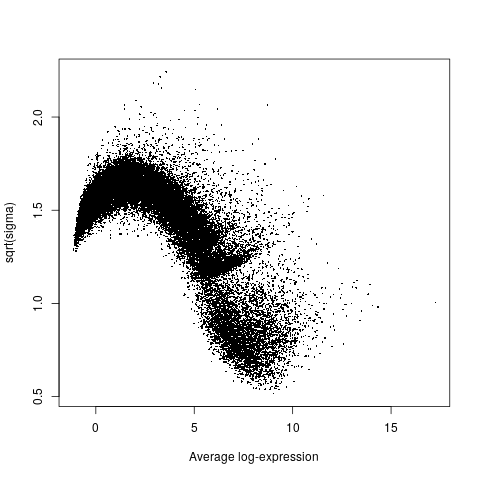

In [37]:
%%R
fit <- limma_fit(data=log_cpm, conditions=by_condition, a='Tuberculosis', b='Cryptococcal')
limma::plotSA(fit)

It looks ok, though the cut-off might have been more stringent. There is one suspected outlier (very highly expressed gene), but this one seems to be present across samples (see the raw-counts analysis).

In [38]:
%%R
limma_dge = function(a, b, data, conditions, ...) {
    raw_fit <- limma_fit(data=data, conditions_vector=conditions, a=a, b=b)
    fit <- limma::eBayes(raw_fit, trend=T, robust=T)
    limma::topTable(fit, ...)
}

In [39]:
%R limma_dge('Tuberculosis', 'Cryptococcal', log_cpm, by_condition)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000241313,-3.750636,1.848536,-4.984593,0.000004,0.116133,3.683285
ENSG00000280809,-3.551704,1.393227,-4.891309,0.000006,0.116133,3.388815
ENSG00000179412,-3.687491,0.189983,-4.743796,0.000011,0.134419,2.927865
ENSG00000266486,-3.409226,0.586013,-4.453012,0.000032,0.138453,2.037845
ENSG00000271397,-3.137736,0.096760,-4.436862,0.000034,0.138453,1.989197
ENSG00000264714,-3.703843,2.563455,-4.395959,0.000039,0.138453,1.866380
ENSG00000187848,-3.289822,0.776672,-4.373313,0.000043,0.138453,1.798626
ENSG00000272975,-3.592755,1.430871,-4.358725,0.000045,0.138453,1.755073
ENSG00000224791,-3.359333,0.902272,-4.342054,0.000048,0.138453,1.705393
ENSG00000158163,-3.175936,3.185874,-4.334336,0.000049,0.138453,1.682425


The adjusted p-values seem relatively high.

#### Comparing top genes called by limma and by DESeq2

In [40]:
%%R -o definite_tb_cm
definite_tb_cm = limma_dge('Definite tuberculosis', 'Cryptococcal', log_cpm, by_condition_and_tb_subset, n=15)

In [41]:
definite_tb_cm.head()

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000104415,-4.554774,3.116708,-5.510924,6.026732e-07,0.022031,4.849606
ENSG00000231768,-4.365053,2.347671,-4.731515,1.178258e-05,0.205418,2.539558
ENSG00000100226,1.024016,8.934570,4.634202,1.685828e-05,0.205418,2.260183
ENSG00000117298,1.416507,8.918096,4.548234,2.466147e-05,0.225375,1.962215
ENSG00000213568,-3.904801,0.613604,-4.417650,3.696268e-05,0.270234,1.647534


The p-values are lower (possibly we get more consistent support for these DEGs) while the adjusted p-values get higher (possibly due to fewer samples giving the support).

In [42]:
reference_definite_tbm_cm_deg.head()

,ensembl_gene_name,description,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ensembl_id,,,,,,,,
ENSG00000100226,GTPBP1,GTP binding protein 1,580.453924,1.192190,0.219708,5.426243,5.755269e-08,0.000517
ENSG00000165997,ARL5B,ADP ribosylation factor like GTPase 5B,222.402492,1.963330,0.393233,4.992789,5.951353e-07,0.001903
ENSG00000164691,TAGAP,T-cell activation RhoGTPase activating protein,1023.319959,1.964425,0.394441,4.980279,6.349261e-07,0.001903
ENSG00000108771,DHX58,DExH-box helicase 58,125.298558,1.785542,0.367150,4.863249,1.154747e-06,0.002481
ENSG00000128016,ZFP36,ZFP36 ring finger protein,2070.881325,1.683438,0.348691,4.827880,1.379940e-06,0.002481


In [43]:
top_reference = reference_definite_tbm_cm_deg.head(15).index
top_limma = definite_tb_cm.index

In [44]:
intersection = set(top_reference) & set(top_limma)
intersection

{'ENSG00000100226',
 'ENSG00000108771',
 'ENSG00000117298',
 'ENSG00000155363',
 'ENSG00000185507'}

5 out of 15 - not bad; however the only "significant" gene: ENSG00000104415 was not scored as high by DESeq2; was it deemed significant at all?

In [45]:
reference_definite_tbm_cm_deg.loc[['ENSG00000104415']]

,ensembl_gene_name,description,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ensembl_id,,,,,,,,
ENSG00000104415,WISP1,WNT1 inducible signaling pathway protein 1,22.30457,-2.882794,0.623437,-4.624037,0.000004,NaN


Well... what does NaN mean for adjusted p-value?

> If a row is filtered by automatic independent filtering, for having a low mean normalized count, then only the adjusted p value will be set to  NA. Description and customization of independent filtering is described below 
> [(DESeq2 vignette)](https://bioconductor.org/packages/release/bioc/vignettes/DESeq2/inst/doc/DESeq2.html#pvaluesNA)

So the independent filtering is an interesting way (or trick) of decreasing the FDR/adjusted p-value by disregarding some hypotheses upfront. The criterion used by DESeq2 is having a small number of normalized counts (regardless of the condition). For more details see the plot and explanation in the [DESeq2 vignette](https://bioconductor.org/packages/release/bioc/vignettes/DESeq2/inst/doc/DESeq2.html#indfilttheory).

## Using RSEM counts

These counts are RSEM gene-level expected counts. Can we use limma-voom on RSEM rather than on raw counts?
Yes.

> If you are working with RSEM gene-level expected counts, then you can just pass them to limma as if they were counts. That's what we do. \[limma's author answering [this Bioconductor question](https://support.bioconductor.org/p/84749/#84807)\]

Side note: another, related answer from prof Gordon: https://support.bioconductor.org/p/91054/#91098 highlights use of `normalizeQuantiles` when applying limma to log(counts), but this is not needed for this project generally (as in any case we can proceed with TMM/RLE normalization).

### Outliers

#### Removing patients without clinical data?

The raw counts have for a few patients excluded from initial version of clinical dataset as those were marked as outliers:

In [46]:
patients_initially_excluded = ['233.CM', '167.TMR', '158.TMD']

In [47]:
samples = read_csv('data/clean/samples_list.csv')

assert all(p not in set(samples.sample_id) for p in patients_initially_excluded)

However, data for those patients were added for consistency:

In [48]:
assert all(p in set(clinical_counts.index) for p in patients_initially_excluded)

Let's investigate library sizes of these samples:

In [49]:
patients_absent_in_clinical_data = patients_initially_excluded
patients_absent_in_processsed_counts = set(raw_counts_matrix.columns) - set(raw_deseq2_matrix.columns)

In [50]:
sizes = raw_counts_matrix.sum().to_frame('library_size').reset_index()
sizes['label'] = np.where(
    sizes['index'].isin(patients_absent_in_processsed_counts),
    sizes['index'], ''
)
absent_samples = (
    set(patients_absent_in_clinical_data)
    |
    set(patients_absent_in_processsed_counts)
)
sizes['status'] = sizes.apply(lambda sample: (
    'Present'
    if sample['index'] not in absent_samples else
    (
        'Excluded in inital clinical datasheet'
        if sample['index'] in patients_absent_in_clinical_data else
        'Absent in processed counts'
    )
), axis=1)

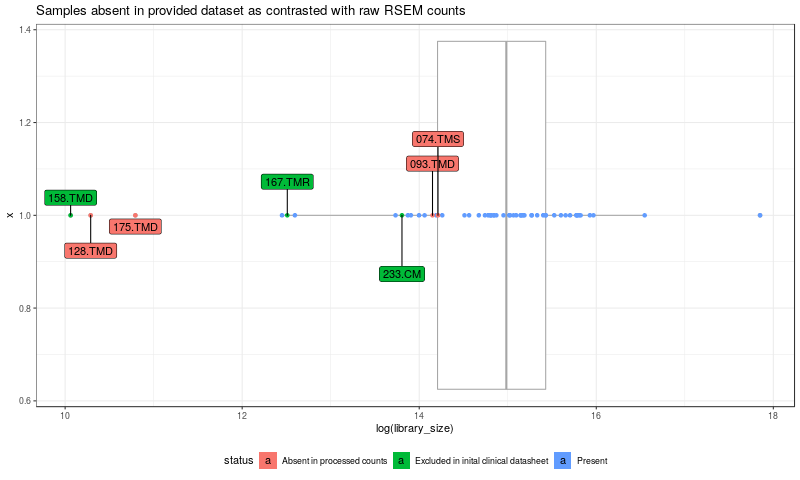

In [51]:
%%R -i sizes -w 800
set.seed(0)
(
    ggplot(sizes, aes(x=1, y=log(library_size), label=label))
    + nice_theme
    + geom_boxplot(color='grey65')
    + geom_point(aes(color=status))
    + coord_flip()
    + ggrepel::geom_label_repel(aes(fill=status), force=6, direction="y")
    + ggtitle('Samples absent in provided dataset as contrasted with raw RSEM counts')
)

Removal of `158.TMD` seems easily warranted (law library size). Not sure about others though.

While I could deduce the subgroup, I am not certain if I should be using these..
I will discard the three patients without the data for now as it is easier to include them later than rewrite to discard:

In [52]:
without_absent = 'index not in @patients_initially_excluded'

clinical_counts_subset = clinical_counts.query(without_absent)
raw_counts_matrix_subset = raw_counts_matrix.T.query(without_absent).T

In [53]:
c_by_condition = clinical_counts_subset.Meningitis
c_by_condition_and_tb_subset = clinical_counts_subset.Meningitis_with_tuberculosis_status

In [54]:
%R -i c_by_condition -i c_by_condition_and_tb_subset -i raw_counts_matrix_subset

#### Comparison to samples (patients) removed for DESeq2

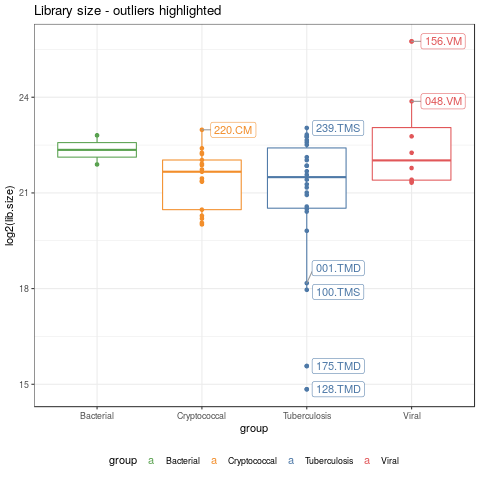

In [55]:
%%R
f_dge <- edgeR::DGEList(counts=raw_counts_matrix_subset, group=c_by_condition)
samples = f_dge$samples
sample_names = remove_leading_X(rownames(samples))
sample_size = log2(samples$lib.size)
samples$sample = ifelse(sample_size > 22.9 | sample_size < 19, sample_names, '')
(
    ggplot(samples, aes(color=group, x=group, y=log2(lib.size), label=sample))
    + geom_boxplot() + geom_point()
    + ggrepel::geom_label_repel(force=6, nudge_x=0.3, segment.color='grey60')
    + scale_color_manual(values=patient_colors$Meningitis)
    + nice_theme
    + ggtitle('Library size - outliers highlighted')
)

In [56]:
set(raw_counts_matrix.columns) - set(raw_deseq2_matrix.columns)

{'074.TMS', '093.TMD', '128.TMD', '158.TMD', '167.TMR', '175.TMD', '233.CM'}

In [57]:
set(raw_counts_matrix_subset.columns) - set(raw_deseq2_matrix.columns)

{'074.TMS', '093.TMD', '128.TMD', '175.TMD'}

For DESeq2 four samples more were excluded:
- I understand exclusion of `175.TMD` and `128.TMD` (very low library size)
- I was not sure why `093.TMD` and `074.TMS` were excluded; dr Rachel provided criteria as follows:
  - Rows (gene) filter
    - Expression threshold (min. read count) = 1
    - Required percentage (min. percentage of columns/samples required to pass the expression threshold) = 25
  - Column (sample) filter
    - Expression threshold = 1
    - Required percentage (min. percentage of genes required to pass the threshold) = 50

While I was not able to exactly replicate the results in Python, the samples that I filtered using this criteria are a superset of the missing samples, so it seems ok:

In [58]:
gene_filtered = raw_counts_matrix.iloc[list((raw_counts_matrix >= 1).apply(mean, axis=1) >= 0.25),:]
sample_filtered = gene_filtered.iloc[:,list((gene_filtered >= 1).apply(mean) >= 0.5)]
set(raw_counts_matrix_subset.columns) - set(sample_filtered.columns)

{'028.TMR', '043.TMS', '074.TMS', '093.TMD', '128.TMD', '149.TMD', '175.TMD'}

Also, using 40% works:

In [59]:
gene_filtered = raw_counts_matrix.iloc[list((raw_counts_matrix >= 1).apply(mean, axis=1) >= 0.25),:]
sample_filtered = gene_filtered.iloc[:,list((gene_filtered >= 1).apply(mean) >= 0.4)]
set(raw_counts_matrix_subset.columns) - set(sample_filtered.columns)

{'074.TMS', '093.TMD', '128.TMD', '175.TMD'}

Sanity check: there should be no additional samples in the DESeq2 normalized counts:

In [60]:
assert not set(raw_deseq2_matrix.columns) - set(raw_counts_matrix.columns)

#### Outlier detection will be continued

Given low number of samples and the fact that both limma-voom and DESeq2 can correct for the library size I would be conservative in outlier removal and only remove `128.TMD`, `158.TMD` and `175.TMD` based on the very low library sizes; however it seems alarming that all of these belong to TMD group.

A simple hierarchical clustering confirms that these samples group together due to low absolute expression values:

In [61]:
%R library(pheatmap);

In [62]:
from plots.annotations import generate_patient_annotations

In [63]:
clinical_full = clinical_counts
full_by_condition = clinical_full.Meningitis
full_by_condition_and_tb_subset = clinical_full.Meningitis_with_tuberculosis_status

In [64]:
counts_patient_annotations = generate_patient_annotations(clinical_full)

In [65]:
%%R -i counts_patient_annotations

names(counts_patient_annotations) = dot_to_space(names(counts_patient_annotations))
colnames(raw_counts_matrix) <- remove_leading_X(colnames(raw_counts_matrix))

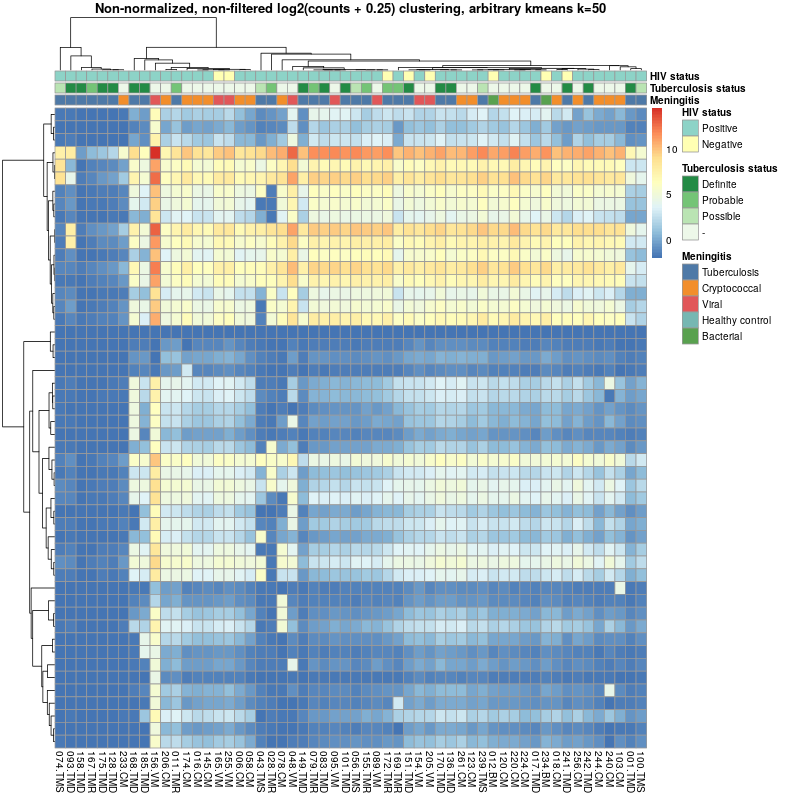

In [66]:
%%R -w 800 -h 800 -i gene_filtered 
set.seed(0)

full_counts_clusters = pheatmap(
    log2(raw_counts_matrix + 0.25),
    show_colnames=T,
    show_rownames=F,
    annotation_col=counts_patient_annotations,
    annotation_colors=patient_colors,
    clustering_method='ward.D2',
    clustering_distance_cols='correlation',
    clustering_distance_rows='correlation',
    kmeans_k=50,
    main='Non-normalized, non-filtered log2(counts + 0.25) clustering, arbitrary kmeans k=50'
)

The four columns to the right does not look right...

However, such analysis is not very informative due to library size differences - I will continue with outlier detection using filtered and normalized data.

### Gene filtering

Note: the filtering uses the design vector, thus it might seem that it needs to be repeated for the designs with and without use of the TB subsets (possible, probable, definite).

However, as the filtering procedure uses the criteria based on the smallest number of samples (patients) in each condition, the viral condition is always the smallest (has less patients than each of the TB subgroups) so the filtering result should be the same:

By default `filterByExpr` requires at least 10 (`min.count`) reads (scaled to library size) in at least $n$ samples where $n$ is determined by the number of samples in smallest groups (n >= 70% |size of smallest group|). For us this is $n \ge 0.7 * 8 \approx 6$ samples. Additionally minimum 15 (`min.count.total`) reads per gene are required in total. But is it?

In [67]:
full_by_condition.value_counts()

Tuberculosis    28
Cryptococcal    18
Viral            8
Bacterial        2
Name: Meningitis, dtype: int64

In [68]:
full_by_condition_and_tb_subset.value_counts()

Cryptococcal             18
Definite tuberculosis    16
Viral                     8
Probable tuberculosis     7
Possible tuberculosis     5
Bacterial                 2
Name: Meningitis_with_tuberculosis_status, dtype: int64

The problem is that using the current design there are also two other bacterial samples, which reduce the samples count threshold (instead of \*8 we have just \*2), which makes the filtering less stringent.

In [69]:
%%R -i full_by_condition -i full_by_condition_and_tb_subset
c_dge <- edgeR::DGEList(counts=raw_counts_matrix, group=full_by_condition)
c_dge_subset <- edgeR::DGEList(counts=raw_counts_matrix, group=full_by_condition_and_tb_subset)

import::here(filter_out_low_expression, .from='helpers/differential_expression.R')

Therefore, I opt to modify the design at this point to trick `filterByExpr` to calculate $n$ as $\ge 0.7 * 8$:

In [70]:
dummy_condition_vector = full_by_condition.replace('Bacterial', 'Tuberculosis')

In [71]:
dummy_condition_vector_for_subet = full_by_condition_and_tb_subset.replace('Bacterial', 'Definite tuberculosis')

In [72]:
min(dummy_condition_vector.value_counts())

8

In [73]:
min(dummy_condition_vector_for_subet.value_counts())

5

In [74]:
%%R -i dummy_condition_vector
c_dge_tb_together_filtered = filter_out_low_expression(c_dge, dummy_condition_vector);

[1] "Retaining: 50.51%"


In [75]:
%%R -i dummy_condition_vector_for_subet
c_dge_tb_subsets_filtered = filter_out_low_expression(c_dge_subset, dummy_condition_vector_for_subet);

[1] "Retaining: 55.12%"


Whereas, without the change we would get (the counts are identical as in both cases the bacterial "2" was limiting $n$):

In [76]:
%R c_dge_tb_together_permissively_filtered = filter_out_low_expression(c_dge, full_by_condition);

[1] "Retaining: 71.59%"


In [77]:
%R c_dge_tb_subsets_permissively_filtered = filter_out_low_expression(c_dge_subset, full_by_condition_and_tb_subset);

[1] "Retaining: 71.59%"


In other words, I will use the bacterial group to improve the trend predictions, but not for filtering as this is not a group of primary interest.

This provides a nice mean-variance relation plot (which is not as good when using less stringent filtering with the bacterial group):

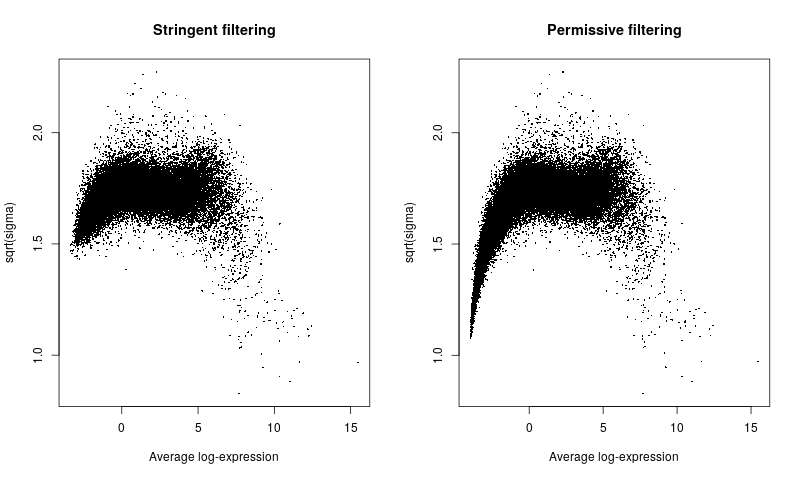

In [78]:
%%R -w 800
par(mfrow=c(1,2))

logCPM <- edgeR::cpm(c_dge_tb_subsets_filtered, log=TRUE, prior.count=0.25)
raw_fit = limma_fit(data=logCPM, conditions_vector=full_by_condition_and_tb_subset, a='Definite tuberculosis', b='Cryptococcal')
limma::plotSA(raw_fit)
title('Stringent filtering')


logCPM <- edgeR::cpm(c_dge_tb_subsets_permissively_filtered, log=TRUE, prior.count=0.25)
raw_fit = limma_fit(data=logCPM, conditions_vector=full_by_condition_and_tb_subset, a='Definite tuberculosis', b='Cryptococcal')
limma::plotSA(raw_fit)
title('Permissive filtering')

The "niceness" is defined by the lack of the initial turn of the relation to the left-down corner (i.e. the genes with little reads which are less variable due to numerical properties (negative binomial) do not misguide the relation). See [this comment](https://support.bioconductor.org/p/85511/#85639) for intuition.

Note: the approach mentioned [here](https://support.bioconductor.org/p/85511/#85514) has been recently (well, two years ago - 2017) automated in edgeR and roughly corresponds to `edgeR::filterByExpr`.

There were below 6000 raw counts:

In [79]:
len(raw_counts_matrix)

58233

The dataset provided to DESeq2 was filtered to:

In [80]:
len(raw_deseq2_matrix)

38664

And our strict filtering gives comparable results (with slightly fewer genes remaining):

In [81]:
%R nrow(c_dge_tb_subsets_filtered$counts)

array([32098], dtype=int32)

In [82]:
%R nrow(c_dge_tb_together_filtered$counts)

array([29411], dtype=int32)

### The outlier to the right

We still have an outlier here (at 15) as we only filtered out the lowly expressed genes. Now, can we remove it? Is it of any benefit?
- Rather not, as I use "robust" version and the limma's author agues it is robust enough [link]
- Maybe, because this outlier may affect the trend estimate

TODO: I lost the link!

So what do we see exactly?

In [83]:
%%R
l = rowMeans(logCPM)
head(l[l > 15])

ENSG00000251562 
       15.48669 


In [84]:
from helpers.ensembl import Ensembl

ensembl = Ensembl(95)
get_gene = ensembl.get_gene

In [85]:
ensembl.gene_by_id('ENSG00000251562')

Gene(gene_id='ENSG00000251562', gene_name='MALAT1', biotype='lincRNA', contig='11', start=65497688, end=65506516, strand='+', genome='GRCh38')

I've got no idea why.. Is this condition-dependent anyhow?

In [86]:
%%R
malat1 = data.frame(
    condition=full_by_condition_and_tb_subset,
    malat1=logCPM['ENSG00000251562',]
)

In [87]:
%R head(malat1)

,condition,malat1
001.TMD,Definite tuberculosis,15.945300
006.CM,Cryptococcal,14.883386
012.BM,Bacterial,15.734177
016.CM,Cryptococcal,15.659558
017.TMD,Definite tuberculosis,16.132236
018.CM,Cryptococcal,15.930723


notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.


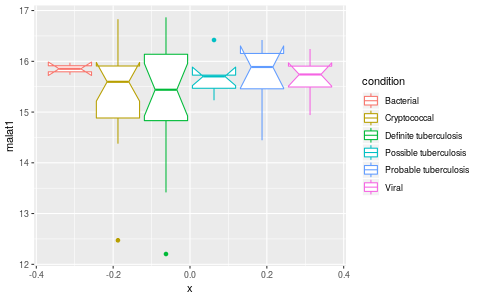

In [88]:
%%R -h 300
ggplot(malat1, aes(y=malat1, color=condition, x=0)) + geom_boxplot(notch=T)

(looking at notches) we cannot confidently say that this is differential.

Was it included in DESeq2 processed dataset?

In [89]:
'ENSG00000251562' in set(raw_deseq2_matrix.reset_index().ensembl_id)

True

Will this **really** improve the trend if we remove it?

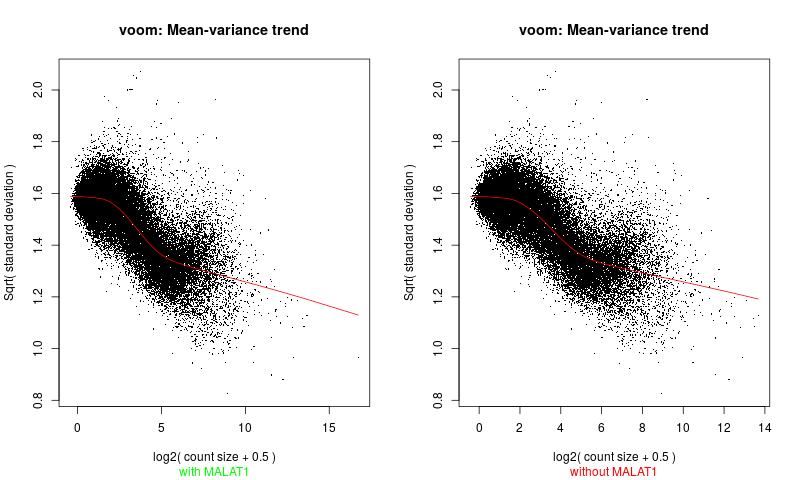

In [90]:
%%R -w 800
c_dge_ts_f <- c_dge_tb_subsets_filtered

dge_without_outlier = c_dge_ts_f[rownames(c_dge_ts_f) != 'ENSG00000251562',]
design = design_from_conditions(full_by_condition_and_tb_subset)
par(mfrow=c(1,2))
v = limma::voom(c_dge_ts_f, design, plot=TRUE); title(sub='with MALAT1', col.sub='green')
v = limma::voom(dge_without_outlier, design, plot=TRUE); title(sub='without MALAT1', col.sub='red')

No, not really - just a little bit.

### Normalization

Adding TMM normalization/scaling factors:

In [91]:
%%R
c_dge_tb_subsets_filtered_norm <- edgeR::calcNormFactors(c_dge_tb_subsets_filtered)
c_dge_tb_together_filtered_norm <- edgeR::calcNormFactors(c_dge_tb_together_filtered) 

### Transformation

Note: if we were to lowering the `prior.count`, the "stripy" pattern will emerge (I suspect that it highlights individual counts - uncovering discretization):

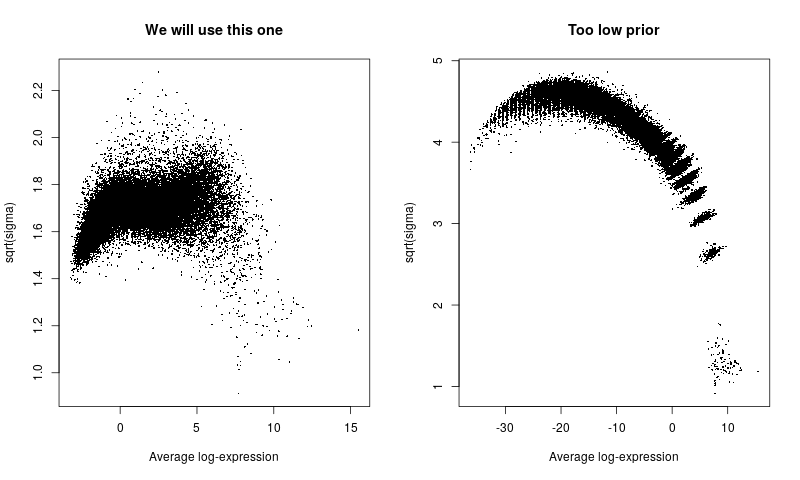

In [92]:
%%R -w 800
par(mfrow=c(1,2))

c_dge_ts_f_n <- c_dge_tb_subsets_filtered_norm

logCPM <- edgeR::cpm(c_dge_ts_f_n, log=TRUE, prior.count=0.25)
raw_fit = limma_fit(data=logCPM, conditions_vector=full_by_condition_and_tb_subset, a='Definite tuberculosis', b='Cryptococcal')
limma::plotSA(raw_fit); title('We will use this one')
        
low_logCPM <- edgeR::cpm(c_dge_ts_f_n, log=TRUE, prior.count=0.000000000001)
low_raw_fit = limma_fit(data=low_logCPM, conditions_vector=full_by_condition_and_tb_subset, a='Definite tuberculosis', b='Cryptococcal')
limma::plotSA(low_raw_fit); title('Too low prior')

### Outlier detection continued

TODO: due to lack of clinical annotations for three samples I am using trimmed data here - this will be updated on Wednesday

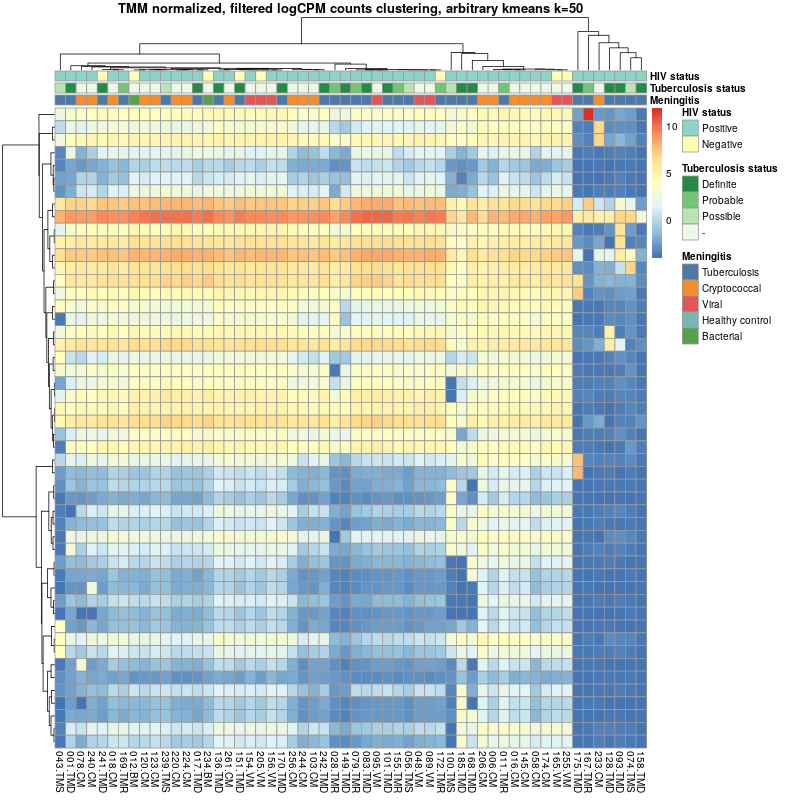

In [93]:
%%R -w 800 -h 800
set.seed(0)

full_counts_clusters = pheatmap(
    logCPM,
    show_colnames=T,
    show_rownames=F,
    annotation_col=counts_patient_annotations,
    annotation_colors=patient_colors,
    clustering_method='ward.D2',
    clustering_distance_cols='correlation',
    clustering_distance_rows='correlation',
    kmeans_k=50,
    main='TMM normalized, filtered logCPM counts clustering, arbitrary kmeans k=50'
)

The divergence of the samples: 175, 074, 093, 128, 158, 233 supports the case for their removal.

In [94]:
%R library(factoextra);

Welcome! Related Books: `Practical Guide To Cluster Analysis in R` at https://goo.gl/13EFCZ


In [95]:
%%R
pca = prcomp(t(logCPM), scale=F)

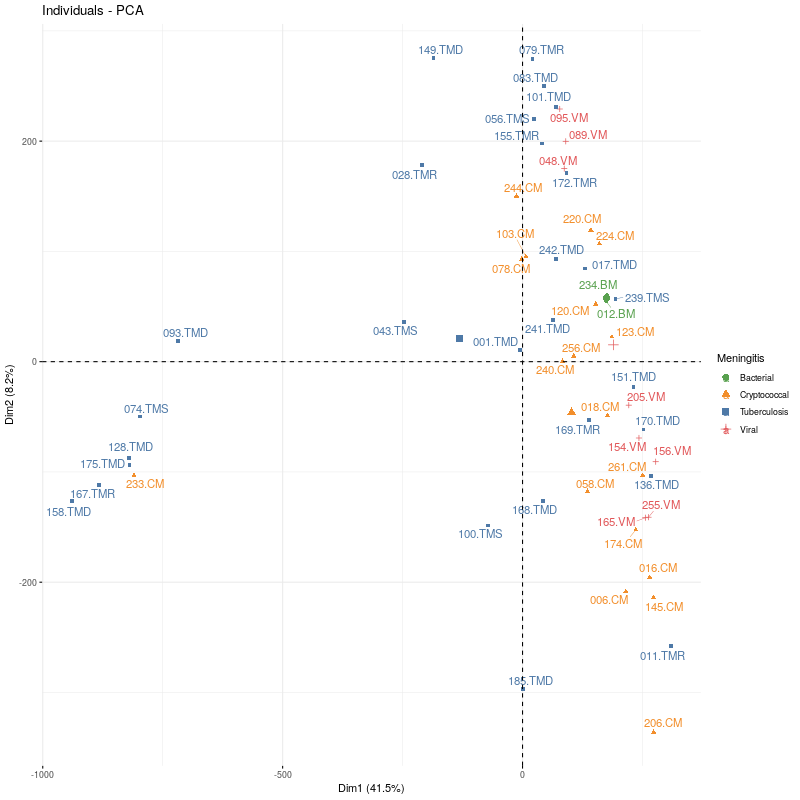

In [96]:
%%R -w 800 -h 800 -u px
fviz_pca_ind(
    pca,
    repel=T,
    col.ind=counts_patient_annotations[colnames(logCPM),]$Meningitis,
    palette=patient_colors$Meningitis
) +  guides(shape=guide_legend(title='Meningitis'), color=guide_legend(title='Meningitis'))

And PCA agrees.

[Some](https://www.biostars.org/p/281767/#281827) recommend |z-score| > 3 for outlier detection. The proposed outliers do not meet this threshold - though they are clearly above two standard deviations away:

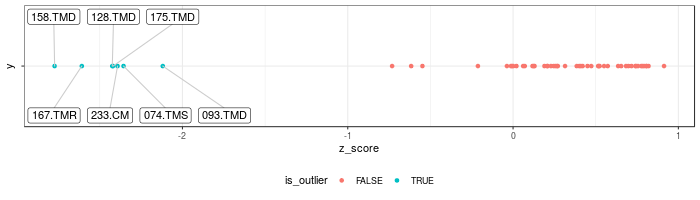

In [97]:
%%R -h 200 -w 700
df = data.frame(z_score=scale(pca$x)[,'PC1'], sample=rownames(pca$x))
df$is_outlier = abs(df$z_score) > 2
(
    ggplot(df, aes(x=z_score, label=sample, y='', color=is_outlier))
    + geom_point()
    + ggrepel::geom_label_repel(data=df[df$is_outlier,], nudge_y=c(-1,1), segment.color='grey80', color='black')
    + nice_theme
)

#### What if we change the normalization method?

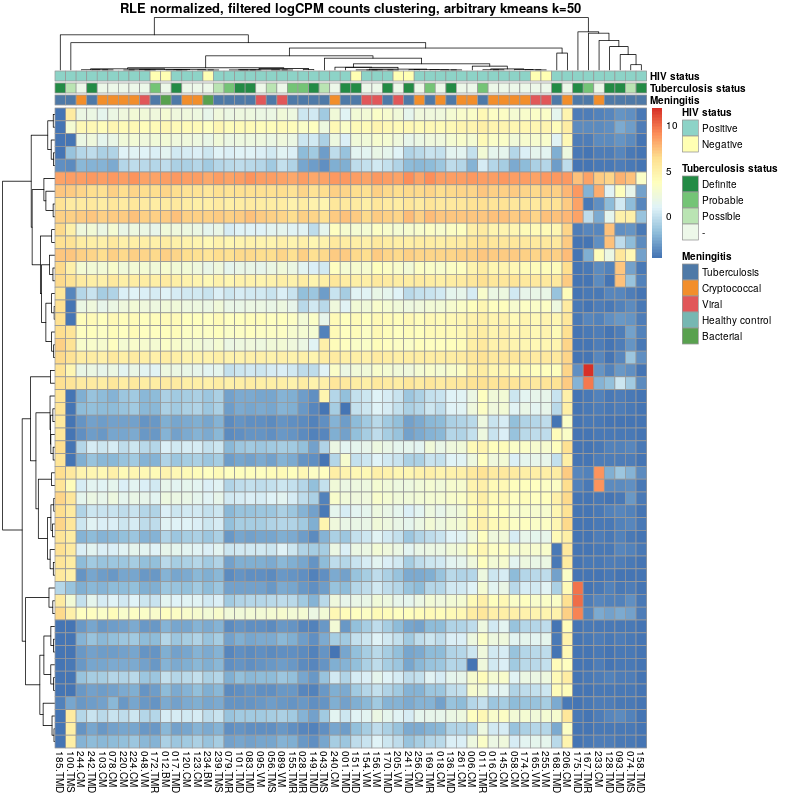

In [98]:
%%R -w 800 -h 800

dge_norm_as_if_dseq2 <- edgeR::calcNormFactors(c_dge_tb_subsets_filtered, method='RLE')
cpm_norm_as_if_dseq2 <- edgeR::cpm(dge_norm_as_if_dseq2, log=TRUE, prior.count=0.25)
        
set.seed(0)

full_counts_clusters = pheatmap(
    cpm_norm_as_if_dseq2,
    show_colnames=T,
    show_rownames=F,
    annotation_col=counts_patient_annotations,
    annotation_colors=patient_colors,
    clustering_method='ward.D2',
    clustering_distance_cols='correlation',
    clustering_distance_rows='correlation',
    kmeans_k=50,
    main='RLE normalized, filtered logCPM counts clustering, arbitrary kmeans k=50'
)

TODO: Treatment status!

The outliers are still visible.

### Removing 175.TMD, 074.TMS, 093.TMD, 128.TMD, 158.TMD, 167.TMR and 233.CM

In [99]:
%%R -o outliers
outliers = c('175.TMD', '074.TMS', '093.TMD', '128.TMD', '158.TMD', '167.TMR', '233.CM')
is_outlier = colnames(c_dge_subset) %in% outliers

raw_counts_matrix_no_outliers = raw_counts_matrix[,!is_outlier]

c_dge_tb_subsets_filtered_norm_no_outliers = c_dge_tb_subsets_filtered_norm[,!is_outlier]
c_dge_tb_together_filtered_norm_no_outliers = c_dge_tb_together_filtered_norm[,!is_outlier]

by_condition_no_outliers = full_by_condition[!is_outlier]
by_condition_and_tb_subset_no_outliers = full_by_condition_and_tb_subset[!is_outlier]

print(paste0('Removed ', mean(is_outlier) * 100, '% samples as outliers'))

[1] "Removed 12.5% samples as outliers"


In [100]:
clinical_counts['is_rna_outlier'] = clinical_counts.index.isin(outliers)

In [101]:
data = clinical_counts[['censored_survival', 'Sex', 'CSFGlucose', 'Protein', 'is_rna_outlier', 'AntiTB', 'SteroidsStarted', 'Death', 'Meningitis', 'RCC', 'WCC', '%Neutro', '%Lympho', 'TBMGrade']]

In [102]:
%%R -i data
library("survminer")
library("survival")
source('helpers/survival.R')

Loading required package: ggpubr
Loading required package: magrittr


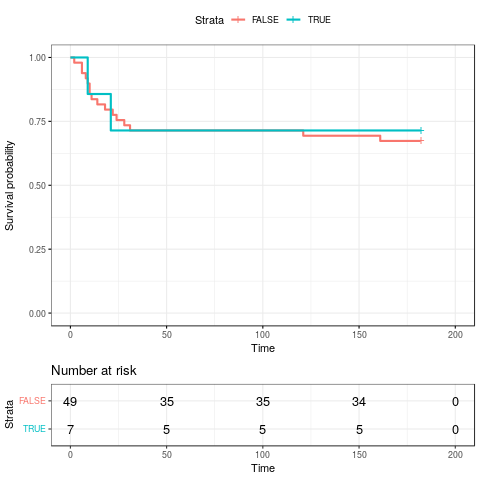

In [103]:
%%R -o fit
fit <- survfit(Surv(data$censored_survival, data$Death) ~ is_rna_outlier, data=data)
strata = strip_strata_prefix(fit)

ggsurvplot(
    fit, data=data,
    legend.labs=strata,
    risk.table=T, ggtheme=theme_bw()
)

In [104]:
%%R
x = data[data$Meningitis == 'Tuberculosis',]
x = x[, complete.cases(t(x))]
x = Filter(var, x)
x = type.convert(x, as.is=T)

corrplot 0.84 loaded


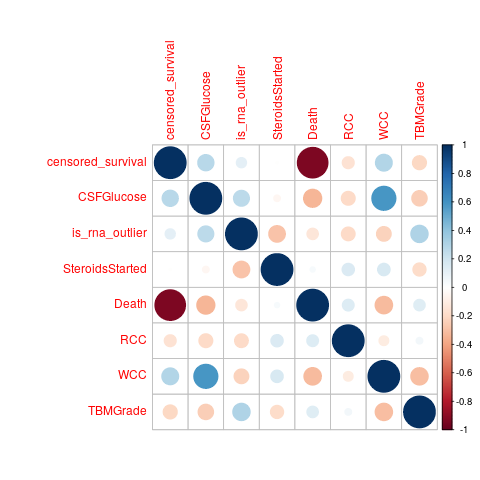

In [105]:
%%R
library(corrplot)
correlations <- cor(x)
corrplot(correlations, method="circle")

In [106]:
%%R
# death and survival obviously too corelated; WCC/CSFGlucose - close!
selection = subset(x, select=-c(Death))
summary(lm(is_rna_outlier ~ ., data=selection))


Call:
lm(formula = is_rna_outlier ~ ., data = selection)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.61740 -0.23003 -0.01822  0.10483  0.75196 

Coefficients:
                      Estimate Std. Error t value Pr(>|t|)  
(Intercept)         -0.3681857  0.3749918  -0.982   0.3374  
censored_survival    0.0008521  0.0010295   0.828   0.4172  
CSFGlucose           0.1820418  0.0700032   2.600   0.0167 *
SteroidsStartedTRUE -0.1206518  0.2067015  -0.584   0.5656  
RCC                 -0.0014824  0.0023108  -0.642   0.5281  
WCC                 -0.0009280  0.0004126  -2.249   0.0353 *
TBMGrade             0.2232207  0.1299867   1.717   0.1006  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3621 on 21 degrees of freedom
Multiple R-squared:  0.4158,	Adjusted R-squared:  0.2489 
F-statistic: 2.491 on 6 and 21 DF,  p-value: 0.05595



For a plot, see below logistic regression.

In [107]:
%%R
summary(glm(is_rna_outlier ~., family=binomial(link='logit'), data=selection))


Call:
glm(formula = is_rna_outlier ~ ., family = binomial(link = "logit"), 
    data = selection)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-1.85691  -0.36555  -0.06684   0.00000   1.93056  

Coefficients:
                     Estimate Std. Error z value Pr(>|z|)  
(Intercept)         -9.219768   5.306774  -1.737   0.0823 .
censored_survival    0.002562   0.011193   0.229   0.8189  
CSFGlucose           2.076905   1.223718   1.697   0.0897 .
SteroidsStartedTRUE -1.373669   1.731629  -0.793   0.4276  
RCC                 -0.387524   0.475437  -0.815   0.4150  
WCC                 -0.003655   0.005353  -0.683   0.4948  
TBMGrade             2.861555   1.863328   1.536   0.1246  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 29.096  on 27  degrees of freedom
Residual deviance: 14.538  on 21  degrees of freedom
AIC: 28.538

Number of Fisher Scoring iterations: 

In [108]:
# sometimes fighting with the rpy2 conversions is not worth it: 
tmp_clinical_path = '/tmp/clinical_counts_with_rna_outliers.csv'
clinical_counts.to_csv(tmp_clinical_path)

In [109]:
%%R -i tmp_clinical_path
df = read.csv(tmp_clinical_path, row.names=1, check.names=FALSE)
names(df) = sub('%', 'Percent_', names(df))
df = df[df$Meningitis=='Tuberculosis',]
df$observation_type = ifelse(as.logical(df$is_rna_outlier), 'RNA outlier TB', 'Non-outlier TB')

notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went o

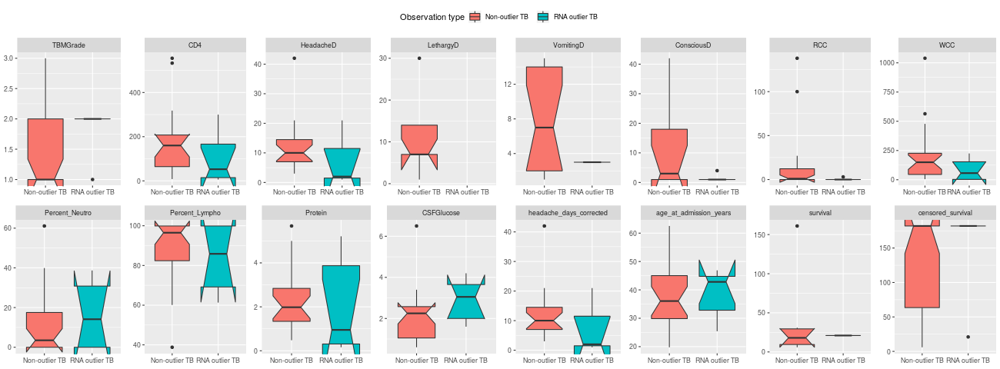

In [110]:
%%R -w 1300
import::here(ggplot_columns_grid, .from='plots/grids.R')

ggplot_columns_grid(
    df,
    ggplot=function(data, column) { (
        ggplot(data, aes_string(x='observation_type', y=column, fill='observation_type', group='observation_type'))
        + geom_boxplot(notch=T)
    )},
    prepare_legend=function(legend) {
        legend + guides(fill=guide_legend(title='Observation type'))
    }
)

### Wrapping up

Repeat preprocessing, this time without outliers:

In [111]:
%%R
import::here(calc_normalization_factors, .from='helpers/preprocessing.R')

preprocess_limma = function(counts, conditions, strict_filter_join_bacterial_to=F, method='TMM', ...) {
    dge = edgeR::DGEList(counts=counts, group=conditions)
    
    if(strict_filter_join_bacterial_to != F)
        conditions[conditions=='Bacterial'] = strict_filter_join_bacterial_to

    dge_filtered = filter_out_low_expression(dge, conditions)
    calc_normalization_factors(dge_filtered, method=method, ...)
}

In [112]:
%%R
clean_dge_tb_together = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis')
clean_dge_tb_subset = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis')

[1] "Retaining: 49.79%"
[1] "Retaining: 59.29%"


### Helper functions

In [113]:
from helpers.venn import venn2, venn3, venn4, venn_n

In [114]:
with_gene_data = partial(ensembl.merge_gene_data, sort='adj.P.Val')

### Enabling Gene Set Enrichment Analysis

In [115]:
ensembl_to_entrez = read_csv(ensembl_to_entrez_path, index_col=0)
ensembl_to_entrez.head(2)

,NCBI Gene ID
Ensembl gene ID,
ENSG00000121410,1
ENSG00000268895,503538


In [116]:
from helpers.gse import collection_to_R, nice_kegg, formatter_to_fix_letter_case
from gsea_api.molecular_signatures_db import MolecularSignaturesDatabase, GeneMatrixTransposed

db = MolecularSignaturesDatabase('data/msigdb', version='6.2')

In [117]:
reactome_new_symbol = GeneMatrixTransposed.from_gmt('ReactomePathways.gmt', name='reactome_new_symbol')
kegg_pathways_entrez = db.load(gene_sets='c2.cp.kegg', id_type='entrez').format_names(nice_kegg)
reactome_pathways_entrez = db.load(gene_sets='c2.cp.reactome', id_type='entrez').format_names(
    formatter_to_fix_letter_case(reactome_new_symbol)
)

In [118]:
ensembl_to_gene_name = ensembl.merge_gene_data(raw_counts_matrix)[['gene_name']]

In [119]:
i = set(ensembl_to_entrez.index)

entrez_ids = {
    str(int(ensembl_to_entrez.loc[g])) for g in raw_counts_matrix_subset.index
    if g in i
}
symbols = set(ensembl_to_gene_name.loc[raw_counts_matrix.index]['gene_name'])

for collection, genes in [
    (kegg_pathways_entrez, entrez_ids),
    (reactome_pathways_entrez, entrez_ids),
    (reactome_new_symbol, symbols)
]:
    after_trimming = collection_to_R(collection, trim_to=genes)
    print(collection.name, len(after_trimming))

c2.cp.kegg 186
c2.cp.reactome 671
reactome_new_symbol 1641


### The differential expression analysis and GSEA procedures

In [120]:
%%R
import::here(calc_camera, calc_de, camera_with_statistic, .from='helpers/differential_expression.R')

#### Sanity check: are the Camera/CameraPR results comparable?

In [121]:
%%R -o cam -o cam_pr
cam = calc_camera('Tuberculosis', 'Cryptococcal', c_dge_tb_together_filtered_norm_no_outliers, by_condition_no_outliers, voom=T)
cam_pr = calc_camera('Tuberculosis', 'Cryptococcal', c_dge_tb_together_filtered_norm_no_outliers, by_condition_no_outliers, voom=T, statistic='t')

In [122]:
cam.head(n=10)

,NGenes,Direction,PValue,FDR
FCERI mediated NF-kB activation,133.0,Up,1.544709e-14,2.534867e-11
Signaling by the B Cell Receptor (BCR),160.0,Up,9.765169e-14,8.012321e-11
Fc epsilon receptor (FCERI) signaling,185.0,Up,1.963220e-13,1.073881e-10
FCERI mediated Ca+2 mobilization,84.0,Up,4.126192e-13,1.692770e-10
Role of LAT2/NTAL/LAB on calcium mobilization,69.0,Up,6.777535e-13,1.883935e-10
FCGR activation,71.0,Up,6.888243e-13,1.883935e-10
Antigen activates B Cell Receptor (BCR) leading to generation of second messengers,81.0,Up,3.199626e-12,7.500837e-10
FCERI mediated MAPK activation,85.0,Up,4.900921e-12,1.005302e-09
Interferon alpha/beta signaling,67.0,Up,6.119763e-12,1.115837e-09
CD22 mediated BCR regulation,56.0,Up,7.412169e-12,1.216337e-09


In [123]:
cam_pr.head(n=10)

,NGenes,Direction,PValue,FDR
FCERI mediated NF-kB activation,133.0,Up,5.576130e-13,9.150430e-10
Signaling by the B Cell Receptor (BCR),160.0,Up,2.025443e-12,1.661876e-09
Fc epsilon receptor (FCERI) signaling,185.0,Up,3.322449e-12,1.817379e-09
Interferon alpha/beta signaling,67.0,Up,5.488534e-12,2.251671e-09
Ub-specific processing proteases,184.0,Up,4.143655e-11,1.359948e-08
FCERI mediated Ca+2 mobilization,84.0,Up,8.350073e-11,2.283745e-08
Role of LAT2/NTAL/LAB on calcium mobilization,69.0,Up,2.322169e-10,5.342562e-08
FCGR activation,71.0,Up,2.604540e-10,5.342562e-08
Antigen activates B Cell Receptor (BCR) leading to generation of second messengers,81.0,Up,4.949510e-10,9.024606e-08
FCERI mediated MAPK activation,85.0,Up,5.825666e-10,9.559918e-08


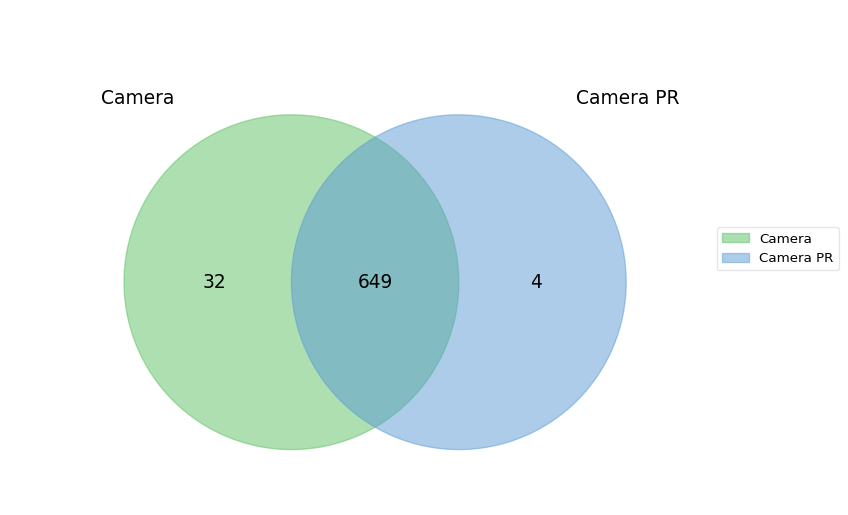

In [124]:
venn2({
    'Camera': cam.query('FDR < 0.05').index,
    'Camera PR': cam_pr.query('FDR < 0.05').index
});

Yes!

#### How much does pre-processing without outliers change?

In [125]:
%R head(calc_de('Tuberculosis', 'Cryptococcal', c_dge_tb_together_filtered_norm_no_outliers, by_condition_no_outliers))

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000241313,-3.827504,0.103471,-4.957357,0.000006,0.082776,3.424716
ENSG00000280809,-3.687482,-0.392448,-4.932004,0.000007,0.082776,3.347667
ENSG00000179412,-4.027153,-1.742398,-4.882371,0.000008,0.082776,3.197210
ENSG00000272975,-3.837146,-0.400797,-4.617754,0.000022,0.128365,2.404251
ENSG00000264714,-3.895521,0.800231,-4.506954,0.000032,0.128365,2.077294
ENSG00000266486,-3.579099,-1.294764,-4.479094,0.000035,0.128365,1.995594


In [126]:
%R head(calc_de('Tuberculosis', 'Cryptococcal', clean_dge_tb_together, by_condition_no_outliers))

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000241313,-3.754627,0.053107,-4.891953,0.000008,0.086834,3.193391
ENSG00000280809,-3.622892,-0.450922,-4.864057,0.000009,0.086834,3.109575
ENSG00000179412,-3.995456,-1.786214,-4.861691,0.000009,0.086834,3.102473
ENSG00000272975,-3.774459,-0.453120,-4.588835,0.000024,0.149866,2.291996
ENSG00000264714,-3.837496,0.743798,-4.479999,0.000035,0.149866,1.973816
ENSG00000266486,-3.538271,-1.350025,-4.465489,0.000037,0.149866,1.931635


Not much. But this may be more statistically sound (e.g. when assuming that the rejected samples carry technical error burden).

In [127]:
def limma_venn(limma_gene_sets):
    return venn_n(limma_gene_sets, names=['limma-' + name.replace('_', ' ') for name in limma_gene_sets], n=len(limma_gene_sets))

In [128]:
%R import::here(volcano_plot, .from='plots/volcano.R')

## Comparison of limma-trend, limma-voom and DESeq2

I will be using robust voom with sample quality weights. I will also demonstrate effects of different normalization methods (RLE and TMM) but I will continue using TMM which is standard for limma toolkit.

I will also use independent filtering to limit the effect of lowly expressed genes; for the comparison purposes I will start with the same method as used in DESeq2; but for the final analysis I will use a more advanced technique (Independent hypothesis weighting) which does not blatantly reject all lowly expressed genes.

In [129]:
%%R
import::here(
    filter_by_mean_expression, add_p_value_for_filtered_subset,
    weight_by_mean_expression, add_p_value_for_weighted_hypothesis,
    .from='helpers/independent_hypothesis.R'
)

The independent filtering is an interesting way (or trick) of decreasing the FDR/adjusted p-value by disregarding some hypotheses upfront. The criterion used by DESeq2 is having a small number of normalized counts (regardless of the condition). For more details see the plot and explanation in the [DESeq2 vignette](https://bioconductor.org/packages/release/bioc/vignettes/DESeq2/inst/doc/DESeq2.html#indfilttheory).

Thus at the cost of getting a few false negatives, DESeq increases the number of true positives.

The independent filtering can be applied to edgeR's statistical piepline as well ([statquests](https://statquest.org/2017/05/16/statquest-filtering-genes-with-low-read-counts/) by prof Joshua Starmer)

### Tuberculosis (regardless of certainty) vs Cryptococcal

In [130]:
%%R
tmm_normalized = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis', method='TMM')
rle_normalized = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis', method='RLE')
tcc_normalized = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis', method='TMM', test_method='voom', iterations=3)
qtotal_normalized = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis', method='qtotal')

[1] "Retaining: 49.79%"
[1] "Retaining: 49.79%"
[1] "Retaining: 49.79%"
Loading required package: DESeq
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colMeans,
    colnames, colSums, dirname, do.call, duplicated, eval, evalq,
    Filter, Find, get, grep, grepl, intersect, is.unsorted, lapply,
    lengths, Map, mapply, match, mget, order, paste, pmax, pmax.int,
    pmin, pmin.int, Position, rank, rbind, Reduce, rowMeans, rownames,
    rowSums, sapply, setdiff, sort, table, tapply, union, unique,
 

In [131]:
%%R
import::here(calc_normalization_factors, .from='helpers/preprocessing.R')

preprocess_limma = function(counts, conditions, strict_filter_join_bacterial_to=F, method='TMM', ...) {
    dge = edgeR::DGEList(counts=counts, group=conditions)
    
    if(strict_filter_join_bacterial_to != F)
        conditions[conditions=='Bacterial'] = strict_filter_join_bacterial_to

    dge_filtered = filter_out_low_expression(dge, conditions)
    calc_normalization_factors(dge_filtered, method=method, ...)
}

In [132]:
%%R
qtotal_normalized = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis', method='qtotal')
qtotal_normalized_no_scale = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_no_outliers, 'Tuberculosis', method='qtotal', rescale_lib=F)

[1] "Retaining: 49.79%"
[1] "Retaining: 49.79%"


notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.


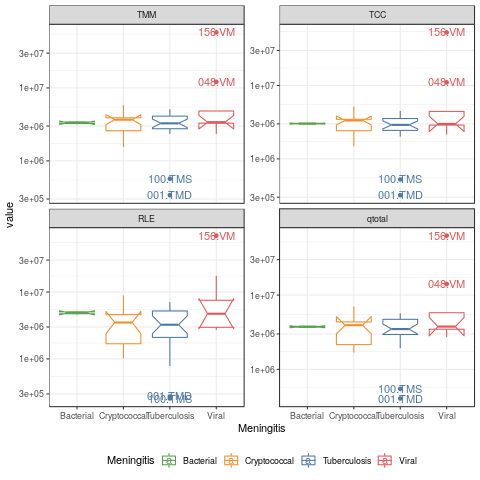

In [133]:
%%R
import::here(label_outliers, .from='plots/utils.R')

size_factors = function(dge) {
    dge$samples$norm.factors * dge$samples$lib.size
}

df = reshape::melt(data.frame(
    TMM=size_factors(tmm_normalized),
    TCC=size_factors(tcc_normalized),
    RLE=size_factors(rle_normalized),
    qtotal=size_factors(qtotal_normalized),
    Meningitis=by_condition_no_outliers,
    patient=as.character(names(by_condition_no_outliers))
), id=c('Meningitis', 'patient'))

(
    ggplot(df, aes(y=value, x=Meningitis, color=Meningitis))
    + facet_wrap('variable', scales='free_y')
    + geom_boxplot(notch=T)
    + nice_theme
    + geom_text(aes(
        label=label_outliers(
            label=patient,
            value=log10(value),
            group=interaction(variable, Meningitis)
        )
    ))
    + color_meningitis
    + scale_y_log10()
)

In [299]:
%%R
import::here(ensembl_to_gene_name, .from='helpers/identifiers_mapping.R')

import::here(
    advanced_differential_expression_heatmap, differential_expression_heatmap,
    significant.limma, significant.deseq,
    .from='plots/differential_expression.R'
)
import::here(compose_title, .from='plots/complex_heatmap.R')


de_heatmap = function(counts, dds, main=NULL, major=NULL, minor=NULL, ...) {
    main = compose_title(main, major, minor)
    advanced_differential_expression_heatmap(counts, dds, ..., main=main, id_to_gene_name=ensembl_to_gene_name)
}

simple_de_heatmap = function(...) {
    differential_expression_heatmap(..., id_to_gene_name=ensembl_to_gene_name)
}

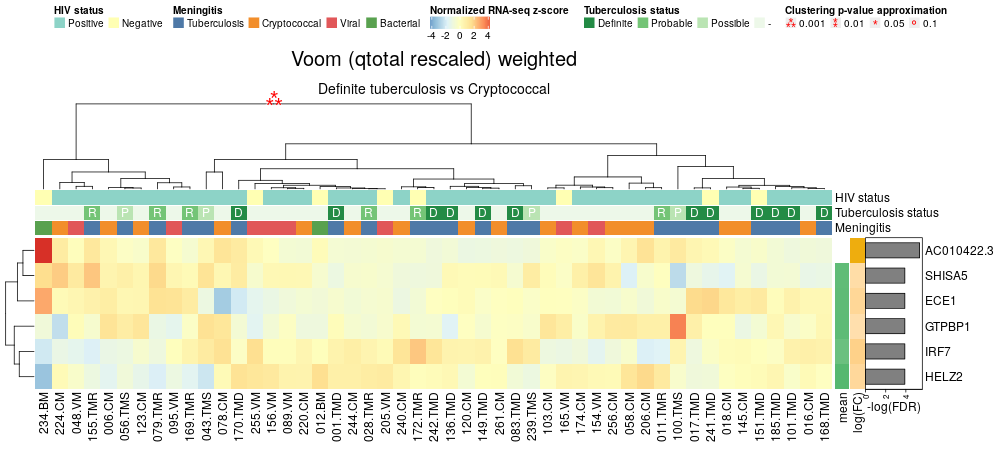

In [303]:
%%R -w 1000 -h 450
qtotal_normalized_tb_subsets = preprocess_limma(
    raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis',
    method='qtotal', rescale_lib=T
)

voom_qtotal = add_p_value_for_weighted_hypothesis(
    calc_de(
        'Definite tuberculosis', 'Cryptococcal', qtotal_normalized_tb_subsets,
        by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T
    )
)

de_heatmap(
    significant.limma(voom_qtotal), qtotal_normalized_tb_subsets,
    major='Voom (qtotal rescaled) weighted',
    minor='Definite tuberculosis vs Cryptococcal',
    r=1 # disable multiscale bootstrap 9to few observations)
)

In [327]:
%%R -o qtotal_normalized_tb_subsets_counts
qtotal_normalized_tb_subsets_counts = as.data.frame(qtotal_normalized_tb_subsets$counts)

In [365]:
from scipy.stats import spearmanr

If ECE1 is indeed a proxy of the MTB, we would expect a positive correlation of the value with with the bacterial load, which can be assessed by ordinal relation of the TB subgroups:

In [369]:
tb_ranks = {
    'Definite tuberculosis': 3,
    'Probable tuberculosis': 2,
    'Possible tuberculosis': 1
}

all_ordinal_ranks = {
    **tb_ranks,
    'Bacterial': 0,
    'Cryptococcal': 0,
    'Viral': 0
}

ECE1 = qtotal_normalized_tb_subsets_counts.loc['ENSG00000117298']

spearmanr(
    ECE1.index.map(by_condition_and_tb_subset).map(all_ordinal_ranks),
    ECE1, nan_policy='omit'
)

SpearmanrResult(correlation=0.21638101202647442, pvalue=0.1353532905938852)

In [396]:
%store qtotal_normalized_tb_subsets_counts

Stored 'qtotal_normalized_tb_subsets_counts' (DataFrame)


We can get a bit more statistically sound result if we only look at the TB subgroups - disregarding the Crypto group which was used to nominate this gene in the first place:

In [371]:
spearmanr(
    ECE1.index.map(by_condition_and_tb_subset).map(tb_ranks),
    ECE1, nan_policy='omit'
)

SpearmanrResult(correlation=0.3381452048448578, pvalue=masked_array(data=0.1237528,
             mask=False,
       fill_value=1e+20))

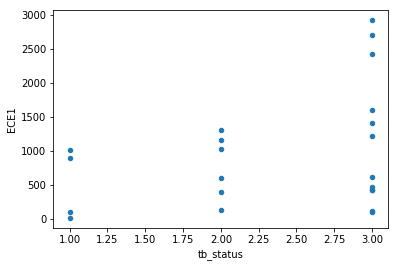

In [392]:
DataFrame(dict(
    tb_status=ECE1.index.map(by_condition_and_tb_subset).map(tb_ranks),
    ECE1=ECE1
)).plot.scatter(x='tb_status', y='ECE1');

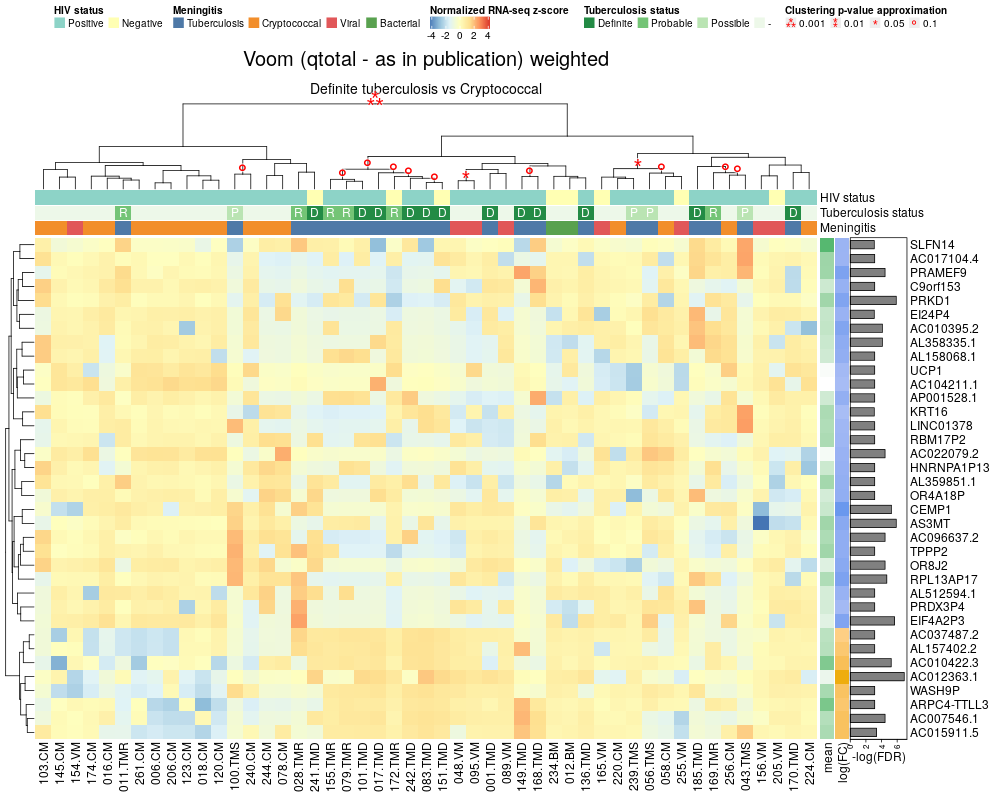

In [273]:
%%R -w 1000 -h 800

qtotal_normalized_tb_subsets = preprocess_limma(
    raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis',
    method='qtotal', rescale_lib=F
)

voom_qtotal = add_p_value_for_weighted_hypothesis(
    calc_de(
        'Definite tuberculosis', 'Cryptococcal', qtotal_normalized_tb_subsets,
        by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T
    )
)

de_heatmap(
    significant.limma(voom_qtotal), qtotal_normalized_tb_subsets,
    major='Voom (qtotal - as in publication) weighted',
    minor='Definite tuberculosis vs Cryptococcal'
)

[1] "Retaining: 59.29%"


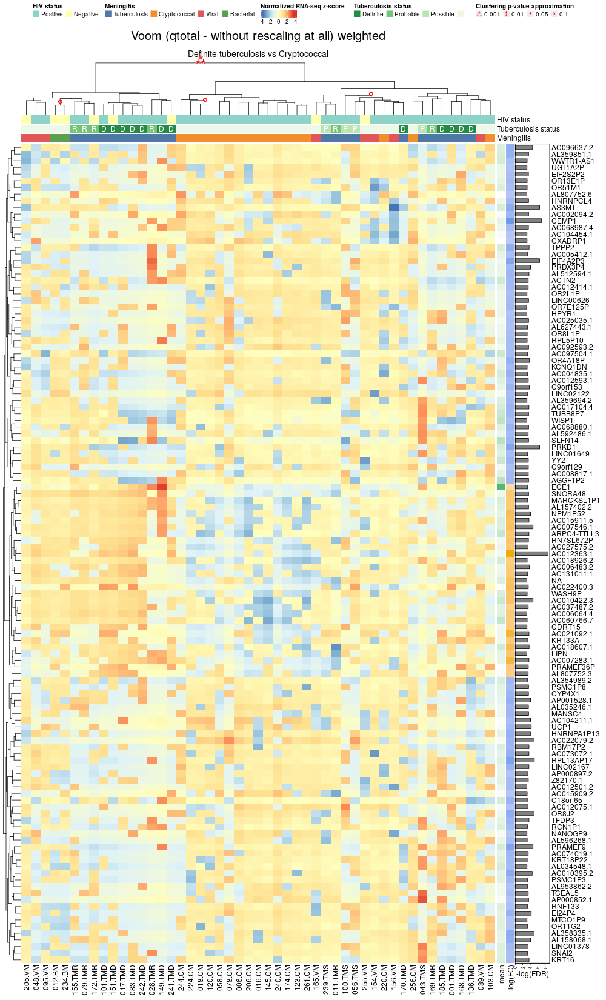

In [373]:
%%R -w 1000 -h 1650
qtotal_normalized_tb_subsets_no_scale_at_all = preprocess_limma(
    raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis',
    method='qtotal', rescale_lib=F, rescale_factor=F
)
voom_qtotal = add_p_value_for_weighted_hypothesis(
    calc_de(
        'Definite tuberculosis', 'Cryptococcal', qtotal_normalized_tb_subsets_no_scale_at_all,
        by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T
    )
)

de_heatmap(
    significant.limma(voom_qtotal), qtotal_normalized_tb_subsets_no_scale_at_all,
    major='Voom (qtotal - without rescaling at all) weighted',
    minor='Definite tuberculosis vs Cryptococcal'
)

In [375]:
%%R -o qtotal_normalized_tb_subsets_no_scale_at_all_counts
qtotal_normalized_tb_subsets_no_scale_at_all_counts = as.data.frame(
    qtotal_normalized_tb_subsets_no_scale_at_all$counts
)

In [376]:
ECE1 = qtotal_normalized_tb_subsets_no_scale_at_all_counts.loc['ENSG00000117298']

spearmanr(
    ECE1.index.map(by_condition_and_tb_subset).map(all_ordinal_ranks),
    ECE1, nan_policy='omit'
)

SpearmanrResult(correlation=0.21638101202647442, pvalue=0.1353532905938852)

I think that there may be a problem with the scaling for heatmap - it may introduce spuriois relations...

But maybe at least some of those are not false postivies - for example ECE1 looks nice:
 - it is related to inflammatory signaling https://www.ncbi.nlm.nih.gov/pubmed/24898255
 - "Mycobacterium tuberculosis Molecular Determinants of Infection, Survival Strategies, and Vulnerable Targets": human ECE-1 shares sequence similarity with MTB Zmp1 which suppresses immune system of the host (caspase-1 activation inhibition).

Why do we so nice pattern? Because this normalization does not use library sizes!
But it is a good normalization otherwise, so I think that it may actually corrected some of the effects... Let's see:

In [282]:
%%R
import::here(calc_normalization_factors, .from='helpers/preprocessing.R')

preprocess_limma = function(counts, conditions, strict_filter_join_bacterial_to=F, method='TMM', ...) {
    dge = edgeR::DGEList(counts=counts, group=conditions)
    
    if(strict_filter_join_bacterial_to != F)
        conditions[conditions=='Bacterial'] = strict_filter_join_bacterial_to

    dge_filtered = filter_out_low_expression(dge, conditions)
    calc_normalization_factors(dge_filtered, method=method, ...)
}

Indeed, some of the effect may be attributed to the lack of library re-scaling, because as similar effect (but weaker) is seen for TMM normalization (normalization factors stay the same, size factors change due to lack of scale preservation in library sizes estimate):

[1] "Retaining: 59.29%"


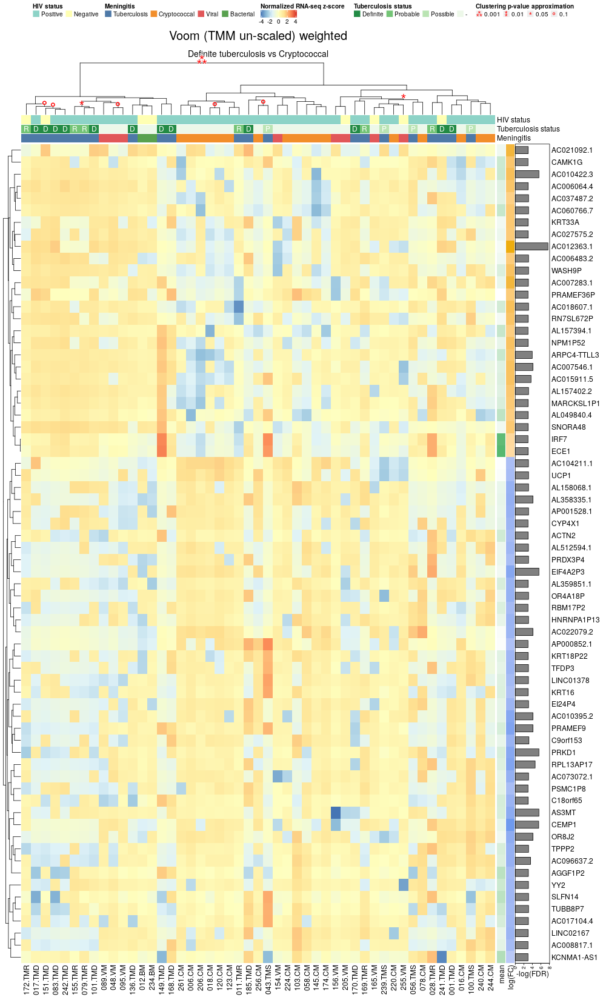

In [285]:
%%R -w 1000 -h 1650
non_normalized_tb_subsets = preprocess_limma(
    raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis',
    method='TMM', rescale_lib=F
)
voom_non_noem = add_p_value_for_weighted_hypothesis(
    calc_de(
        'Definite tuberculosis', 'Cryptococcal', non_normalized_tb_subsets,
        by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T
    )
)

de_heatmap(
    significant.limma(voom_non_noem), non_normalized_tb_subsets,
    major='Voom (TMM un-scaled) weighted',
    minor='Definite tuberculosis vs Cryptococcal'
)

It remains a question whether this scale-dependent effect is only visible in voom (possibly violating some of it's assumptions) or if it also affects other methods.

Some of the picked up genes also show in the anaysis with non-normalization - here the separation is no longer visible:

[1] "Retaining: 59.29%"


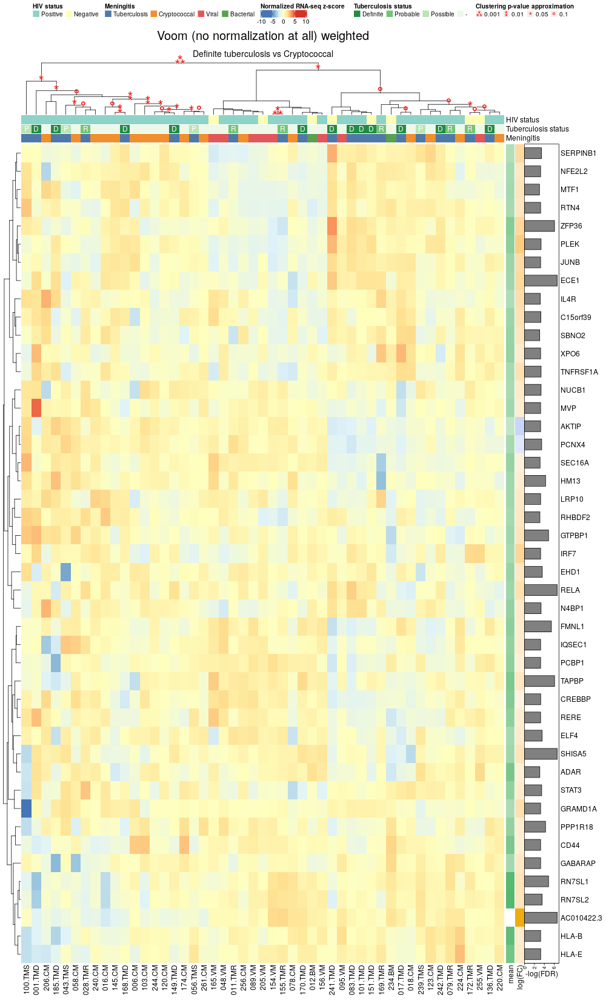

In [1741]:
%%R -w 1000 -h 1650
non_normalized_tb_subsets = preprocess_limma(
    raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis',
    method='none'
)
voom_non_noem = add_p_value_for_weighted_hypothesis(
    calc_de(
        'Definite tuberculosis', 'Cryptococcal', non_normalized_tb_subsets,
        by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T
    )
)

de_heatmap(
    significant.limma(voom_non_noem), non_normalized_tb_subsets,
    major='Voom (no normalization at all) weighted',
    minor='Definite tuberculosis vs Cryptococcal'
)

In [1188]:
%%R -o trend_tmm -o trend_rle -o voom_rle -o voom_tmm -o trend_tcc -o voom_tcc -o voom_qtotal
trend_tmm = calc_de('Tuberculosis', 'Cryptococcal', tmm_normalized, by_condition_no_outliers)
trend_rle = calc_de('Tuberculosis', 'Cryptococcal', rle_normalized, by_condition_no_outliers)
trend_tcc = calc_de('Tuberculosis', 'Cryptococcal', tcc_normalized, by_condition_no_outliers)

voom_rle = calc_de('Tuberculosis', 'Cryptococcal', rle_normalized, by_condition_no_outliers, voom=T, quality_weights=T)
voom_tmm = calc_de('Tuberculosis', 'Cryptococcal', tmm_normalized, by_condition_no_outliers, voom=T, quality_weights=T)
voom_tcc = calc_de('Tuberculosis', 'Cryptococcal', tcc_normalized, by_condition_no_outliers, voom=T, quality_weights=T)
voom_qtotal = calc_de('Tuberculosis', 'Cryptococcal', qtotal_normalized, by_condition_no_outliers, voom=T, quality_weights=T)

In [942]:
%%R -o norm_counts
norm_counts = as.data.frame(tmm_normalized$counts)

In [943]:
%store norm_counts

Stored 'norm_counts' (DataFrame)


In [701]:
%store trend_tmm
%store trend_rle
%store voom_rle
%store voom_tmm
%store reference_definite_tbm_cm_deg

Stored 'trend_tmm' (DataFrame)
Stored 'trend_rle' (DataFrame)
Stored 'voom_rle' (DataFrame)
Stored 'voom_tmm' (DataFrame)
Stored 'reference_definite_tbm_cm_deg' (DataFrame)


In [702]:
%R -o reference_samples -o raw_counts_trimmed

In [703]:
%store by_condition_and_tb_subset
%store reference_samples
%store raw_counts_trimmed

Stored 'by_condition_and_tb_subset' (Series)
Stored 'reference_samples' (ndarray)
Stored 'raw_counts_trimmed' (DataFrame)


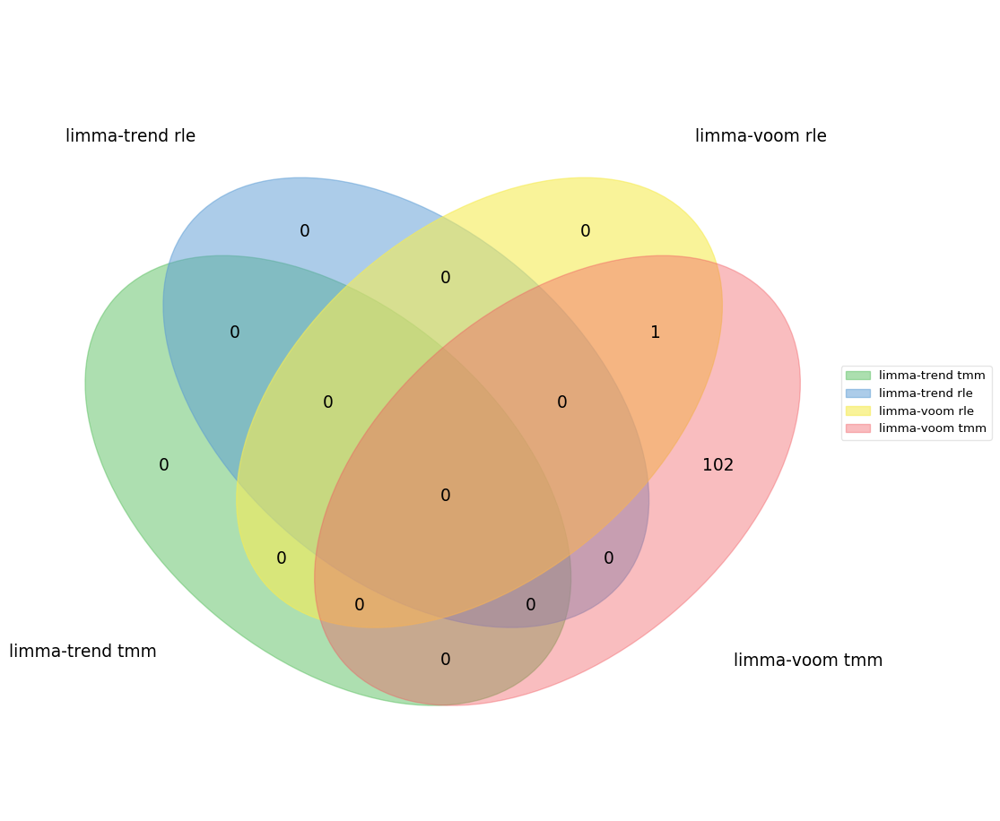

In [1380]:
limma_degs = {'trend_tmm': trend_tmm, 'trend_rle': trend_rle, 'voom_rle': voom_rle, 'voom_tmm': voom_tmm}
limma_venn({k: list(v[v['adj.P.Val'] < 0.05].index) for k, v in limma_degs.items()});

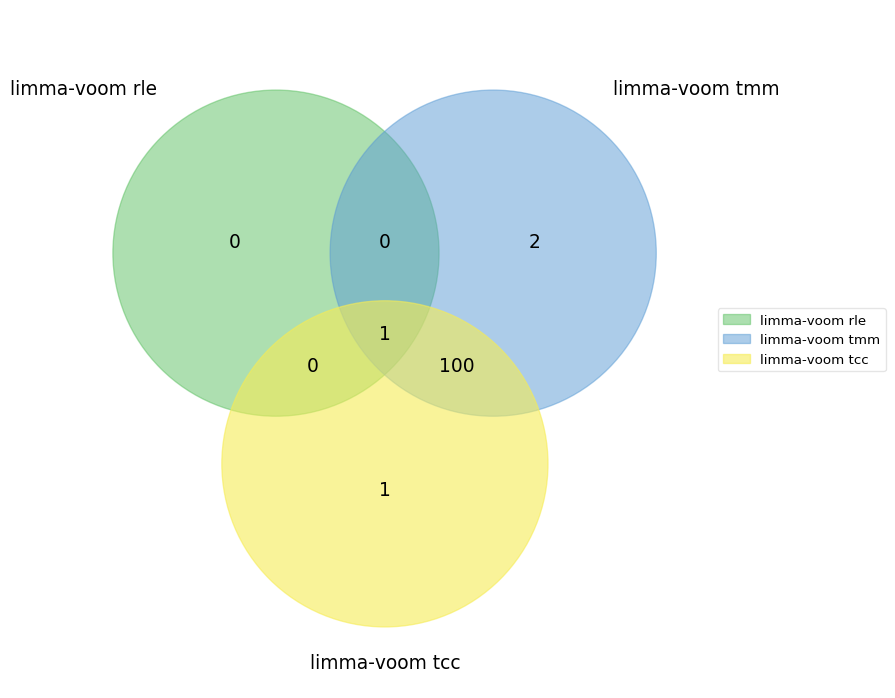

In [1381]:
limma_degs = {'voom_rle': voom_rle, 'voom_tmm': voom_tmm, 'voom_tcc': voom_tcc}
limma_venn({k: list(v[v['adj.P.Val'] < 0.05].index) for k, v in limma_degs.items()});

When using TCC with TMM/voom we got one gene more and two less.

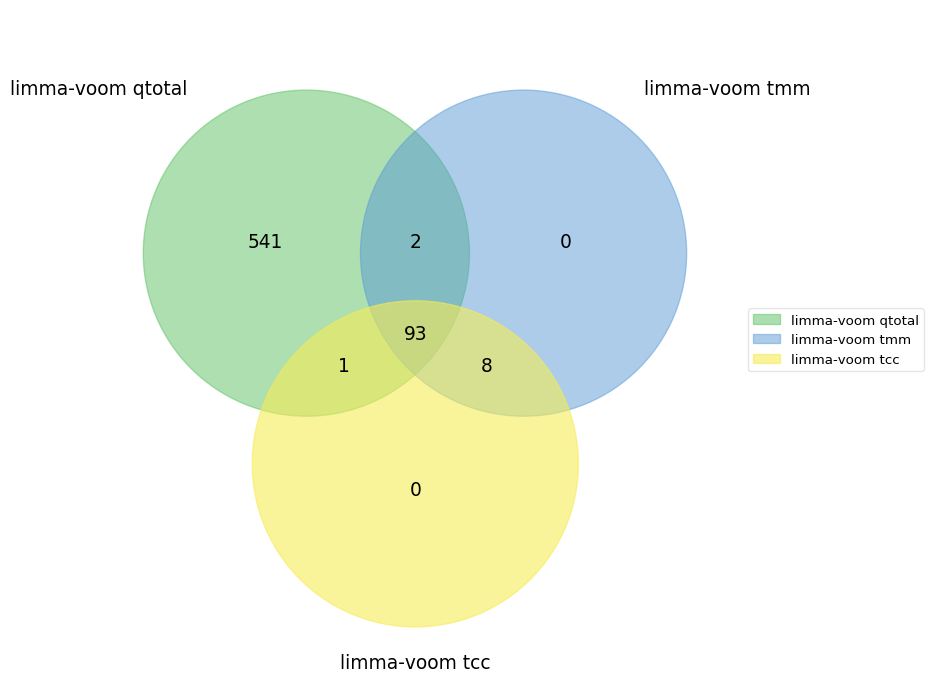

In [1382]:
limma_degs = {'voom_qtotal': voom_qtotal, 'voom_tmm': voom_tmm, 'voom_tcc': voom_tcc}
limma_venn({k: list(v[v['adj.P.Val'] < 0.05].index) for k, v in limma_degs.items()});

In [1383]:
degs_qtotal = with_gene_data(voom_qtotal)
degs_tcc = with_gene_data(voom_tcc)
degs_tmm = with_gene_data(voom_tmm)
degs_rle = with_gene_data(voom_rle)

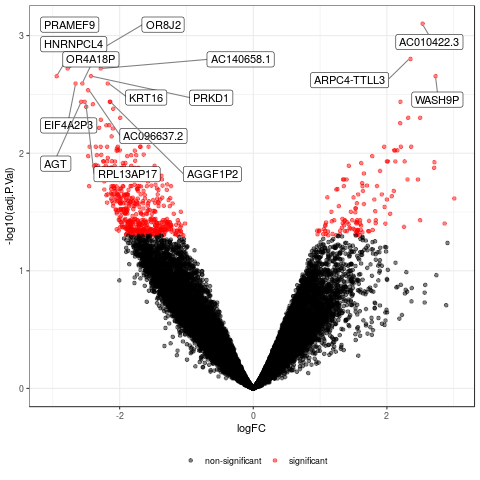

In [1197]:
%%R -i degs_qtotal
volcano_plot(degs_qtotal, significant_only=F, transparency=0.5)

Finally something different... But does it make sense? (according to their simulations it's much better normalization method..)

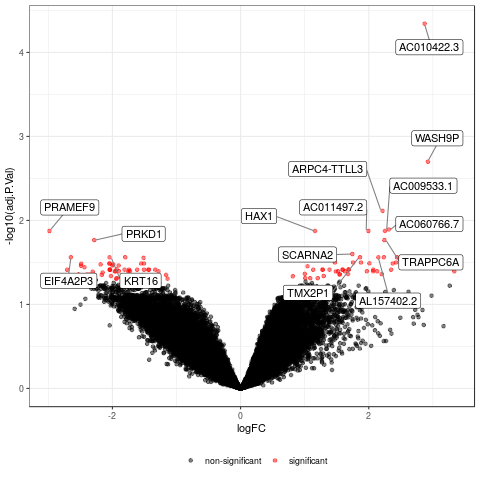

In [845]:
%%R -i degs_tcc
volcano_plot(degs_tcc, significant_only=F, transparency=0.5)

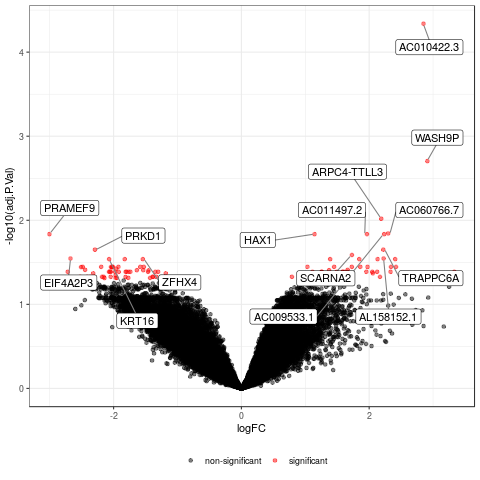

In [847]:
%%R -i degs_tmm
volcano_plot(degs_tmm, significant_only=F, transparency=0.5)

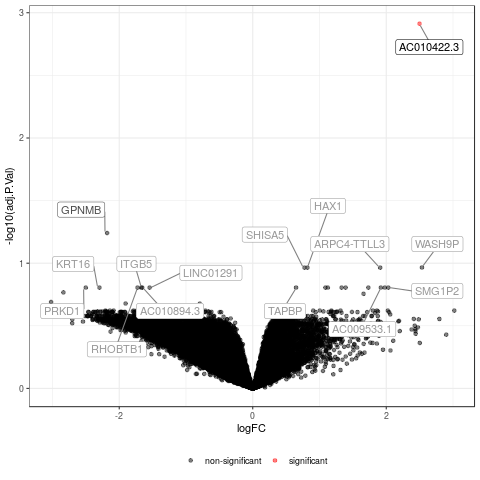

In [1201]:
%%R -i degs_rle
volcano_plot(degs_rle, significant_only=F, transparency=0.5)

AC010422.3 is NMD variant of MAN2B1 (Mannosidase Alpha Class 2B Member 1)

> This gene encodes an enzyme that hydrolyzes terminal, non-reducing alpha-D-mannose residues in alpha-D-mannosides. Its activity is necessary for the catabolism of N-linked carbohydrates released during glycoprotein turnover and it is member of family 38 of glycosyl hydrolases [RefSeq]

Related to alpha-Mannosidosis, a lysosomal storage diseases. Likely a false positive, but who knows?

**Just occurred to be when reading the latest PubMed alert on TB Meningitis**, with a study on Lipoarabinomannan as a diagnostic test for TBM:

Unrelated Uniprot entry which explains relation to LM and LAM:
> P9WMZ3
> - GDP-mannose-dependent alpha-(1-6)-phosphatidylinositol monomannoside mannosyltransferase
> Involved in the biosynthesis of phosphatidyl-myo-inositol mannosides (PIM) which are early precursors in the biosynthesis of lipomannans (LM) and lipoarabinomannans (LAM) (PubMed:19395496). Catalyzes the addition of a mannosyl residue from GDP-D-mannose (GDP-Man) to the position 6 of a phosphatidyl-myo-inositol bearing an alpha-1,2-linked mannose residue (PIM1) to generate phosphatidyl-myo-inositol bearing alpha-1,2- and alpha-1,6-linked mannose residues (Ac1PIM2) (PubMed:19395496). 

So there is some thin, indirect link between AC010422.3 and TBM... Is it possible that the RNA that we observe is not an NMD variant of a human gene but a bacterial one?
Unlikely, blasting returns only mammals; I blasted using both cDNA and protein sequences.

[Ensembl](http://www.ensembl.org/Homo_sapiens/Transcript/Summary?db=core;g=ENSG00000269242;r=19:12643831-12648397;t=ENST00000597692), [Uniprot](https://www.uniprot.org/uniprot/M0QZ24)

LM blocks immune system of human macrophages (https://www.pnas.org/content/108/42/17408, TNF biosynthesis: MAPK-activated protein kinase 2 (MK2) and microRNA miR-125b). Anyway, time to move on.

In [849]:
degs_tmm.query('gene_name == "MAN2B1"')

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000104774,0.482098,6.757319,1.626566,0.108968,0.304995,-5.11164,MAN2B1,protein_coding,19,-


An even wilder idea: could TB reprogram human cells to produce a protein which is useful for its wall assembly?

Well the reprogramming is not a stupid idea per-se - [there  was an offer of PhD on UCL](https://www.findaphd.com/phds/project/reprogramming-of-human-host-cells-by-mycobacteria-a-cell-biology-approach/?p37576). A study from 2008 looked at the cross talk but used microarays so was rather unable to detect this transcript https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2151136/

- A good review from 2005: https://academic.oup.com/femsre/article/29/5/1041/546335 but no mention of cell transformation, other than the mycobacterium can traffic its proteins to the cytosol of the host:
> If the virulence of M. tuberculosis is dependent on the activity of mycobacterial phospho-proteins, **secretion of these proteins into the phagosome, and possibly through the phagosomal membrane into the host cell cytoplasm, is likely**. Secretion of bacterial protein into the host cell is critical for the intracellular survival of pathogens such as Salmonella and Yersinia[78]. The recent identification of a specified secretion system in mycobacteria [79, 80] raises the possibility of active transport of mycobacterial proteins into the host cell. Significantly, the culture medium of M. tuberculosis shows the presence of a protein tyrosine phosphatase [81] and a protein kinase [82], indicating an active secretion of these proteins

Terminology alert: if this was a thing we would probably refer to it as bactofection as bacterial transfection is already used for an unrelated procedure. 

In [168]:
from helpers.r import r_function

add_p_value_for_filtered_subset = partial(r_function, 'add_p_value_for_filtered_subset')
add_p_value_for_weighted_hypothesis = partial(r_function, 'add_p_value_for_weighted_hypothesis')
    
def apply_to_degs(dicts_with_degs, func, **kwargs):
        return {
            k: func(v, **kwargs)
            for k, v in dicts_with_degs.items()
        }
    
filter_degs = partial(apply_to_degs, func=add_p_value_for_filtered_subset)
weight_degs = partial(apply_to_degs, func=add_p_value_for_weighted_hypothesis)

In [719]:
limma_filtered_degs = filter_degs(limma_degs)

In [170]:
tb_cm_degs_filtered = with_gene_data(limma_filtered_degs['voom_tmm'])
tb_cm_degs_filtered.head(10)

,logFC,AveExpr,t,P.Value,adj.P.Val,...,unfiltered.adj.P.Val,gene_name,biotype,contig,strand
ENSG00000100226,1.033786,7.263131,4.437090,0.000039,0.039285,...,0.035825,GTPBP1,protein_coding,22,+
ENSG00000164054,1.112920,7.198418,4.231338,0.000079,0.040137,...,0.041020,SHISA5,protein_coding,3,-
ENSG00000055332,1.075537,8.456809,3.291954,0.001655,0.042205,...,0.084109,EIF2AK2,protein_coding,2,-
ENSG00000101294,0.770991,7.168689,3.594118,0.000650,0.042205,...,0.072242,HM13,protein_coding,20,+
ENSG00000102096,0.990084,7.209150,3.503469,0.000865,0.042205,...,0.079290,PIM2,protein_coding,X,-
ENSG00000107099,0.909200,9.324414,3.423674,0.001108,0.042205,...,0.083024,DOCK8,protein_coding,9,+
ENSG00000107201,1.215734,7.307868,3.287864,0.001746,0.042205,...,0.084109,DDX58,protein_coding,9,-
ENSG00000107290,0.845222,8.874543,3.280811,0.001712,0.042205,...,0.084109,SETX,protein_coding,9,-
ENSG00000111335,1.280150,8.099110,4.040337,0.000151,0.042205,...,0.047330,OAS2,protein_coding,12,+
ENSG00000112343,0.868263,7.989724,3.366615,0.001320,0.042205,...,0.083979,TRIM38,protein_coding,6,+


In [171]:
tb_cm_degs_weighted = with_gene_data(add_p_value_for_weighted_hypothesis(limma_degs['voom_tmm']))
tb_cm_degs_weighted.head(10)

,logFC,AveExpr,t,P.Value,adj.P.Val,...,unweighted.adj.P.Val,gene_name,biotype,contig,strand
ENSG00000269242,2.850623,1.151840,7.092514,1.582206e-09,0.000109,...,0.000046,AC010422.3,protein_coding,19,-
ENSG00000279457,2.911276,0.294718,5.957668,1.363680e-07,0.007281,...,0.001977,WASH9P,unprocessed_pseudogene,1,-
ENSG00000100226,1.033786,7.263131,4.437090,3.870477e-05,0.031199,...,0.035825,GTPBP1,protein_coding,22,+
ENSG00000164054,1.112920,7.198418,4.231338,7.908860e-05,0.032636,...,0.041020,SHISA5,protein_coding,3,-
ENSG00000185507,1.372894,6.832088,4.320428,5.814908e-05,0.032636,...,0.039213,IRF7,protein_coding,11,-
ENSG00000278249,1.730000,3.121146,4.821462,9.807885e-06,0.032636,...,0.025854,SCARNA2,scaRNA,1,+
ENSG00000111788,2.234684,0.843328,5.132164,3.133927e-06,0.035378,...,0.014625,AC009533.1,unprocessed_pseudogene,12,+
ENSG00000274827,-1.826270,3.457761,-4.643182,1.864643e-05,0.035378,...,0.028969,LINC01297,lincRNA,14,-
ENSG00000111335,1.280150,8.099110,4.040337,1.513833e-04,0.040707,...,0.047330,OAS2,protein_coding,12,+
ENSG00000005339,0.731574,8.954208,3.198832,2.186645e-03,0.045543,...,0.089054,CREBBP,protein_coding,16,-


In [172]:
tb_cm_degs.head(10)

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000269242,2.850623,1.151840,7.092514,1.582206e-09,0.000046,11.219056,AC010422.3,protein_coding,19,-
ENSG00000279457,2.911276,0.294718,5.957668,1.363680e-07,0.001977,7.024647,WASH9P,unprocessed_pseudogene,1,-
ENSG00000250151,2.189311,1.272580,5.439394,9.911301e-07,0.009580,5.367719,ARPC4-TTLL3,protein_coding,3,+
ENSG00000267745,2.297618,1.393316,5.255802,1.976942e-06,0.014331,4.706754,AC060766.7,processed_transcript,17,-
ENSG00000111788,2.234684,0.843328,5.132164,3.133927e-06,0.014625,4.184976,AC009533.1,unprocessed_pseudogene,12,+
ENSG00000143575,1.144665,4.601693,5.135412,3.096367e-06,0.014625,4.403460,HAX1,protein_coding,1,+
ENSG00000204505,-3.005359,0.494087,-5.081866,3.776041e-06,0.014625,3.882400,PRAMEF9,protein_coding,1,+
ENSG00000269374,1.965517,0.174522,5.063937,4.034845e-06,0.014625,4.112161,AC011497.2,processed_pseudogene,19,-
ENSG00000007255,2.220900,-0.015033,4.887718,7.706511e-06,0.022347,3.201577,TRAPPC6A,protein_coding,19,-
ENSG00000184304,-2.292532,0.462342,-4.911217,7.072763e-06,0.022347,3.328537,PRKD1,protein_coding,14,-


Caveat: independent filtering may be done with respect to analyzed groups or entire experiment. Which one is better?

In [173]:
%%R -o voom_tmm_filtered_non_agressive
voom_tmm_filtered_non_agressive = add_p_value_for_filtered_subset(voom_tmm, use_deseq2_method=T)

In [174]:
tb_cm_degs_filtered_non_agressive = with_gene_data(voom_tmm_filtered_non_agressive)

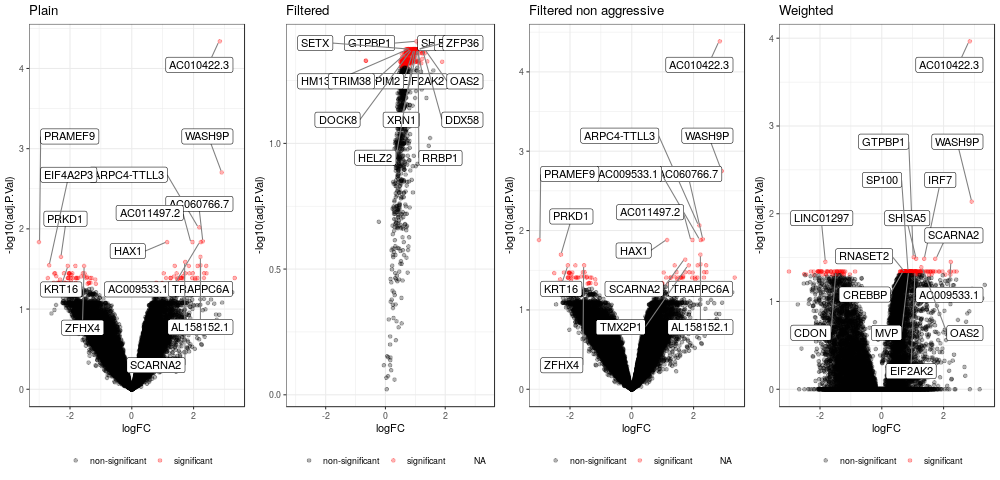

In [175]:
%%R -i tb_cm_degs_filtered -i tb_cm_degs_weighted -i tb_cm_degs -w 1000 -i tb_cm_degs_filtered_non_agressive

gridExtra::grid.arrange(
    volcano_plot(tb_cm_degs, significant_only=F, transparency=0.3) + ggtitle('Plain'),
    volcano_plot(tb_cm_degs_filtered, significant_only=F, transparency=0.3) + ggtitle('Filtered'),
    volcano_plot(tb_cm_degs_filtered_non_agressive, significant_only=F, transparency=0.3) + ggtitle('Filtered non aggressive'),
    volcano_plot(tb_cm_degs_weighted, significant_only=F, transparency=0.3) + ggtitle('Weighted'),
    ncol=4
)

> More realistic nonspecific filters can also detrimentally affect the conditional distribution of the test statistic. The limma t-statistic (Embedded Image) is based on an empirical Bayes approach which models the gene-level error variances Embedded Image with a scaled inverse χ2 distribution. For many microarray datasets, this distribution provides a good fit (4). In ref. 7, an overall variance filter is combined with the limma Embedded Image. Because the within-class variance estimator (Embedded Image) and the overall variance are correlated, filtering on overall variance will deplete the set of genes with low Embedded Image (Fig. 2B). A scaled inverse χ2 will then no longer provide a good fit to the data passing the filter, causing the limma algorithm to produce a posterior degrees-of-freedom estimate of ∞. This has two consequences: (i) gene-level variance estimates will be ignored, leading to an unintended analysis based on fold change only; and (ii) the p-values will be overly optimistic (Fig. 2C). See SI Text for details.

> Moderated t-statistics like the limma T^ are also often used to avoid discoveries with small effect sizes. Further, the null distribution for Embedded Image is typically more concentrated than that of the standard t-statistic. In many cases, this concentration also produces power gains—gains which may exceed those obtained by the combination of variance filtering and the standard t-statistic. Can even greater power gains be obtained by combining filtering and moderation? Perhaps, but Fig. 2C shows that such an approach has the potential to inflate the false positive rate when the sample size is small. Thus, we do not recommend combining limma with a filtering procedure which interferes with its distributional assumptions. We are therefore left with two options: variance filtering combined with the standard T, or an unfiltered Embedded Image. Each option addresses the issue of small effect sizes, and each can improve power. Which one provides the best improvement is data dependent, and we provide further examples and discussion in SI Text. (https://www.pnas.org/content/107/21/9546)

There is an interesting correspondence between creators of limma and DESeq2 (including genefilter) published on bioconductor. Picking some fragments in favour of using genefilter for limma:

> In reality, filtering low intensity probes (not low variance probes) is usually of benefit to limma, and we do this routinely for nearly all analyses in my lab. This is for a number of reasons.
 
> First there is the generic (not specific to limma) reason that probes that are not detecting real signal to any worthwhile degree for any sample cannot be detecting DE to any worthwhile degree. Therefore there is a positive correlation between mean log intensity and true DE.

> Second there is the limma-specific reason that probes that are not detecting signal above background levels in any sample trend to have atypical variances, both in absolute size and in terms of mean- variance relationship, compared to probes that are responding to genuine biological signal. In other words, non-expressed or dead probes have variances that cannot be considered to be sampled from the same population as variances for probes from regular expressed probes. It is desirable to get rid of these atypical probes so that limma can concentrate on the behaviour of probes of genuine interest. Filtering by mean log-intensity does not cause any problems for the limma probabilistic model. Indeed it generally improves concordance with the empirical Bayes assumptions.

(https://support.bioconductor.org/p/53061/)

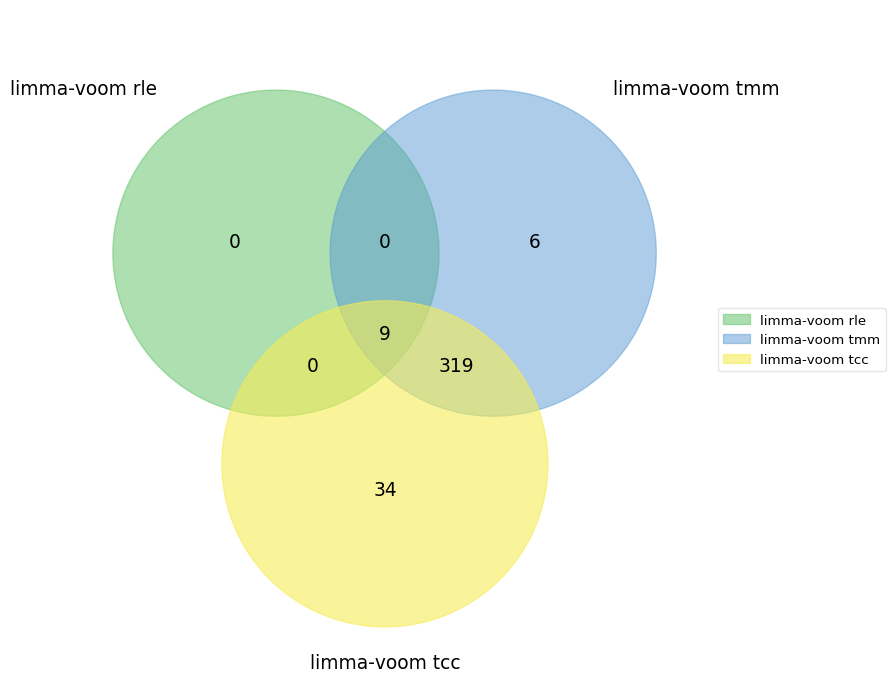

In [721]:
limma_venn({k: list(v[v['adj.P.Val'] < 0.05].index) for k, v in limma_filtered_degs.items()});

There is a high agreement for significantly changed gene sets:

In [723]:
%%R -o gs_trend_tmm -o gs_trend_rle -o gs_voom_rle -o gs_voom_tmm
gs_trend_tmm = calc_camera('Tuberculosis', 'Cryptococcal', tmm_normalized, by_condition_no_outliers)
gs_trend_rle = calc_camera('Tuberculosis', 'Cryptococcal', rle_normalized, by_condition_no_outliers)
gs_voom_rle = calc_camera('Tuberculosis', 'Cryptococcal', rle_normalized, by_condition_no_outliers, voom=T, quality_weights=T)
gs_voom_tmm = calc_camera('Tuberculosis', 'Cryptococcal', tmm_normalized, by_condition_no_outliers, voom=T, quality_weights=T)

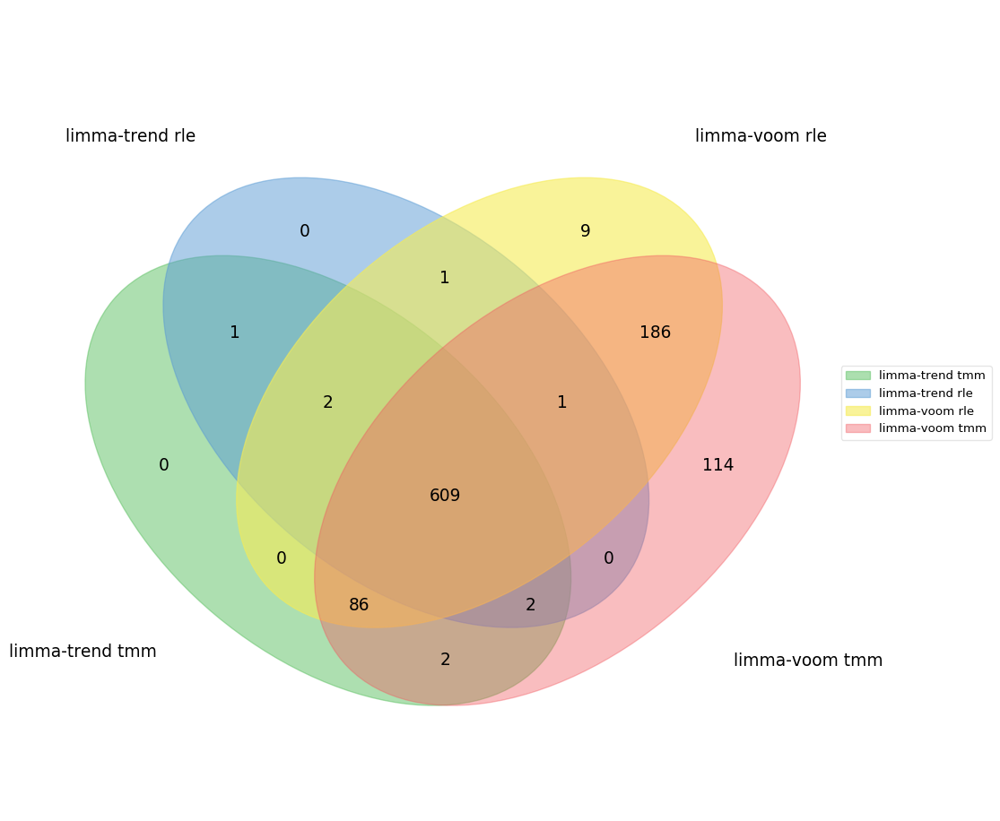

In [182]:
limma_gene_sets = {'trend_tmm': gs_trend_tmm, 'trend_rle': gs_trend_rle, 'voom_rle': gs_voom_rle, 'voom_tmm': gs_voom_tmm}
limma_venn({k: list(v[v.FDR < 0.05].index) for k, v in limma_gene_sets.items()});

In [184]:
tb_cm_gene_sets = gs_voom_tmm
tb_cm_gene_sets.head(10)

,NGenes,Direction,PValue,FDR
Signaling by the B Cell Receptor (BCR),160.0,Up,1.437216e-22,2.358471e-19
Fc epsilon receptor (FCERI) signaling,185.0,Up,1.990306e-21,1.414375e-18
Processing of Capped Intron-Containing Pre-mRNA,239.0,Up,2.585694e-21,1.414375e-18
mRNA Splicing - Major Pathway,180.0,Up,5.697361e-21,2.065498e-18
FCERI mediated NF-kB activation,133.0,Up,6.293412e-21,2.065498e-18
mRNA Splicing,188.0,Up,2.740110e-20,7.494202e-18
Ub-specific processing proteases,184.0,Up,3.578094e-18,8.388074e-16
FCERI mediated Ca+2 mobilization,84.0,Up,4.338695e-18,8.899748e-16
Infectious disease,376.0,Up,5.222245e-18,9.521894e-16
Interferon Signaling,192.0,Up,5.828123e-18,9.563949e-16


### Definite Tuberculosis vs Cryptococcal

In [878]:
%%R
stopifnot(
    length(by_condition_and_tb_subset_no_outliers) == length(by_condition_no_outliers)
)

In [1746]:
%%R
tmm_normalized_tb_subsets = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis', method='TMM')
rle_normalized_tb_subsets = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis', method='RLE')
eee_normalized_tb_subsets = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis', method='TMM', test_method='voom', iterations=3)
qtotal_normalized_tb_subsets = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis', method='qtotal')

[1] "Retaining: 59.29%"
[1] "Retaining: 59.29%"
[1] "Retaining: 59.29%"
TCC::INFO: Calculating normalization factors using DEGES
TCC::INFO: (iDEGES pipeline : tmm - [ voom - tmm ] X 3 )
TCC::INFO: Done.
[1] "Retaining: 59.29%"


notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.


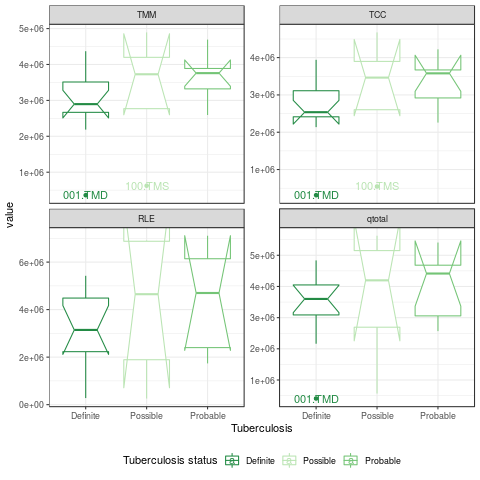

In [1770]:
%%R
df = reshape::melt(data.frame(
    TMM=size_factors(tmm_normalized_tb_subsets),
    TCC=size_factors(eee_normalized_tb_subsets),
    RLE=size_factors(rle_normalized_tb_subsets),
    qtotal=size_factors(qtotal_normalized_tb_subsets),
    Meningitis=by_condition_and_tb_subset_no_outliers,
    Tuberculosis=sub(' tuberculosis', '', by_condition_and_tb_subset_no_outliers),
    patient=as.character(names(by_condition_no_outliers))
), id=c('Meningitis', 'patient', 'Tuberculosis'))
(
    ggplot(df[grepl('tuberculosis',df$Meningitis),], aes(y=value, x=Tuberculosis, color=Tuberculosis))
    + facet_wrap('variable', scales='free_y')
    + geom_boxplot(notch=T)
    + nice_theme
    + geom_text(aes(
        label=label_outliers(
            label=patient,
            value=value,
            group=interaction(variable, Meningitis)
        )
    ))
    + color_tuberculosis
)

In [1748]:
%%R
# ddd_normalized_tb_subsets = preprocess_limma(raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers, 'Definite tuberculosis', method='deseq2', , test_method='deseq2', iterations=3)

NULL


In [ ]:
normalized_counts_path.mkdir(exist_ok=True)
normalized_counts_path = str(normalized_counts_path)

In [801]:
%%R -i normalized_counts_path
import::here(extract_counts, .from='helpers/differential_expression.R')

write.csv(
    edgeR::cpm(tmm_normalized_tb_subsets, log=T),
    file=paste0(normalized_counts_path, '/tmm_for_subsets.csv')
)
write.csv(
    edgeR::cpm(rle_normalized_tb_subsets, log=T),
    file=paste0(normalized_counts_path, '/rle_for_subsets.csv')
)

In [1750]:
%%R -o definite_tb_cm_voom_tmm -o definite_tb_cm_voom_rle -o definite_tb_cm_trend_tmm -o definite_tb_cm_trend_rle -o definite_tb_cm_voom_eee -o definite_tb_cm_voom_qtotal
definite_tb_cm_voom_tmm = calc_de('Definite tuberculosis', 'Cryptococcal', tmm_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T)
definite_tb_cm_voom_rle = calc_de('Definite tuberculosis', 'Cryptococcal', rle_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T)
definite_tb_cm_voom_eee = calc_de('Definite tuberculosis', 'Cryptococcal', eee_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T)
definite_tb_cm_voom_qtotal = calc_de('Definite tuberculosis', 'Cryptococcal', qtotal_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T)

definite_tb_cm_trend_tmm = calc_de('Definite tuberculosis', 'Cryptococcal', tmm_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers)
definite_tb_cm_trend_rle = calc_de('Definite tuberculosis', 'Cryptococcal', rle_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers)

# maybe also:
# definite_tb_cm_voom_ddd = calc_de('Definite tuberculosis', 'Cryptococcal', ddd_normalized_tb_subsets, by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T)
# ?

In [1772]:
with_gene_data(definite_tb_cm_voom_eee).sort_values('adj.P.Val').head()

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000269242,2.954167,1.293034,6.295016,3.174365e-08,0.001096,7.976849,AC010422.3,protein_coding,19,-
ENSG00000224789,3.520456,-1.066779,5.872140,1.684759e-07,0.002908,4.972601,AC012363.1,antisense,2,-
ENSG00000103257,1.502066,6.022791,4.859463,7.986485e-06,0.053380,3.519289,SLC7A5,protein_coding,16,-
ENSG00000130589,1.401480,7.665940,4.741438,1.230990e-05,0.053380,3.125270,HELZ2,protein_coding,20,-
ENSG00000185507,1.627556,6.973281,4.733268,1.268210e-05,0.053380,3.098407,IRF7,protein_coding,11,-


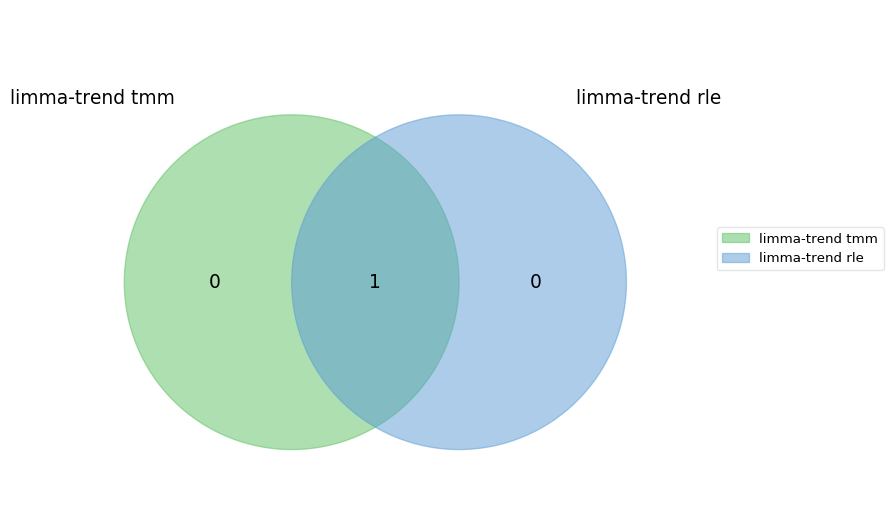

In [1752]:
definite_tb_cm_trend_cmp = {
    'trend_tmm': definite_tb_cm_trend_tmm,
    'trend_rle': definite_tb_cm_trend_rle
}

definite_tb_cm_voom_cmp = {
    'voom_tmm': definite_tb_cm_voom_tmm,
    'voom_rle': definite_tb_cm_voom_rle,
    'voom_eee': definite_tb_cm_voom_eee,
    'voom_qtotal': definite_tb_cm_voom_qtotal
}

limma_venn({k: list(v[v['adj.P.Val'] < 0.05].index) for k, v in definite_tb_cm_trend_cmp.items()});

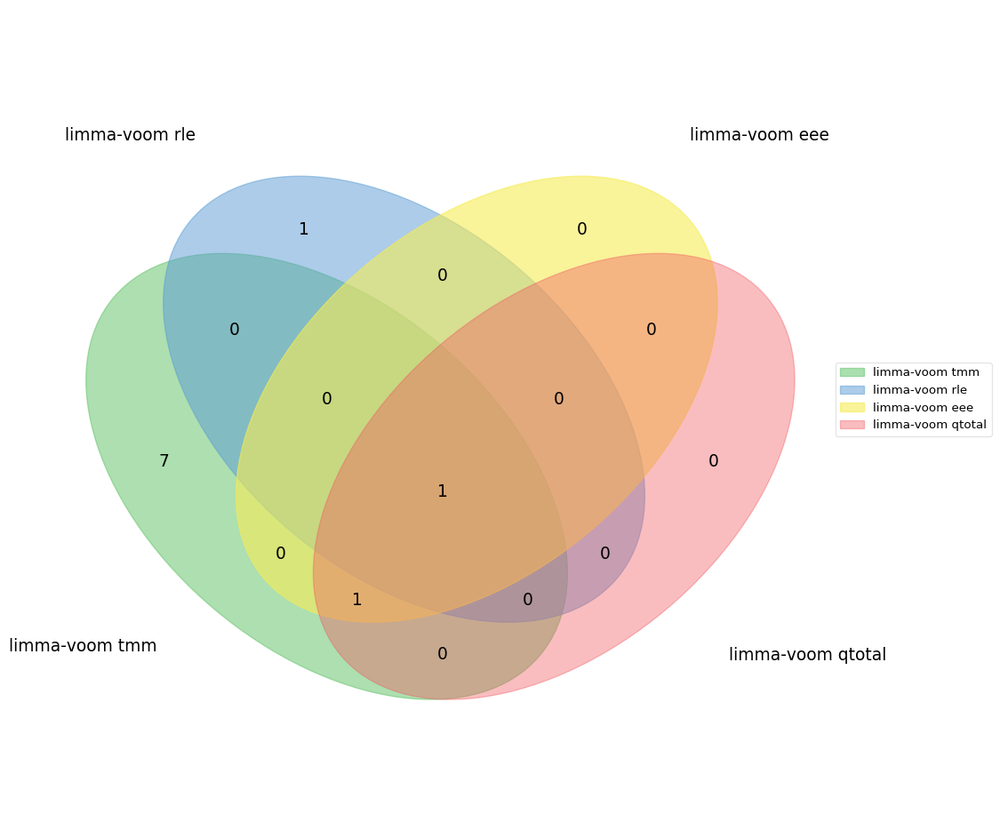

In [1753]:
limma_venn({k: list(v[v['adj.P.Val'] < 0.05].index) for k, v in definite_tb_cm_voom_cmp.items()});

In [1774]:
with_gene_data(definite_tb_cm_voom_cmp['voom_qtotal']).head(2)

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000269242,2.788370,1.001059,6.001519,1.020012e-07,0.003522,6.921410,AC010422.3,protein_coding,19,-
ENSG00000224789,3.395694,-1.358754,5.541521,6.117294e-07,0.010560,3.901331,AC012363.1,antisense,2,-


In [1266]:
with_gene_data(definite_tb_cm_voom_cmp['voom_rle']).head(2)

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000269242,2.662394,1.141511,5.781173,3.020729e-07,0.010429,4.647664,AC010422.3,protein_coding,19,-
ENSG00000164054,0.897120,7.188088,5.581236,6.417948e-07,0.011079,5.887480,SHISA5,protein_coding,3,-


AC010422.3 keeps popping up! Although it is missing in the DESeq2 results (likely filtered out in the very first step):

In [1826]:
'ENSG00000269242' in set(reference_definite_tbm_cm_deg.index)

False

The other one (AC012363.1) is related to Inhibin beta B chain, annotated to be related to regulation of MAPK cascade.

**With independent filtering:**

TODO: independent filtering can be based on the mean for compared disease pairs only or on the mean for all samples. In the latter case it "borrows" the information on the importance of transcripts from other samples - which is usually ok; but again, we got a fairly specific setting - CSF - which makes it less obvious to explain.

In [1776]:
%%R -o base_mean
samples = by_condition_and_tb_subset_no_outliers == 'Cryptococcal' | by_condition_and_tb_subset_no_outliers == 'Definite tuberculosis'
base_mean = rowMeans(tmm_normalized_tb_subsets$counts[,samples])[rownames(definite_tb_cm_voom_tmm)]

In [1777]:
definite_tb_cm_cmp = {
    **definite_tb_cm_trend_cmp,
    **definite_tb_cm_voom_cmp
}

So this is blind/non-blind filtering decision...

In [1778]:
# definite_tb_cm_limma_cmp_filtered = filter_degs(definite_tb_cm_cmp, expression_col=base_mean)

Or on the mean from the entire experiment:

In [1779]:
definite_tb_cm_limma_cmp_filtered = filter_degs(definite_tb_cm_cmp)

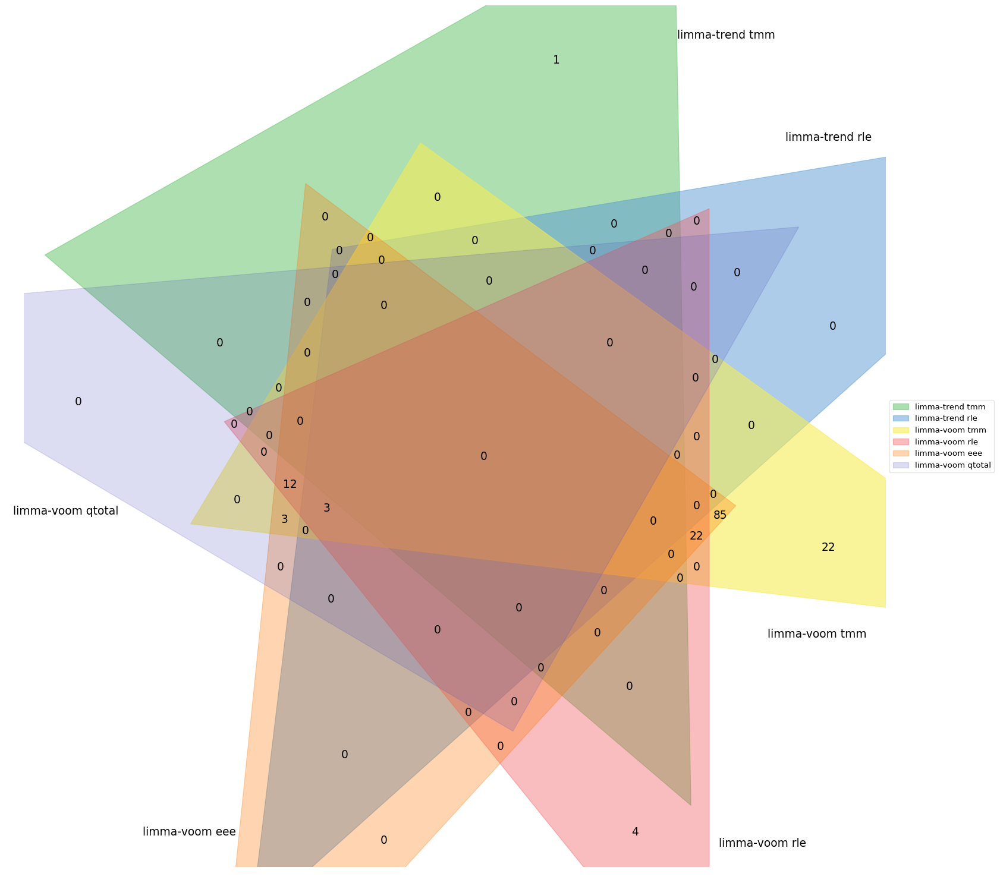

In [1780]:
filtered_significant = {
    k: list(v[v['adj.P.Val'] < 0.05].index)
    for k, v in definite_tb_cm_limma_cmp_filtered.items()
}
limma_venn(filtered_significant);

Wow, the venn library is really powerfull.

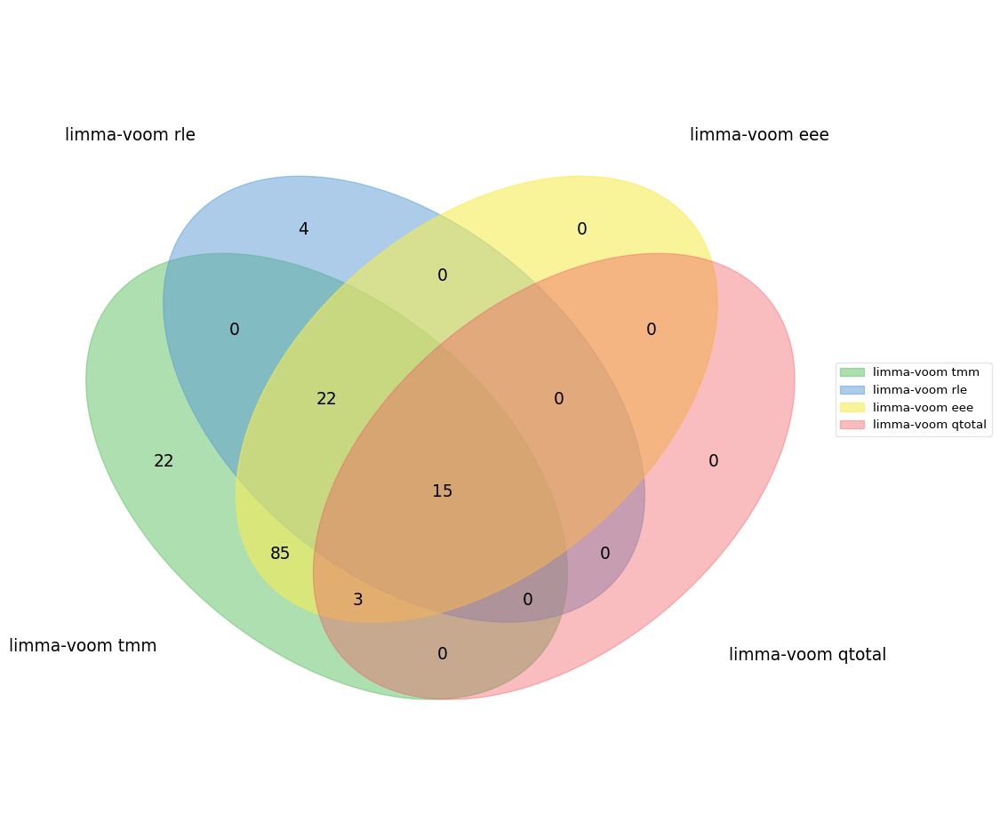

In [1785]:
limma_venn(
    {
        k: v for k, v in filtered_significant.items()
        if k in ['voom_tmm', 'voom_rle', 'voom_qtotal', 'voom_eee']
    }
);

TMM and EEE seem to produce very comparable results for the top genes with TMM giving lower p-values.
Maybe using EEE would make sense, as it seem to be more conservative?

The more advanced normalization method, the fewer genes are significant; The 15 in the overlap may be worth checking out.

In [1830]:
intersection = (
    set(filtered_significant['voom_qtotal'])
    &
    set(filtered_significant['voom_tmm'])
    &
    set(filtered_significant['voom_rle'])
)

In [1798]:
show_table(with_gene_data(
    definite_tb_cm_limma_cmp_filtered['voom_qtotal'].loc[
        intersection
    ]
))

,logFC,AveExpr,t,P.Value,adj.P.Val,B,unfiltered.adj.P.Val,gene_name,biotype,contig,strand
ENSG00000130589,1.282727,7.373965,4.460156,0.000034,0.009387,2.176276,0.090259,HELZ2,protein_coding,20,-
ENSG00000164054,1.135537,7.047637,4.479131,0.000032,0.009387,2.240838,0.090259,SHISA5,protein_coding,3,-
ENSG00000100226,1.057167,7.112350,4.487156,0.000031,0.009387,2.272845,0.090259,GTPBP1,protein_coding,22,+
ENSG00000117298,1.334013,7.096943,4.589755,0.000021,0.009387,2.604434,0.090259,ECE1,protein_coding,1,-
ENSG00000185507,1.525334,6.681307,4.555014,0.000025,0.009387,2.462515,0.090259,IRF7,protein_coding,11,-
ENSG00000128016,1.330670,8.599491,4.106774,0.000143,0.032828,0.831959,0.173786,ZFP36,protein_coding,19,+
ENSG00000173039,1.099558,7.149904,3.937213,0.000207,0.040787,0.510559,0.192912,RELA,protein_coding,11,-
ENSG00000101294,0.792825,7.017908,3.743350,0.000392,0.045895,-0.068643,0.236227,HM13,protein_coding,20,+
ENSG00000178927,0.827330,7.076179,3.657985,0.000517,0.045895,-0.315857,0.236916,CYBC1,protein_coding,17,-
ENSG00000142599,0.869132,8.149014,3.626532,0.000572,0.045895,-0.454167,0.237984,RERE,protein_coding,1,-


In [1840]:
deseq_intersection = reference_definite_tbm_cm_deg.loc[intersection]
sum(deseq_intersection.padj < 0.05)

11

In [1846]:
list(deseq_intersection[deseq_intersection.padj < 0.05].ensembl_gene_name)

['HM13',
 'HELZ2',
 'SHISA5',
 'RERE',
 'IFITM1',
 'RELA',
 'ZFP36',
 'GTPBP1',
 'ECE1',
 'IRF7',
 'MVP']

### Comparing to DESeq2

- Limma-trend is more similar (than voom) to DESeq2 as both use gene-level mean-variance trend adjustment (whereas voom does it on observation-level).
- RLE normalization corresponds to the DESeq2 normalization

Thus, limma-trend with RLE is expected to agree with DESeq2 the most. Voom is expected to offer more power as it corrects the "noise" from the experimental setup better.

In [1848]:
significant_deseq2 = reference_definite_tbm_cm_deg.query('padj < 0.05').index

In [1849]:
reference_definite_tbm_cm_deg.head()

,ensembl_gene_name,description,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ensembl_id,,,,,,,,
ENSG00000100226,GTPBP1,GTP binding protein 1,580.453924,1.192190,0.219708,5.426243,5.755269e-08,0.000517
ENSG00000165997,ARL5B,ADP ribosylation factor like GTPase 5B,222.402492,1.963330,0.393233,4.992789,5.951353e-07,0.001903
ENSG00000164691,TAGAP,T-cell activation RhoGTPase activating protein,1023.319959,1.964425,0.394441,4.980279,6.349261e-07,0.001903
ENSG00000108771,DHX58,DExH-box helicase 58,125.298558,1.785542,0.367150,4.863249,1.154747e-06,0.002481
ENSG00000128016,ZFP36,ZFP36 ring finger protein,2070.881325,1.683438,0.348691,4.827880,1.379940e-06,0.002481


In [1286]:
def get_limma_significant(data, threshold=0.05):
    return data[data['adj.P.Val'] < threshold]

def significant_ensembl(data, **kwargs):
    return get_limma_significant(data, **kwargs).index

#### Limma-trend

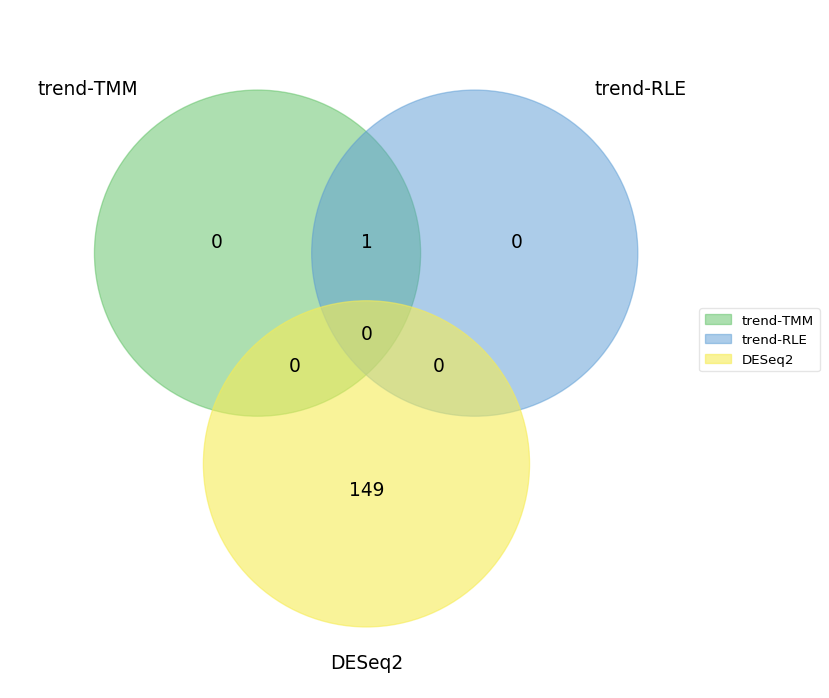

In [1287]:
venn3({
    'trend-TMM': significant_ensembl(definite_tb_cm_trend_tmm),
    'trend-RLE': significant_ensembl(definite_tb_cm_trend_rle),
    'DESeq2': significant_deseq2
});

There is no intersection in significant genes and the limma-trend methods detect only of significant gene:

In [1288]:
significant_definite_tb_cm_trend_tmm = significant_ensembl(definite_tb_cm_trend_tmm)
get_gene(significant_definite_tb_cm_trend_tmm[0]).gene_name

'WISP1'

Which was filtered out by independent filtering step in DESeq2:

In [1852]:
reference_definite_tbm_cm_deg.loc[significant_definite_tb_cm_trend_tmm]

,ensembl_gene_name,description,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ENSG00000104415,WISP1,WNT1 inducible signaling pathway protein 1,22.30457,-2.882794,0.623437,-4.624037,0.000004,NaN


Notably the top 15 genes of trend-RLE have a decent intersection with the top 15 of DESeq2:

In [1854]:
head_deseq2 = reference_definite_tbm_cm_deg.head(15).index
intersection = set(head_deseq2) & set(definite_tb_cm_trend_rle.head(15).index)
[get_gene(g).gene_name for g in intersection]

['DHX58', 'GTPBP1', 'ECE1', 'IRF7']

For trend-TMM - less so:

In [1291]:
assert set() == set(head_deseq2) & set(definite_tb_cm_trend_tmm.head(15).index)

#### Voom

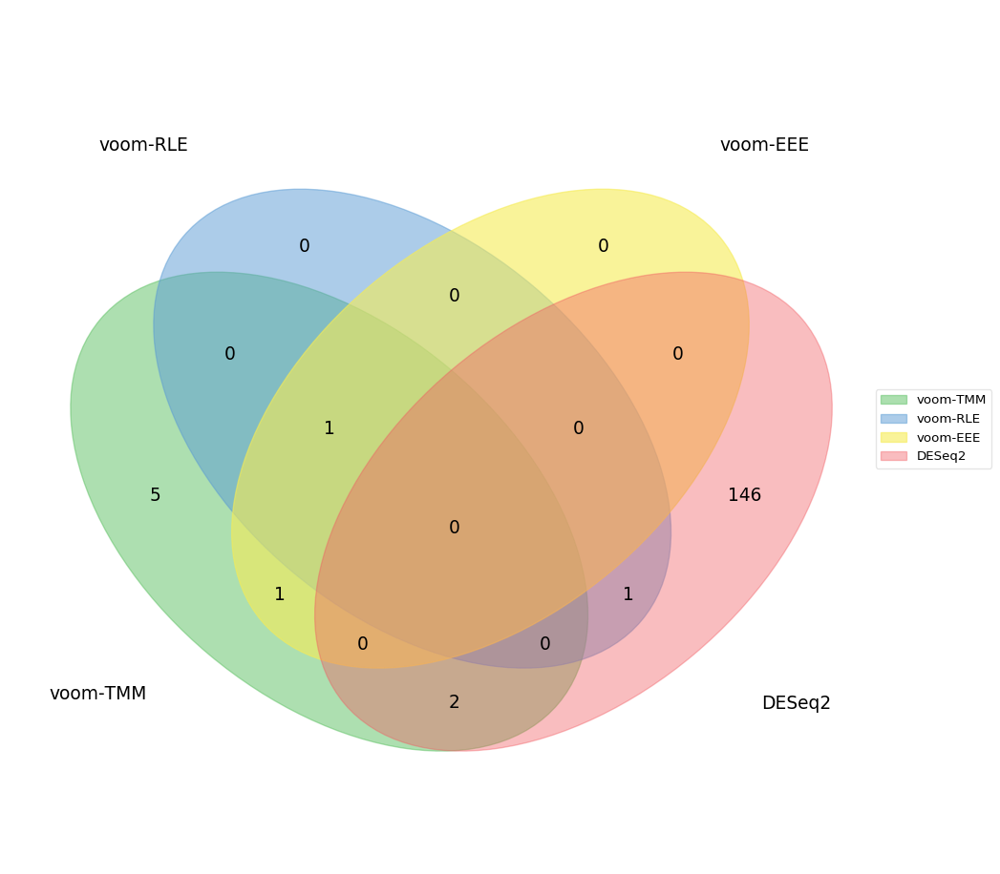

In [1292]:
venn4({
    'voom-TMM': significant_ensembl(definite_tb_cm_voom_tmm),
    'voom-RLE': significant_ensembl(definite_tb_cm_voom_rle),
    'voom-EEE': significant_ensembl(definite_tb_cm_voom_eee),
    'DESeq2': significant_deseq2
});

### With independent filtering

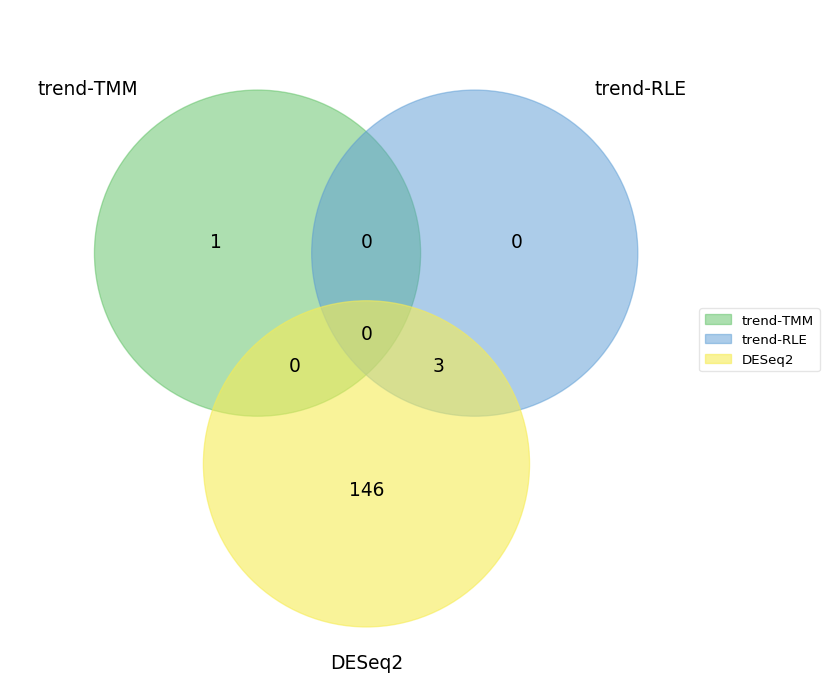

In [1293]:
venn3({
    'trend-TMM': significant_ensembl(definite_tb_cm_limma_cmp_filtered['trend_tmm']),
    'trend-RLE': significant_ensembl(definite_tb_cm_limma_cmp_filtered['trend_rle']),
    'DESeq2': significant_deseq2
});

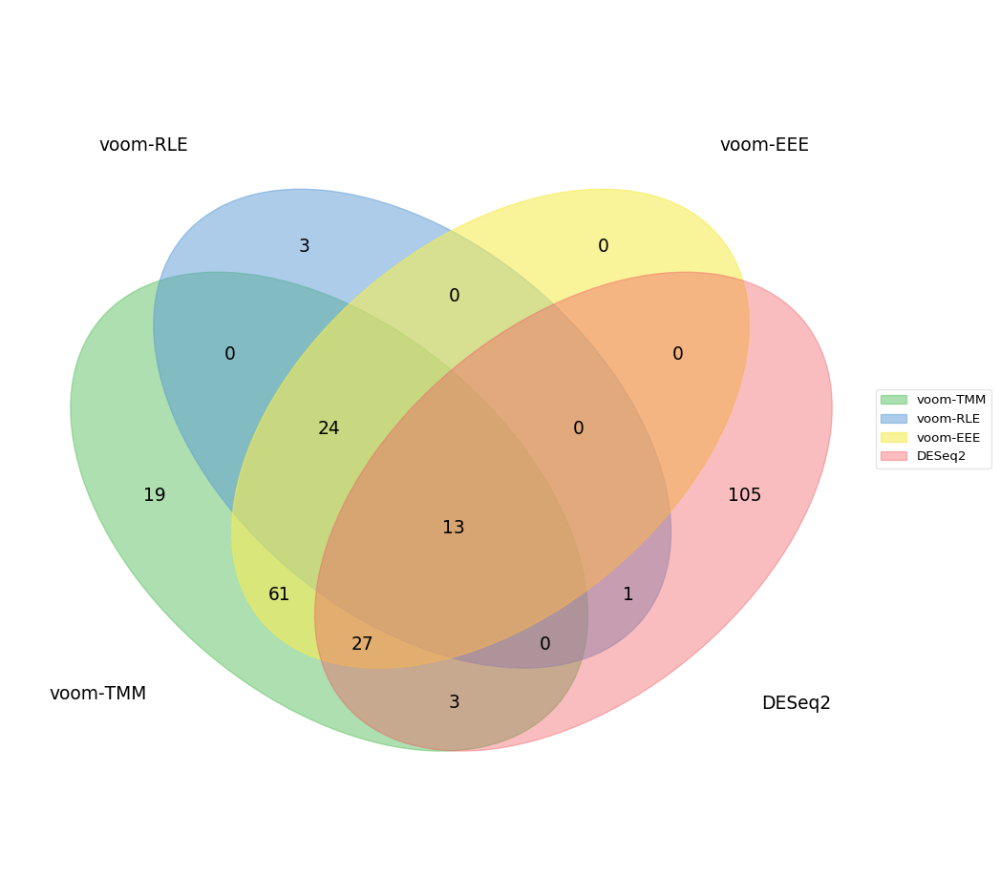

In [1294]:
venn4({
    'voom-TMM': significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_tmm']),
    'voom-RLE': significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_rle']),
    'voom-EEE': significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_eee']),
    'DESeq2': significant_deseq2
});

While one might think that voom-TMM is more closely aligned with DESeq2 than voom-RLE (which would be counterintuitive as RLE is used in DESeq2), this is not actually the case:

Ratio of voom-TMM significant genes aligned with DESeq2:

In [1295]:
(30 + 13) / (30 + 13 + 24 + 80)

0.2925170068027211

Ratio of voom-RLE significant genes aligned with DESeq2:

In [1300]:
(1 + 13) / (1 + 13 + 24 + 3)

0.34146341463414637

The intersection seem to have the highly DE genes enriched (which is a good thing):

In [1301]:
intersection_tmm = set(significant_deseq2) & set(significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_tmm']))

In [1302]:
comparison = concat([
    definite_tb_cm_limma_cmp_filtered['voom_tmm'][['adj.P.Val']].rename({'adj.P.Val': 'padj'}, axis=1).rank(method='first').loc[intersection_tmm].assign(method='voom-TMM'),
    reference_definite_tbm_cm_deg.set_index('ensembl_id')[['padj']].rank(method='first').loc[intersection_tmm].assign(method='DESeq2 dr Rachel'),
]).rename_axis('gene').reset_index()

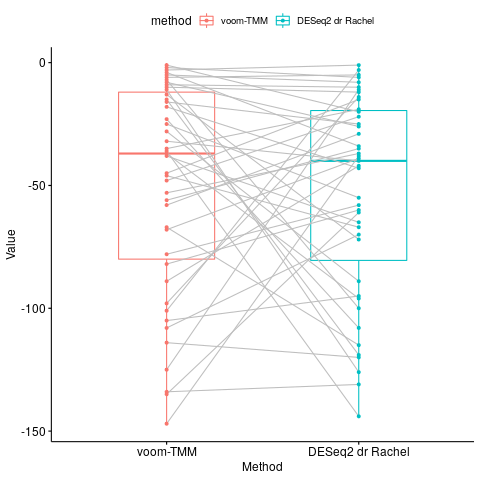

In [1303]:
%%R -i comparison
(
    ggpubr::ggpaired(
        comparison, x='method', y='-padj',
        color='method', line.color='gray', xlab='Method'
    )
)

The outliers detected in the preliminary analysis by dr Rachel are the same as detected here:

In [1304]:
%%R
reference_patients = by_condition_and_tb_subset[reference_samples, drop=F]
stopifnot(
    all(by_condition_and_tb_subset_no_outliers == reference_patients)
)

In [1305]:
%%R
library("BiocParallel")
register(MulticoreParam(6))

In [1311]:
%%R
get_deseq_definite_tb_cm = function(dds, shrinkage=NULL, ref=NULL, ...) {
    if(is.null(shrinkage)) {
        result = DESeq2::results(
            dds,
            contrast=c('conditions_for_deseq', 'Definite.tuberculosis', 'Cryptococcal'),
            parallel=T,
            ...
        )
    } else {
        dds$conditions_for_deseq = relevel(dds$conditions_for_deseq, 'Cryptococcal')
        dds = nbinomWaldTest(dds)

        result = lfcShrink(
            dds,
            coef='conditions_for_deseq_Definite.tuberculosis_vs_Cryptococcal',
            type=shrinkage,
            parallel=T,
            ...
        )
    }
    as.data.frame(result)
}

In [412]:
%%R -i reference_definite_tbm_cm_deg
conditions_for_deseq = factor(
    space_to_dot(
        by_condition_and_tb_subset[reference_samples, drop=F]
    )
)

dds_reproduction <- DESeq2::DESeqDataSetFromMatrix(
    countData = round(raw_counts_matrix[
        reference_definite_tbm_cm_deg$ensembl_id, 
        reference_samples
    ]),
    colData = as.data.frame(conditions_for_deseq),
    design = ~ conditions_for_deseq
)
dds_reproduction <- DESeq2::DESeq(dds_reproduction)

converting counts to integer mode
estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 14 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


In [256]:
%%R
library(DESeq2) # Note it seems that IHW relies on DESeq2 without proper prefixing, hence import into global namespace is necessary

In [414]:
%%R -o deseq2_with_filtering_reproduction -o deseq2_with_weighting_reproduction
deseq2_with_filtering_reproduction = get_deseq_definite_tb_cm(dds_reproduction)
deseq2_with_weighting_reproduction = get_deseq_definite_tb_cm(dds_reproduction, filterFun=IHW::ihw)

Like-for-like comparison against voom:

In [342]:
%%R
conditions_for_deseq = factor(
    space_to_dot(by_condition_and_tb_subset_no_outliers)
)

dds_edger_prefiltered <- DESeq2::DESeqDataSetFromMatrix(
    countData = round(raw_counts_matrix[
        rownames(c_dge_tb_subsets_filtered$counts),
        names(by_condition_and_tb_subset_no_outliers)
    ]),
    colData = as.data.frame(conditions_for_deseq),
    design = ~ conditions_for_deseq
)
dds_edger_prefiltered <- DESeq2::DESeq(dds_edger_prefiltered)

converting counts to integer mode
estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 218 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


In [517]:
%%R -o deseq2_with_filtering_apeglm -o deseq2_with_filtering_normal -o deseq2_with_filtering_ashr
deseq2_with_filtering_ashr = get_deseq_definite_tb_cm(dds_edger_prefiltered, shrinkage='ashr')
deseq2_with_filtering_apeglm = get_deseq_definite_tb_cm(dds_edger_prefiltered, shrinkage='apeglm')
deseq2_with_filtering_normal = get_deseq_definite_tb_cm(dds_edger_prefiltered, shrinkage='normal')

found results columns, replacing these
using 'ashr' for LFC shrinkage. If used in published research, please cite:
    Stephens, M. (2016) False discovery rates: a new deal. Biostatistics, 18:2.
    https://doi.org/10.1093/biostatistics/kxw041
found results columns, replacing these
using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895
found results columns, replacing these
using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).
additional priors are available via the 'type' argument, see ?lfcShrink for details


In [415]:
%%R -o deseq2_with_filtering -o deseq2_without_filtering -o deseq2_with_weighting
deseq2_with_filtering = get_deseq_definite_tb_cm(dds_edger_prefiltered)
deseq2_without_filtering = get_deseq_definite_tb_cm(dds_edger_prefiltered, independentFiltering=F)
deseq2_with_weighting = get_deseq_definite_tb_cm(dds_edger_prefiltered, filterFun=IHW::ihw)

In [416]:
from itertools import combinations

In [423]:
from scipy.stats import spearmanr

In [1858]:
labels = {
    'deseq2_Rachel': 'DESeq2 from dr Rachel',
    **{
        method.lower().replace('-', '_') + id_suffix: method + suffix
        for method in ['DESeq2', 'voom-TMM', 'voom-RLE', 'voom-EEE', 'voom-qtotal']
        for id_suffix, suffix in {
            '_no_filter': ' without filtering',
            '_filtered': ' filtered',
            '_reproduction': ' reproduced',
            '_weighted': ' weighted',
            '_shrinkage_normal': ' "normal" shrinkage',
            '_shrinkage_apeglm': ' "apeglm" shrinkage',
            '_shrinkage_ashr': ' "ashr" shrinkage'
        }.items()
    }
}

deseq_cols = ['pvalue', 'padj']
voom_cols = {
    'P.Value': 'pvalue',
    'adj.P.Val': 'padj'
}

p_values = {
    **{
        f'{method_id}_filtered': data[list(voom_cols)].rename(voom_cols, axis=1)
        for method_id, data in definite_tb_cm_limma_cmp_filtered.items()
    },
    **{
        f'{method_id}_no_filter': data[list(voom_cols)].rename(voom_cols, axis=1)
        for method_id, data in definite_tb_cm_cmp.items()
    },
    **{
        'deseq2_shrinkage_ashr': deseq2_with_filtering_ashr[deseq_cols],
        'deseq2_shrinkage_apeglm': deseq2_with_filtering_apeglm[deseq_cols],
        'deseq2_shrinkage_normal': deseq2_with_filtering_normal[deseq_cols],
        'deseq2_filtered': deseq2_with_filtering[deseq_cols],
        'deseq2_weighted': deseq2_with_weighting[deseq_cols],
        'deseq2_reproduction': deseq2_with_filtering_reproduction[deseq_cols],
        'deseq2_no_filter': deseq2_without_filtering[deseq_cols],
        'deseq2_Rachel': reference_definite_tbm_cm_deg[deseq_cols]
    }
}

def significant_set(p_values, threshold=0.05):
    return set(p_values.query(f'padj < {threshold}').index)

def significant_union(a, b, threshold=0.05):
    return (
        significant_set(p_values[a], threshold)
        |
        significant_set(p_values[b], threshold)
    )

def get_ranks(method, subset):
    return (
        p_values[method]
        .dropna()
        .loc[subset]
        .rename_axis('gene').reset_index()
        .sort_values(['padj', 'pvalue', 'gene'])
        .set_index('gene')
        .rank(method='dense', numeric_only=True)
        .assign(method=labels[method])
    ).rename(columns={'pvalue': 'pvalue_rank'})

def corr_label(res):
    return f'corr = {res.correlation:.2f}, p = {res.pvalue:.2f}'

def generate_comparison(methods, threshold=0.05):
    df = concat([
        concat([ranks_a, ranks_b]).assign(
            contrast=f'{labels[a]} - {labels[b]}',
            corr=corr_label(spearmanr(
                ranks_a.loc[significanct_in_either]['pvalue_rank'],
                ranks_b.loc[significanct_in_either]['pvalue_rank'],
                nan_policy='omit'
            ))
        )
        for a, b in combinations(sorted(methods), 2)
        for a, b in [sorted([a, b])]
        for significanct_in_either in [significant_union(a, b, threshold)]
        for ranks_a, ranks_b in [[
            get_ranks(a, significanct_in_either).assign(side=-1),
            get_ranks(b, significanct_in_either).assign(side=+1)
        ]]
    ]).reset_index()
    df['name'] = ensembl_to_gene_name.loc[df.gene].values
    df = df.sort_values('method')
    df['method'] = pd.Categorical(df['method'], ordered=True)
    df = df.sort_values('contrast')
    df['contrast'] = pd.Categorical(df['contrast'], ordered=True)
    return df

In [492]:
filtered_comparisons = generate_comparison(['deseq2_filtered', 'voom_tmm_filtered', 'voom_rle_filtered'])

Correlation is calculated for transcripts which were included in both compared analyses (so not rejected in pre-filtering step) and not rejected by the independent hypothesis filter:

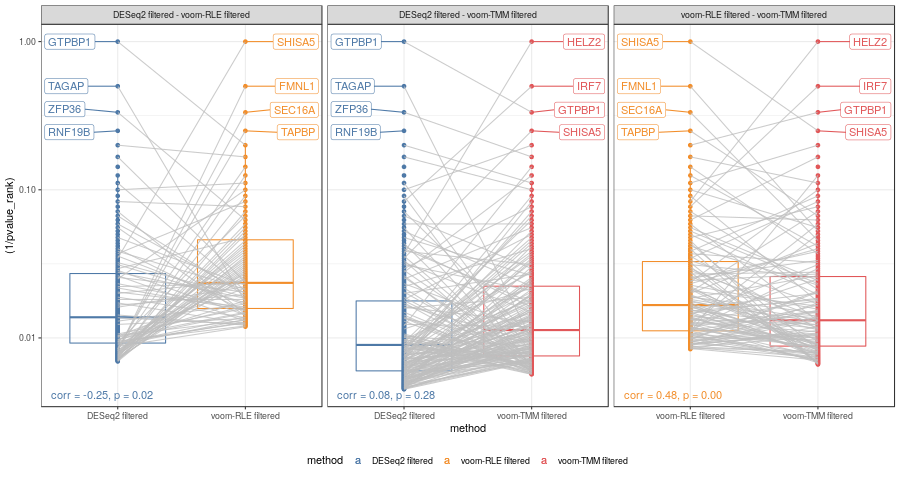

In [485]:
%%R -i filtered_comparisons -w 900

de_comparison_pairplot = function(comparisons, label_top_n=5) {
    # paired plot
    df = na.omit(comparisons[comparisons$pvalue_rank < label_top_n,])
    (
        ggplot(na.omit(comparisons), aes(x=method, y=(1/pvalue_rank), color=method))
        + facet_wrap('contrast', scales='free_x')
        + geom_boxplot(alpha=0.2)
        + geom_point()
        + scale_y_log10()
        + geom_line(aes(group=gene), color='grey', alpha=0.8)
        + ggrepel::geom_label_repel(data=df, aes(label=name), direction='y', nudge_x=df$side)
        + nice_theme
        + scale_color_manual(values=ggthemes::tableau_color_pal('Tableau 10')(3))
        + geom_text(aes(label=corr), x=-Inf, y=-Inf, vjust=-1, hjust=-0.1, check_overlap=T)
    )
}

de_comparison_pairplot(filtered_comparisons)

In [487]:
plain_comparisons = generate_comparison(
    ['deseq2_no_filter', 'voom_tmm_no_filter', 'voom_rle_no_filter'],
    threshold=0.1
)

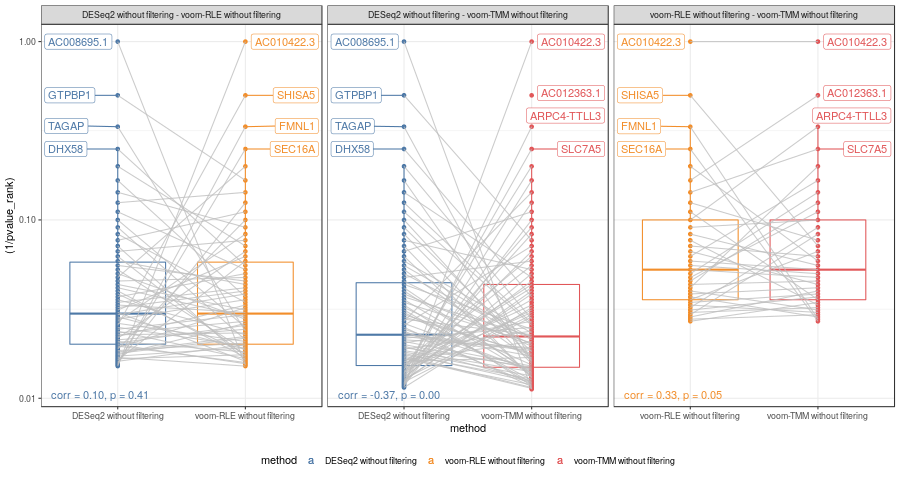

In [433]:
%%R -i plain_comparisons -w 900
de_comparison_pairplot(plain_comparisons)

In [435]:
deseq_comparison = generate_comparison(['deseq2_no_filter', 'deseq2_filtered', 'deseq2_Rachel'])

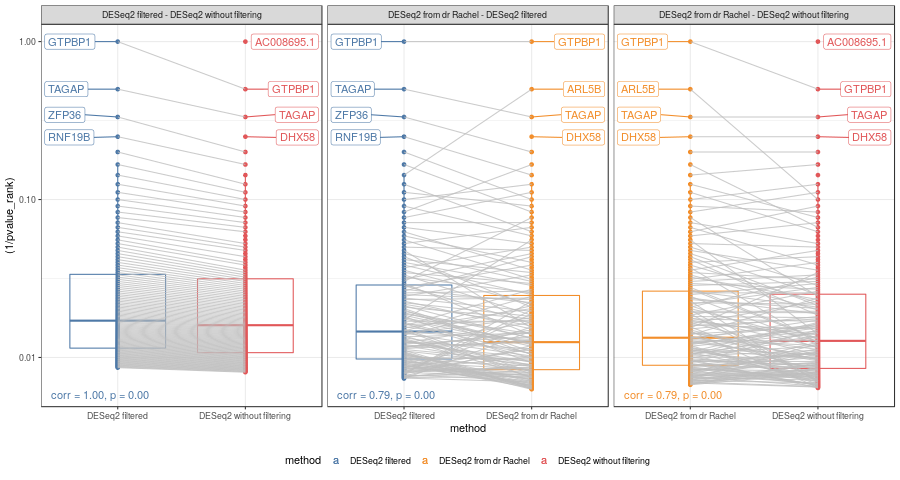

In [436]:
%%R -i deseq_comparison -w 900
de_comparison_pairplot(deseq_comparison)

Demonstration that the log-fold shrinkage is not related to the testing procedure in DESeq2:

In [1860]:
shrinkage_comparison = generate_comparison(['deseq2_shrinkage_apeglm', 'deseq2_shrinkage_ashr', 'deseq2_shrinkage_normal'])

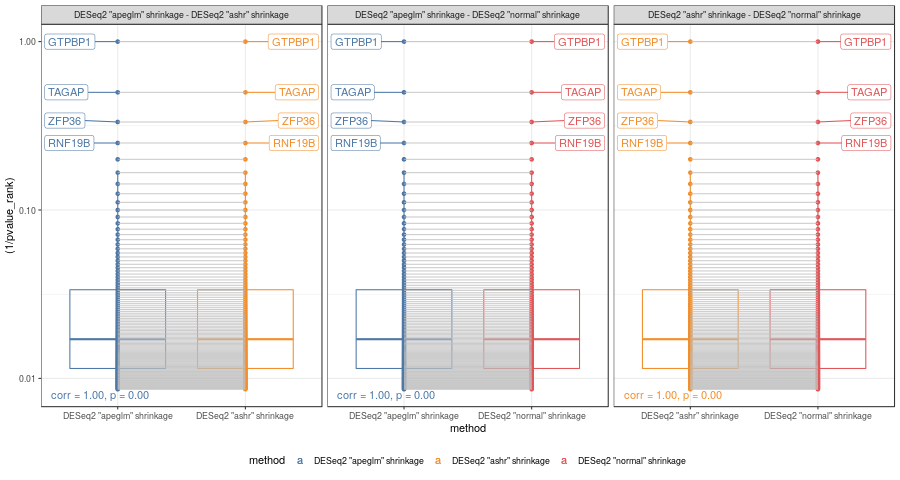

In [522]:
%%R -i shrinkage_comparison -w 900
de_comparison_pairplot(shrinkage_comparison)

In [790]:
voom_comparisons = generate_comparison(['voom_eee_filtered', 'voom_tmm_filtered', 'voom_rle_filtered'])

Note: EEE was adopted and actually means: TMM, voom, TMM!

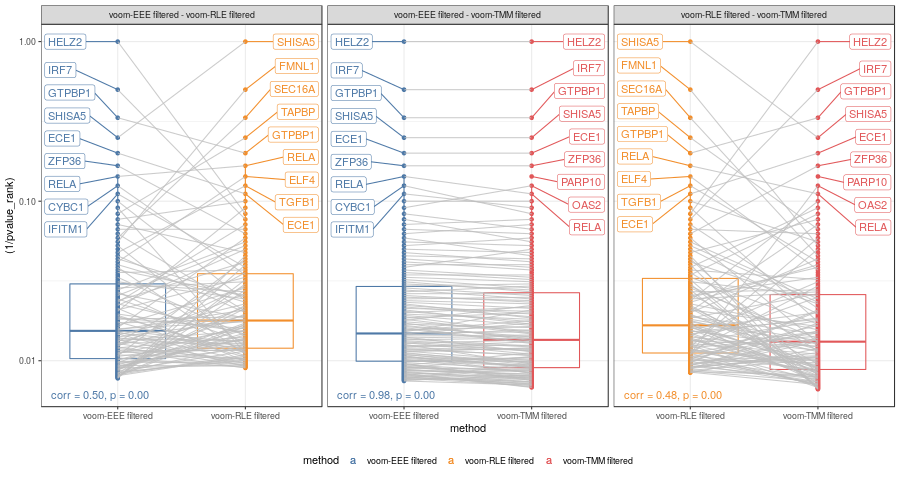

In [798]:
%%R -i voom_comparisons -w 900
de_comparison_pairplot(voom_comparisons, 10)

In [1862]:
qtotal_comparisons = generate_comparison(['voom_qtotal_filtered', 'voom_tmm_filtered', 'deseq2_filtered'])

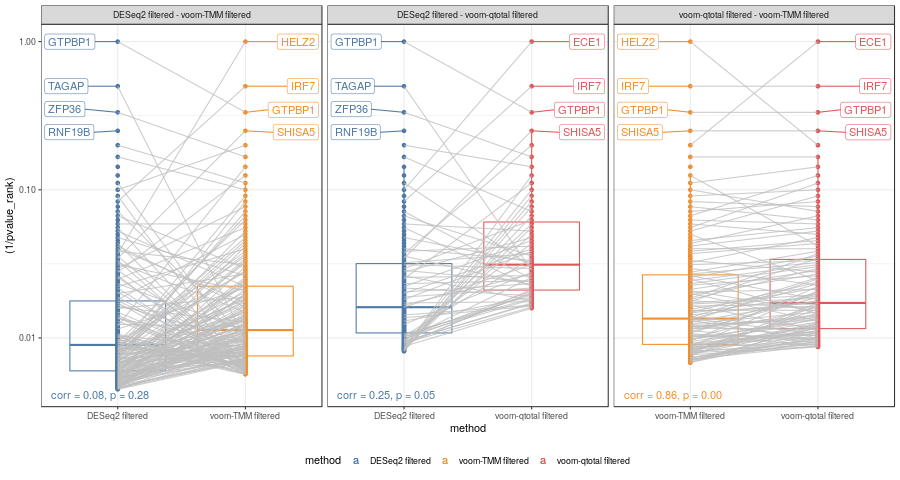

In [1864]:
%%R -i qtotal_comparisons -w 900
de_comparison_pairplot(qtotal_comparisons)

In [1344]:
qtotal_comparisons_no_filter = generate_comparison(['voom_qtotal_no_filter', 'voom_tmm_no_filter', 'deseq2_no_filter'])

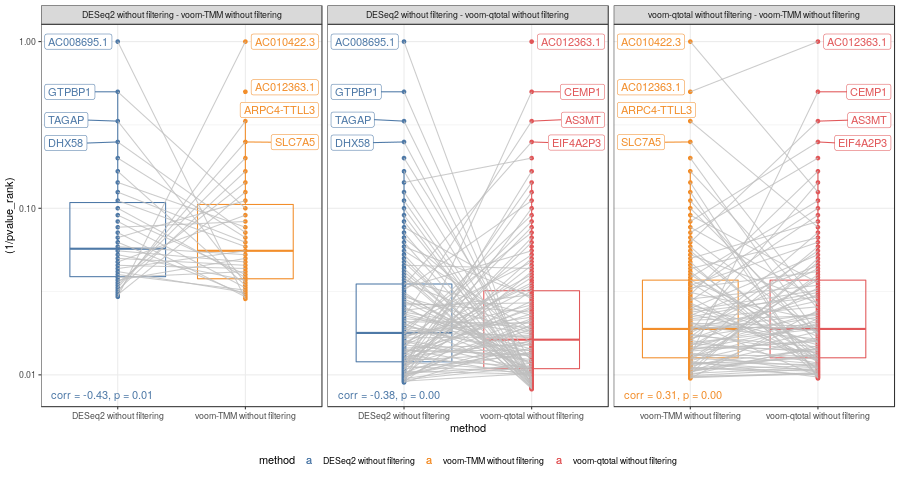

In [1346]:
%%R -i qtotal_comparisons_no_filter -w 900
de_comparison_pairplot(qtotal_comparisons_no_filter)

In [437]:
reproduction_comparison = generate_comparison(['deseq2_reproduction', 'deseq2_filtered', 'deseq2_Rachel'])

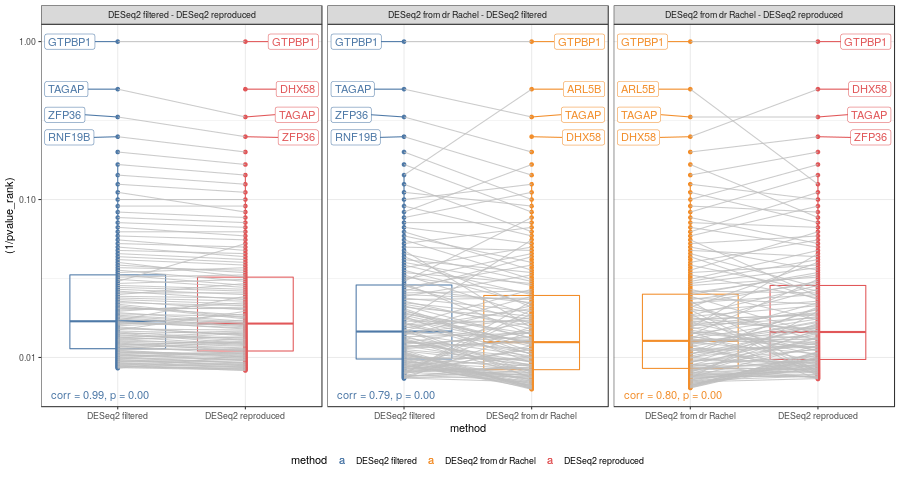

In [438]:
%%R -i reproduction_comparison -w 900
de_comparison_pairplot(reproduction_comparison)

In [441]:
from scipy.stats import pearsonr

In [442]:
ref = reference_definite_tbm_cm_deg
repro = deseq2_with_filtering_reproduction.loc[ref.index]
pearsonr(repro['log2FoldChange'], ref['log2FoldChange'])

(0.9884259288818367, 0.0)

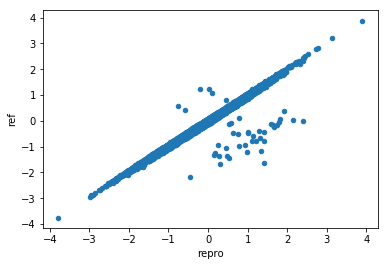

In [445]:
df = with_gene_data(DataFrame(dict(
    repro=repro['log2FoldChange'],
    ref=ref['log2FoldChange']
)), sort=False)
df.plot.scatter(x='repro', y='ref');

Interesting..

In [448]:
df['difference'] = abs(df.repro - df.ref)
df['p_ref'] = ref['padj']
df['p_repro'] = repro['padj']
df['voom'] = definite_tb_cm_limma_cmp_filtered['voom_tmm'].loc[ref.index].logFC

In [449]:
from scipy.stats import zscore

In [450]:
lfc_outliers = df[zscore(df.difference) > 2]
show_table(lfc_outliers.sort_values('difference'))

,repro,ref,gene_name,biotype,contig,strand,difference,p_ref,p_repro,voom
ENSG00000211892,0.450181,0.798702,IGHG4,IG_C_gene,14,-,0.348521,NaN,NaN,1.966573
ENSG00000132463,0.535183,-0.119796,GRSF1,protein_coding,4,-,0.654979,0.886299,0.433663,0.292903
ENSG00000188542,0.584919,-0.077051,DUSP28,protein_coding,2,+,0.661970,0.959831,NaN,0.169763
ENSG00000100307,0.782972,0.096994,CBX7,protein_coding,22,-,0.685978,0.947972,0.217790,0.445430
ENSG00000211938,0.108468,1.074797,IGHV3-7,IG_V_gene,14,-,0.966328,NaN,0.994394,2.127016
ENSG00000252010,-0.579511,0.415941,SCARNA5,scaRNA,2,+,0.995452,NaN,NaN,0.468971
ENSG00000211890,0.627704,-0.452663,IGHA2,IG_C_gene,14,-,1.080368,0.911712,0.828043,1.690657
ENSG00000170448,0.255641,-0.923274,NFXL1,protein_coding,4,-,1.178915,0.362769,0.949664,-0.325118
ENSG00000224650,0.028125,1.218261,IGHV3-74,IG_V_gene,14,-,1.190136,NaN,NaN,2.706474
ENSG00000119969,0.760992,-0.524589,HELLS,protein_coding,10,+,1.285581,0.453210,0.469943,-0.167385


Fortunately, none of the genes with flipping fold-changes were nominated as significant.

First guess: something related to shrinkage must have changed in DESeq2 in between the two analyzes.

Relevant posts:
 - https://support.bioconductor.org/p/100978/
 - https://support.bioconductor.org/p/75330/
 - https://support.bioconductor.org/p/85373/
 
Also:
 > Here we extend the discussion of shrinkage estimators. To repeat, the current default method in lfcShrink is normal, although it will likely change in the October 2018 release to apeglm, as this method has improved performance relative to the original DESeq2 estimator, as does ashr in some of our benchmarks. Below is a summary table of differences between methods available in lfcShrink via the type argument (and for further technical reference on use of arguments please see ?lfcShrink):

And more importantly:
 
> In version 1.16 (November 2016), the log2 fold change shrinkage is no longer default for the DESeq and nbinomWaldTest functions, by setting the defaults of these to betaPrior=FALSE, and by introducing a separate function lfcShrink, which performs log2 fold change shrinkage for visualization and ranking of genes. While for the majority of bulk RNA-seq experiments, the LFC shrinkage did not affect statistical testing, DESeq2 has become used as an inference engine by a wider community, and certain sequencing datasets show better performance with the testing separated from the use of the LFC prior. Also, the separation of LFC shrinkage to a separate function lfcShrink allows for easier methods development of alternative effect size estimators.

 (http://bioconductor.org/packages/devel/bioc/vignettes/DESeq2/inst/doc/DESeq2.html)

In [542]:
%%R -o ref_ashr -o ref_apeglm -o ref_normal
ref_ashr = get_deseq_definite_tb_cm(dds_reproduction, shrinkage='ashr')
ref_apeglm = get_deseq_definite_tb_cm(dds_reproduction, shrinkage='apeglm')
ref_normal = get_deseq_definite_tb_cm(dds_reproduction, shrinkage='normal')

found results columns, replacing these
using 'ashr' for LFC shrinkage. If used in published research, please cite:
    Stephens, M. (2016) False discovery rates: a new deal. Biostatistics, 18:2.
    https://doi.org/10.1093/biostatistics/kxw041
found results columns, replacing these
using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).
additional priors are available via the 'type' argument, see ?lfcShrink for details
found results columns, replacing these
using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895


In [604]:
shrinkage_comparison = with_gene_data(pd.concat([
        DataFrame(dict(
        with_shrinkage=result.loc[ref.index]['log2FoldChange'],
        without_shrinkage=repro['log2FoldChange'],
        padj=ref['padj'],
        baseMean=ref['baseMean']
    )).assign(shrinkage=name)
    for name, result in {
        'ashr': ref_ashr, 'apeglm': ref_apeglm, 'normal': ref_normal
    }.items()
]), sort=False, include=['gene_name'])

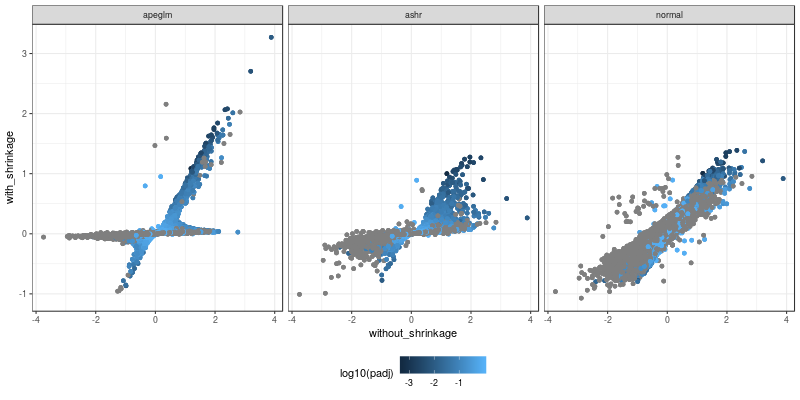

In [606]:
%%R -w 800 -h 400 -i shrinkage_comparison
(
    ggplot(shrinkage_comparison, aes(
        x=without_shrinkage,
        y=with_shrinkage,
        color=log10(padj)
    ))
    + geom_point()
    + facet_wrap('shrinkage')
    + nice_theme
)

It's not ashr shrinkage, for certain. Normal shrinkage looks similar, but the less than no shrinkage.

Also, how does it look like for voom?

In [608]:
definite_tb_cm_limma_cmp_filtered['voom_tmm'].loc[lfc_outliers.index].sort_values('P.Value')

,logFC,AveExpr,t,P.Value,adj.P.Val,B,unfiltered.adj.P.Val
ENSG00000237480,-1.638620,1.755167,-2.998031,0.003858,NaN,-1.973117,0.235724
ENSG00000224650,2.706474,1.622972,2.449491,0.018069,NaN,-3.128040,0.336297
ENSG00000272808,-0.995549,2.363321,-1.912143,0.060307,NaN,-4.039648,0.444227
ENSG00000211895,1.778796,8.572389,1.924475,0.060869,0.135193,-4.295185,0.444856
ENSG00000211890,1.690657,6.858361,1.893763,0.064931,0.139169,-4.311502,0.453051
...,...,...,...,...,...,...,...
ENSG00000174640,0.075457,1.883128,0.116628,0.907518,NaN,-5.391943,0.974959
ENSG00000146677,-0.054824,0.453407,-0.105383,0.916400,NaN,-5.358293,0.978201
ENSG00000102452,-0.033391,1.561763,-0.042161,0.966501,NaN,-5.373010,0.990691
ENSG00000185689,0.015903,1.053453,0.024704,0.980368,NaN,-5.405566,0.995042


No worrying significant hits either, so these could be some unstable cases...

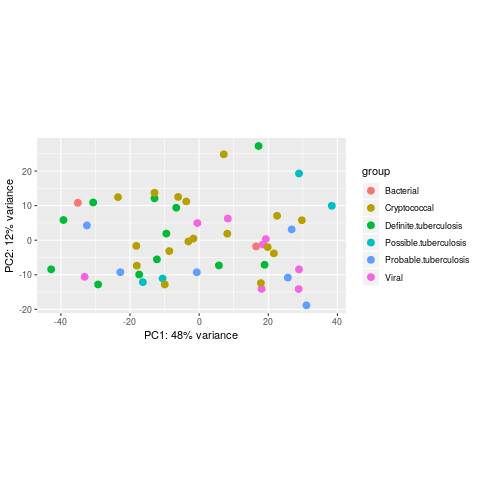

In [610]:
%%R
vsd <- vst(dds_edger_prefiltered, blind=FALSE)
plotPCA(vsd, intgroup='conditions_for_deseq')

The first few DE genes have good correspondence, but the remaining ones are quite shuffled.

### Finally, with weighted p-values:

In [1402]:
definite_tb_cm_limma_cmp_weighted = weight_degs(definite_tb_cm_cmp)

We get slightly smaller overlap with DESeq2 and slightly fewer DE genes, but gain some interesting hits for genes which are not as highly expressed:

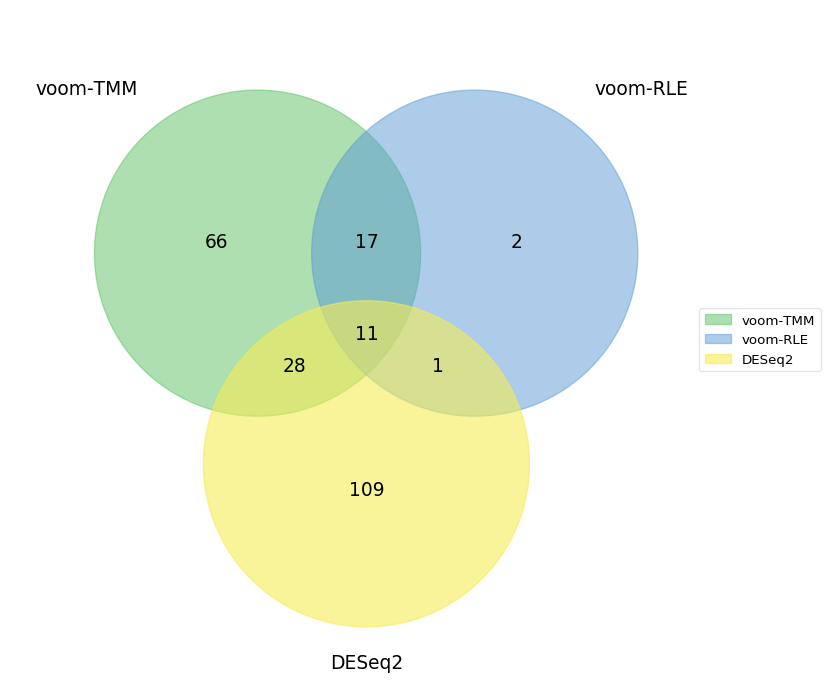

In [171]:
venn3({
    'voom-TMM': significant_ensembl(definite_tb_cm_limma_cmp_weighted['voom_tmm']),
    'voom-RLE': significant_ensembl(definite_tb_cm_limma_cmp_weighted['voom_rle']),
    'DESeq2': significant_deseq2
});

In [1804]:
p_values = {
    **{
        f'{method_id}_weighted': data[list(voom_cols)].rename(voom_cols, axis=1)
        for method_id, data in definite_tb_cm_limma_cmp_weighted.items()
    },
    **p_values
}

In [1805]:
weighted_comparisons = generate_comparison(['deseq2_weighted', 'voom_tmm_weighted', 'voom_rle_weighted'])

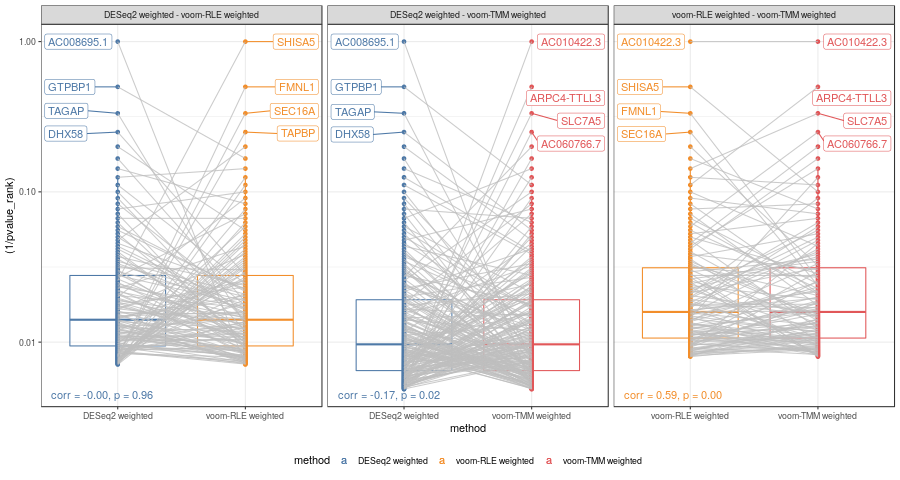

In [1806]:
%%R -i weighted_comparisons -w 900

de_comparison_pairplot(weighted_comparisons)

### An attempt to use IHW for gene sets analysis

In [1867]:
voom_de = definite_tb_cm_limma_cmp_weighted['voom_tmm']

In [173]:
%%R -o voom_de_gene_sets -i voom_de
voom_de_gene_sets = camera_with_statistic(voom_de, 't', reactome_new_symbol)

In [174]:
%%R -o voom_de_gene_sets_weighted
voom_de$weighted_stat <- voom_de$adj.P.Val * sign(voom_de$t)
voom_de_gene_sets_weighted = camera_with_statistic(voom_de, 'weighted_stat', reactome_new_symbol)

In [175]:
%%R -o voom_de_gene_sets_unweighted
voom_de$unweighted_stat <- voom_de$unweighted.adj.P.Val * sign(voom_de$t)
voom_de_gene_sets_unweighted = camera_with_statistic(voom_de, 'unweighted_stat', reactome_new_symbol)

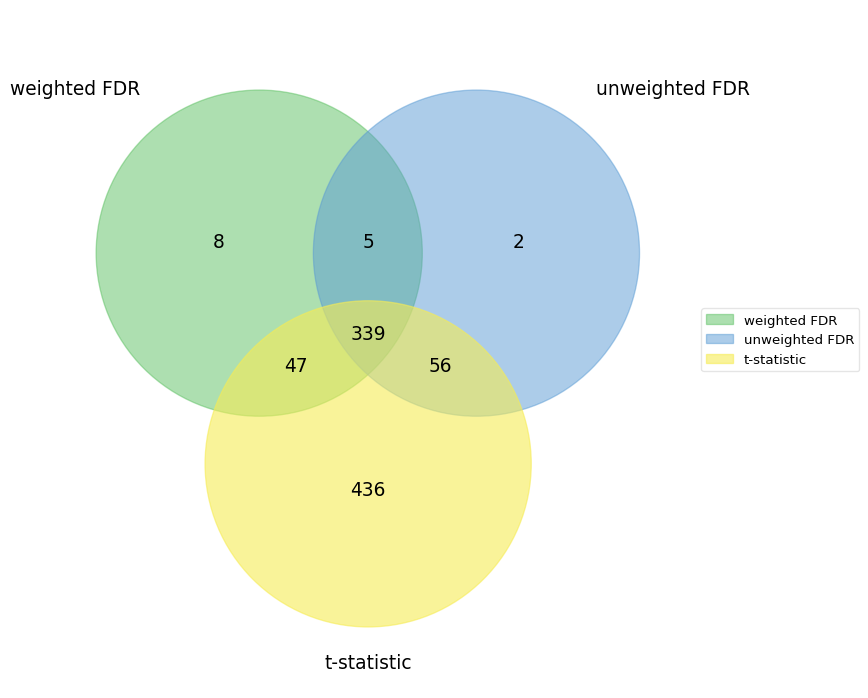

In [176]:
sig = lambda x: set(x[x.FDR < 0.05].index)
sets_comparison = {
    'weighted FDR': sig(voom_de_gene_sets_weighted),
    'unweighted FDR': sig(voom_de_gene_sets_unweighted),
    't-statistic': sig(voom_de_gene_sets)
}
venn3(sets_comparison);

In [177]:
sets_comparison['weighted FDR'] - sets_comparison['unweighted FDR'] - sets_comparison['t-statistic']

{'DNA strand elongation',
 'Defective B4GALT1 causes B4GALT1-CDG (CDG-2d)',
 'Lagging Strand Synthesis',
 'Neurotoxicity of clostridium toxins',
 'Purine salvage',
 'RNA Polymerase III Chain Elongation',
 'Regulation of gene expression in beta cells',
 'Telomere C-strand (Lagging Strand) Synthesis'}

In [178]:
sets_comparison['weighted FDR'] - sets_comparison['t-statistic']

{'Activation of ATR in response to replication stress',
 'DNA strand elongation',
 'Defective B4GALT1 causes B4GALT1-CDG (CDG-2d)',
 'Extension of Telomeres',
 'Formation of tubulin folding intermediates by CCT/TriC',
 'Lagging Strand Synthesis',
 'Lipid particle organization',
 'Molybdenum cofactor biosynthesis',
 'Neurotoxicity of clostridium toxins',
 'Purine salvage',
 'RNA Polymerase III Chain Elongation',
 'Regulation of gene expression in beta cells',
 'Telomere C-strand (Lagging Strand) Synthesis'}

In [179]:
comparison = concat([
    voom_de_gene_sets_unweighted.query('FDR < 0.05')[['FDR']].rank(method='first').assign(method='unweighted FDR'),
    voom_de_gene_sets.query('FDR < 0.05')[['FDR']].rank(method='first').assign(method='t-statistic')
]).rename_axis('pathway').reset_index()

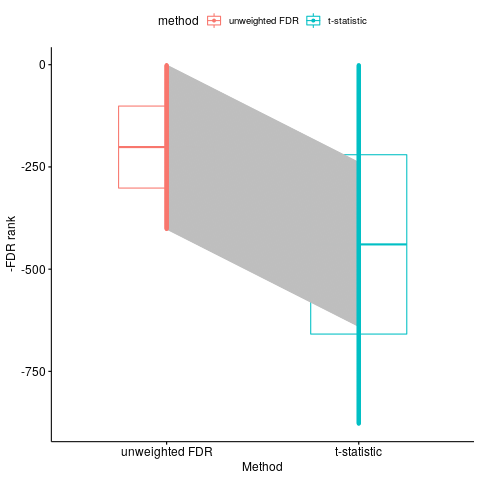

In [180]:
%%R -i comparison
(
    ggpubr::ggpaired(
        comparison, x='method', y='-FDR',
        color='method', line.color='gray',
        xlab='Method', ylab='-FDR rank'
    )
)

This is very bad. I got a better idea: apply `genefilter()` on mean pathway expression level!

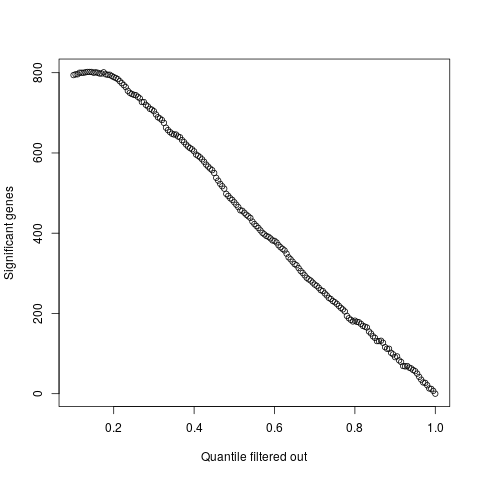

In [181]:
%%R
import::here(average_pathways_expression, .from='helpers/pathways.R')

voom_de_gene_sets$AveExpr = average_pathways_expression(
    tmm_normalized_tb_subsets, collection=reactome_new_symbol, id_type='symbol',
    pathways_subset=rownames(voom_de_gene_sets)
)

filter_by_mean_expression(voom_de_gene_sets, fdr_threshold=0.05, step=0.005, expression_col='AveExpr', pvalue_col='FDR', show_plot=T, use_deseq2_method=F)

It does increase power at $\theta \approx 0.1$ maybe?

In [182]:
voom_de_gene_sets

,NGenes,Direction,PValue,FDR
Neutrophil degranulation,460.0,Up,3.133880e-16,4.580447e-13
Interferon Signaling,198.0,Up,5.582507e-16,4.580447e-13
Interferon alpha/beta signaling,69.0,Up,1.287081e-15,7.040334e-13
CLEC7A (Dectin-1) signaling,98.0,Up,1.690526e-13,6.551377e-11
Interferon gamma signaling,91.0,Up,1.996154e-13,6.551377e-11
...,...,...,...,...
Cation-coupled Chloride cotransporters,7.0,Up,9.934585e-01,9.957691e-01
Heme biosynthesis,11.0,Down,9.939487e-01,9.957691e-01
Activation of PPARGC1A (PGC-1alpha) by phosphorylation,10.0,Down,9.984073e-01,9.990163e-01
Glycosaminoglycan metabolism,122.0,Down,9.984075e-01,9.990163e-01


In [183]:
%%R -o voom_de_gene_sets
voom_de_gene_sets$weighted_fdr = filter_by_mean_expression(voom_de_gene_sets, fdr_threshold=0.05, step=0.005, expression_col='AveExpr', pvalue_col='FDR', show_plot=F)

In [184]:
weighted_signif = voom_de_gene_sets[voom_de_gene_sets.weighted_fdr < 0.05]

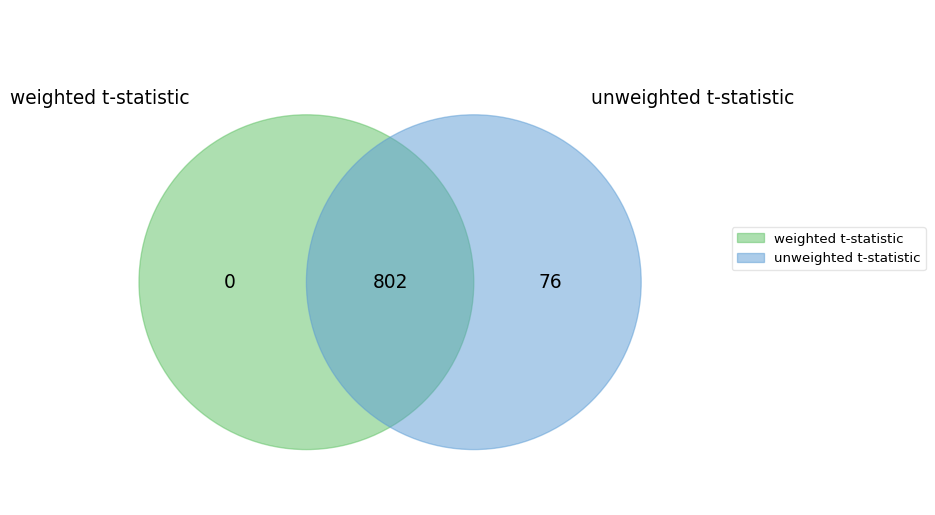

In [185]:
sets_comparison = {
    'weighted t-statistic': weighted_signif.index,
    'unweighted t-statistic': sig(voom_de_gene_sets)
}
venn2(sets_comparison);

In [186]:
voom_de_gene_sets.loc[
    sets_comparison['unweighted t-statistic'] - set(weighted_signif.index)
]

,NGenes,Direction,PValue,FDR,AveExpr,weighted_fdr
phosphorylation site mutants of CTNNB1 are not targeted to the proteasome by the destruction complex,15.0,Up,0.015944,0.031485,0.009469,0.054352
Misspliced GSK3beta mutants stabilize beta-catenin,15.0,Up,0.015944,0.031485,0.009469,0.054352
Attenuation phase,26.0,Up,0.021094,0.040533,0.010986,0.068148
Defective CHST6 causes MCDC1,8.0,Down,0.009355,0.019757,-0.004989,NaN
Conversion from APC/C:Cdc20 to APC/C:Cdh1 in late anaphase,19.0,Up,0.022995,0.043424,0.001144,0.071733
...,...,...,...,...,...,...
Signaling by ERBB4,45.0,Up,0.024027,0.045215,0.003193,0.074432
GAB1 signalosome,17.0,Up,0.015204,0.030426,0.010653,0.053171
"SMAC, XIAP-regulated apoptotic response",8.0,Up,0.022054,0.042131,0.005180,0.070417
EPHA-mediated growth cone collapse,15.0,Up,0.014279,0.028857,0.036132,0.050931


In [187]:
%%R -o x -i voom_de_gene_sets
samples = by_condition_and_tb_subset_no_outliers == 'Cryptococcal' | by_condition_and_tb_subset_no_outliers == 'Definite tuberculosis'


voom_de_gene_sets$AveExpr = average_pathways_expression(
    tmm_normalized_tb_subsets, collection=reactome_new_symbol, id_type='symbol',
    pathways_subset=rownames(voom_de_gene_sets),
    #patients_subset=samples
)

x = add_p_value_for_filtered_subset(voom_de_gene_sets, fdr_threshold=0.05, expression_col='AveExpr', pvalue_col='PValue')
#, step=0.005, show_plot=T, use_deseq2_method=F)

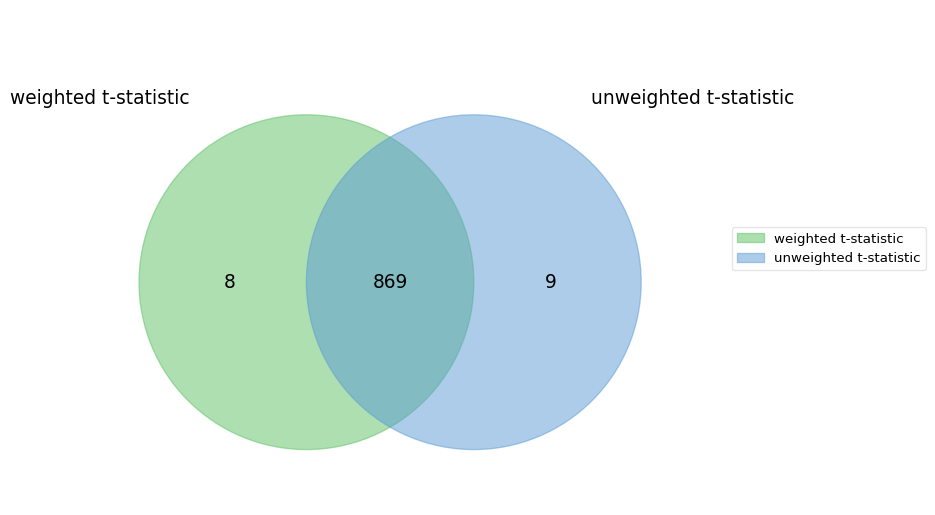

In [188]:
sets_comparison = {
    'weighted t-statistic': x[x['adj.P.Val'] < 0.05].index,
    'unweighted t-statistic': sig(voom_de_gene_sets)
}
venn2(sets_comparison);

In [189]:
x.loc[
    set(x[x['adj.P.Val'] < 0.05].index) - sig(voom_de_gene_sets)
]

,NGenes,Direction,PValue,FDR,AveExpr,weighted_fdr,adj.P.Val
Protein-protein interactions at synapses,88.0,Down,0.030257,0.055914,0.000448,0.090780,0.049818
Recycling of eIF2:GDP,8.0,Up,0.027410,0.051056,0.006685,0.083370,0.045391
NRAGE signals death through JNK,59.0,Up,0.027683,0.051505,0.002952,0.084007,0.045789
Extension of Telomeres,30.0,Up,0.026823,0.050075,-0.000775,NaN,0.044519
SHC1 events in EGFR signaling,14.0,Up,0.029034,0.053959,0.003010,0.087908,0.047970
Synthesis of PIPs at the Golgi membrane,17.0,Up,0.029514,0.054726,0.005603,0.089055,0.048706
Factors involved in megakaryocyte development and platelet production,136.0,Up,0.030148,0.055776,0.000875,0.090660,0.049696
Rap1 signalling,16.0,Up,0.027340,0.050983,0.017096,0.083347,0.045327


### Comparing overlap of different gene set collections

In [1869]:
%%R -o sets_reactome_symbols -i voom_de -o sets_reactome_entrez -o sets_kegg_entrez
sets_reactome_symbols = camera_with_statistic(voom_de, 't', reactome_new_symbol, convert_to='symbol')
sets_reactome_entrez = camera_with_statistic(voom_de, 't', c2.cp.reactome, convert_to='entrez')
sets_kegg_entrez = camera_with_statistic(voom_de, 't', c2.cp.kegg, convert_to='entrez')

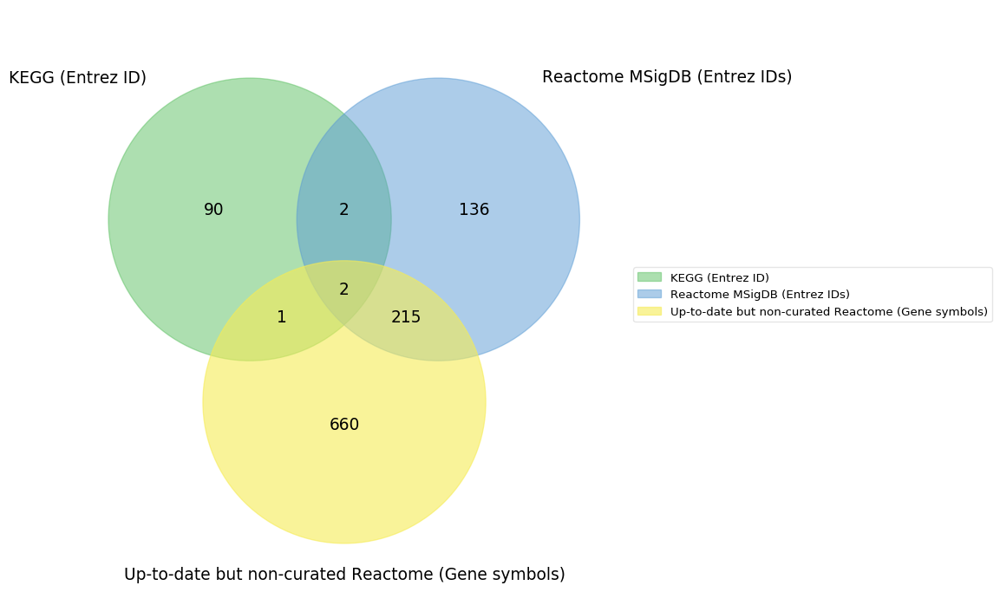

In [191]:
sig = lambda x: set(x[x.FDR < 0.05].index.str.lower())
sets_comparison = {
    'KEGG (Entrez ID)': sig(sets_kegg_entrez),
    'Reactome MSigDB (Entrez IDs)': sig(sets_reactome_entrez),
    'Up-to-date but non-curated Reactome (Gene symbols)': sig(sets_reactome_symbols)
}
venn3(sets_comparison);

### A heatmap demonstaration & test

In [1394]:
%R import::here(gene_set_heatmap, .from='plots/differential_expression.R')

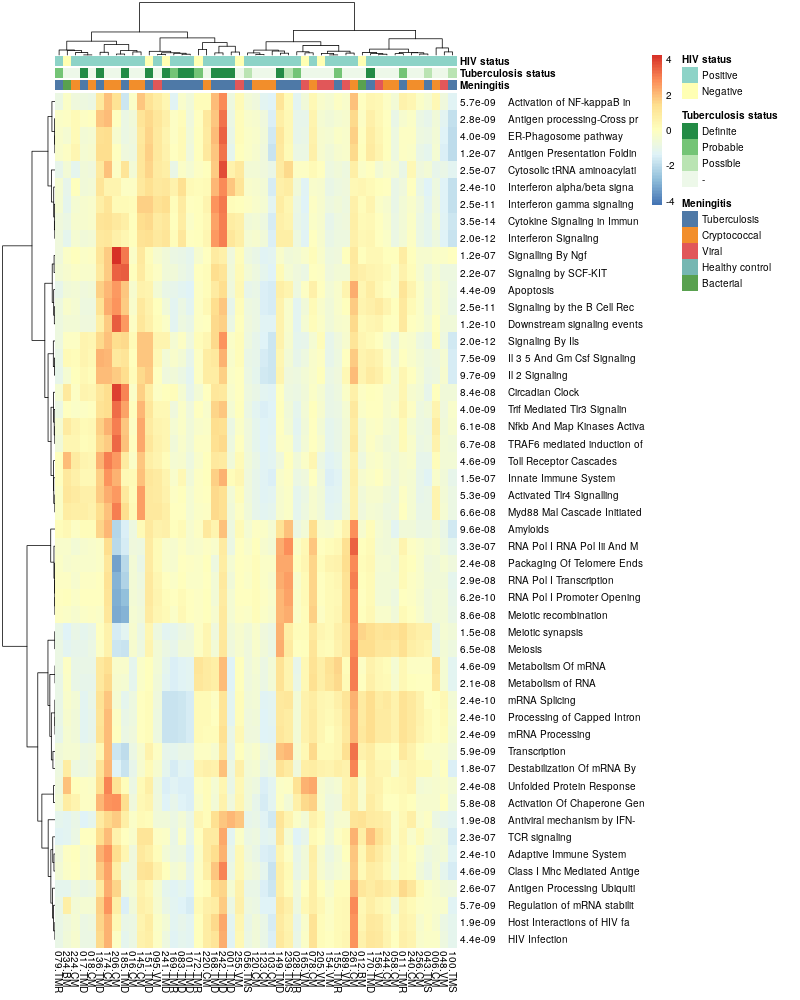

In [193]:
%%R -w 800 -h 1000
gene_set_heatmap(
    head(sets_reactome_entrez, 50), tmm_normalized_tb_subsets,
    collection=c2.cp.reactome, id_type='entrez'
)

Note: changing dynamics of the meiosis/apoptosis cannot be observed in the study which looks at the participants in a single time-point...

But maybe I could look at the participants survival, and some proxy for disease stage and it's relation to the general meiosis/apoptosis balance... TODO?

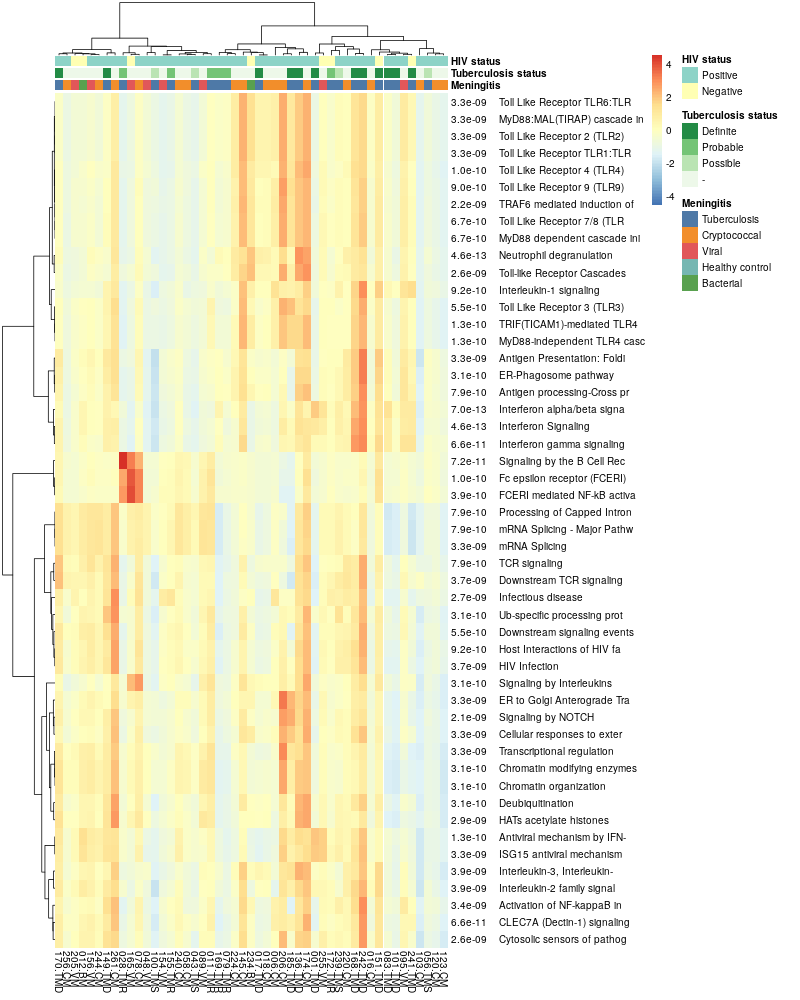

In [194]:
%%R -w 800 -h 1000
gene_set_heatmap(
    head(sets_reactome_symbols, 50), tmm_normalized_tb_subsets,
    collection=reactome_new_symbol, id_type='symbol'
)

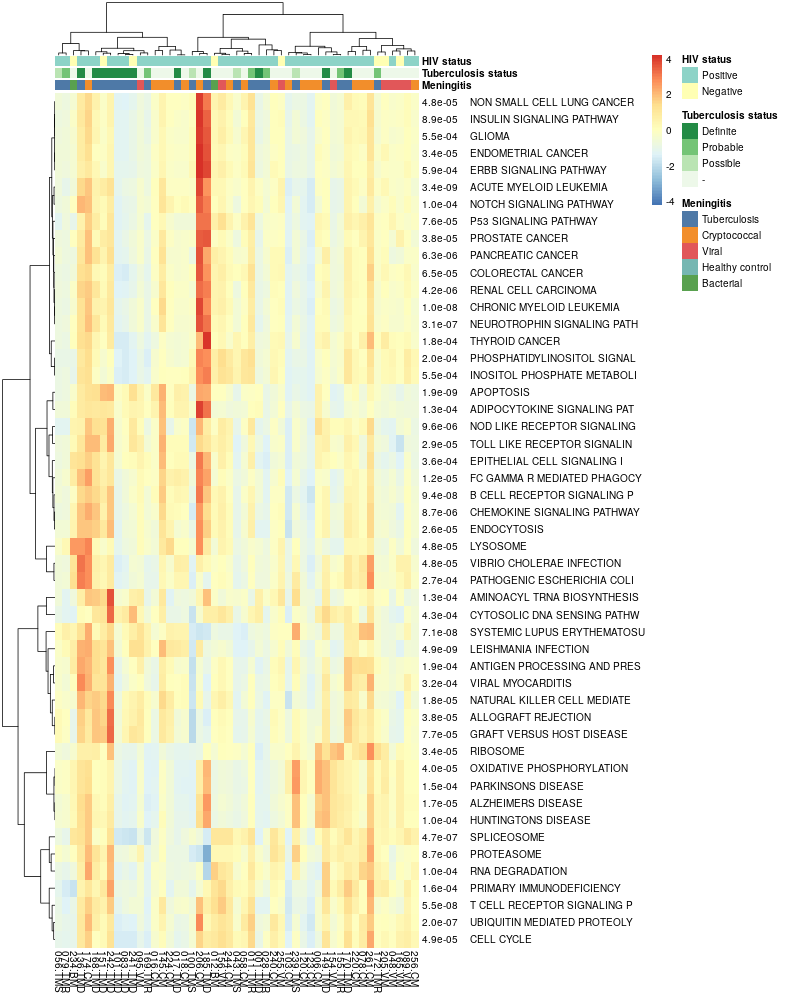

In [195]:
%%R -w 800 -h 1000
gene_set_heatmap(
    head(sets_kegg_entrez, 50), tmm_normalized_tb_subsets,
    collection=c2.cp.kegg, id_type='entrez'
)

It could be tempting to say that KEGG gives the best clustering, but it is wrong:
 - KEGG collection has a small selection of hand-picked pathways; on the plot above I captured more than half (50/94) of significant pathways, but for Reactome I capture only 50/400.
 - we would be testing more hypotheses than needed if we looked at the patients clustering... unless we look at clustering of other groups ;)

Using comparable significance cutoff and k-means sub clustering for Reactome pathways gives us:

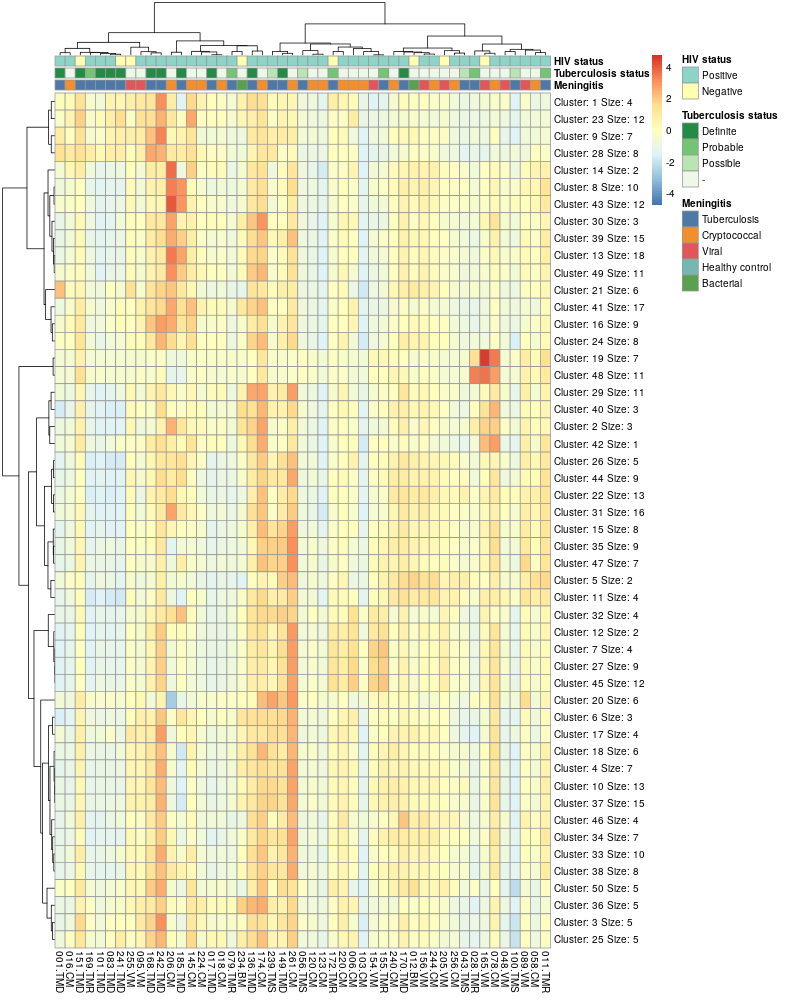

In [196]:
%%R -w 800 -h 1000
gene_set_heatmap(
    sets_reactome_symbols[sets_reactome_symbols$FDR < 1e-04,], tmm_normalized_tb_subsets,
    collection=reactome_new_symbol, id_type='symbol',
    kmeans_k=50, trim=100
)

In [197]:
%%R -w 800 -h 1000
# this is very similar, hidden for brevity
#gene_set_heatmap(
#    sets_reactome_entrez[sets_reactome_entrez$FDR < 1e-04,], tmm_normalized_tb_subsets,
#    collection=c2.cp.reactome, id_type='entrez',
#    kmeans_k=50, trim=100
#)

NULL


### Including topology for pathways analysis

Goals / ideal algorithm:
1. take all significant pathways
2. perform hierarchical clustering
3. choose optimal number of clusters
4. for each cluster:
  - validate that all the pathways have the same direction
  - highlight pathways with the lowest p-value
  - maybe pathways with the highest average expression
  - try to build a pathways hierarchy using the genes information
    E.g. Signaling > Interferon Signaling > **Interferon Gamma Signaling**

In [1880]:
%%R
import::here(counts_to_pathways_space, .from='helpers/pathways.R')
import::here(names_for_pathway_clusters, collapse_count_clusters, .from='helpers/pathways.R')

In [198]:
%%R
pathways_counts = counts_to_pathways_space(tmm_normalized_tb_subsets, collection=c2.cp.reactome, id_type='entrez')

In [199]:
%%R
significant_pathways = sets_reactome_entrez[sets_reactome_entrez$FDR < 0.05,]
significant_counts = pathways_counts[rownames(significant_pathways),]
significant_counts = log2(significant_counts + 0.25)

Creating a temporary cluster...done:
socket cluster with 7 nodes on host ‘localhost’
Multiscale bootstrap... Done.


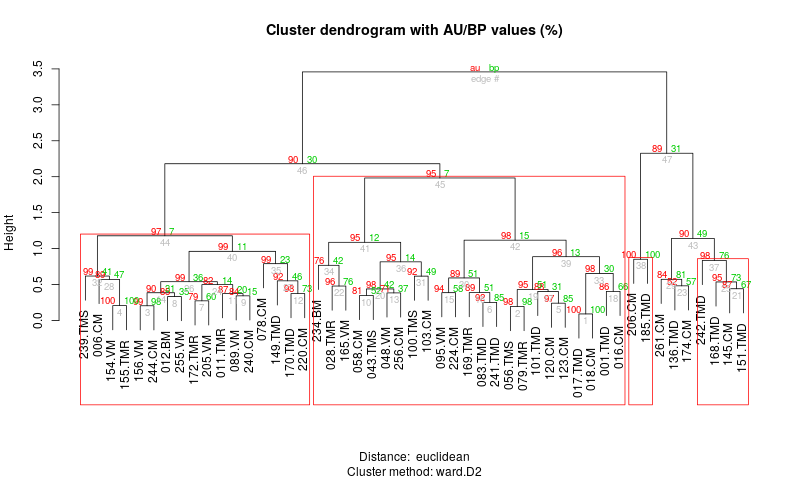

In [200]:
%%R -w 800
set.seed(0)

bootstrapped_clustering <- pvclust::pvclust(
    significant_counts, parallel=T,
    method.hclust="ward.D2", method.dist="euclidean"
)
plot(bootstrapped_clustering)
pvclust::pvrect(bootstrapped_clustering, alpha=0.95)

In [201]:
%%R -w 3000 -h 1200
set.seed(0)
bootstrapped_clustering <- pvclust::pvclust(
    t(significant_counts), parallel=T,
    method.hclust="average", method.dist="correlation",
    nboot=100
)

Creating a temporary cluster...done:
socket cluster with 7 nodes on host ‘localhost’
Multiscale bootstrap... Done.


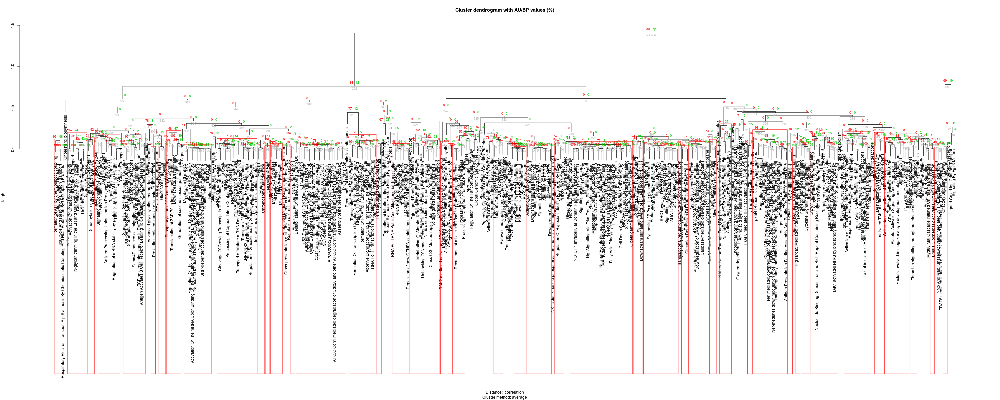

In [202]:
%%R -w 3000 -h 1200
plot(bootstrapped_clustering)
pvclust::pvrect(bootstrapped_clustering, alpha=0.90)

In [203]:
%%R
highly_probable_clusters <- pvclust::pvpick(bootstrapped_clustering, alpha=0.9)

In [204]:
%%R
length(highly_probable_clusters$clusters)

[1] 46


In [205]:
%%R
tb_clusters = Filter(function(pathways) {
    any('Latent infection of Homo sapiens with Mycobacterium tuberculosis' %in% pathways)
}, highly_probable_clusters$clusters)
tb_clusters

[[1]]
 [1] "Membrane Trafficking"                                            
 [2] "trans-Golgi Network Vesicle Budding"                             
 [3] "Signal Regulatory Protein Sirp Family Interactions"              
 [4] "Golgi Associated Vesicle Biogenesis"                             
 [5] "Latent infection of Homo sapiens with Mycobacterium tuberculosis"
 [6] "Activation of IRF3/IRF7 mediated by TBK1/IKK epsilon"            
 [7] "Transferrin endocytosis and recycling"                           
 [8] "Insulin receptor recycling"                                      
 [9] "Traf6 Mediated Induction Of Tak1 Complex"                        
[10] "Iron uptake and transport"                                       
[11] "Response To Elevated Platelet Cytosolic Ca2 "                    



In [206]:
%%R
head(sets_reactome_entrez)

                                                     NGenes Direction
Cytokine Signaling in Immune system                     253        Up
Interferon Signaling                                    146        Up
Signaling By Ils                                        103        Up
Interferon gamma signaling                               58        Up
Signaling by the B Cell Receptor (BCR)                  118        Up
Downstream signaling events of B Cell Receptor (BCR)     90        Up
                                                           PValue          FDR
Cytokine Signaling in Immune system                  5.289373e-17 3.549169e-14
Interferon Signaling                                 6.908348e-15 2.028852e-12
Signaling By Ils                                     9.070874e-15 2.028852e-12
Interferon gamma signaling                           1.612464e-13 2.508075e-11
Signaling by the B Cell Receptor (BCR)               1.868908e-13 2.508075e-11
Downstream signaling events of B Cel

In [207]:
%%R
cluster_names = names_for_pathway_clusters(highly_probable_clusters$clusters, pathways_data=c2.cp.reactome, pathways_ranking=sets_reactome_entrez)
counts_collapsed = collapse_count_clusters(significant_counts, clusters=highly_probable_clusters$clusters, names=cluster_names)

[1] "Warning: parent node PI3K events in ERBB2 signaling will not be displayed"
[1] "[GAB1 signalosome | PI3K/AKT activation | PI3K events in ERBB4 signaling]"
[2] "PIP3 activates AKT signaling"                                             
[1] "Warning: parent node Signalling By Ngf will not be displayed"                   
[2] "Warning: parent node Map Kinase Activation In Tlr Cascade will not be displayed"
[[1]]
[1] "[Ngf Signalling Via Trka From The Plasma Membrane | MAPK targets/ Nuclear events mediated by MAP kinases]"

[[2]]
[1] "Nuclear Events (kinase and transcription factor activation)"

[[3]]
[1] "ERK/MAPK targets"

[1] "Warning: parent node Signalling By Ngf will not be displayed"
[1] "[Map Kinase Activation In Tlr Cascade | Ngf Signalling Via Trka From The Plasma Membrane]"
[2] "Nuclear Events (kinase and transcription factor activation)"                              
[1] "Warning: parent node Signalling to ERKs will not be displayed"             
[2] "Warning: parent node 

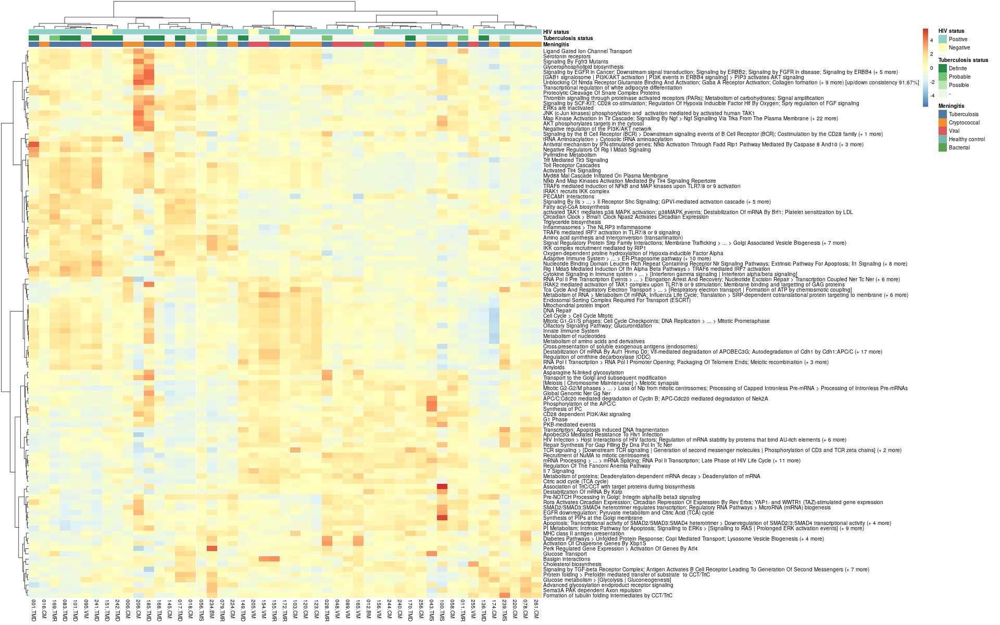

In [208]:
%%R -w 1920 -h 1200
pheatmap(
    scale(counts_collapsed),
    show_colnames=T,
    show_rownames=T,
    annotation_col=counts_patient_annotations,
    annotation_colors=patient_colors,
    clustering_method='ward.D2',
    clustering_distance_cols='correlation',
    cluster_rows=T,
    cluster_cols=T,
    scale='row',
    clustering_distance_rows='correlation'
)

- TODO: place that into the function as debugg/verbose:!!!!!
- TODO: make a heatmap with results for both proteomics and transcriptomics data

### Some heatmaps for DESeq2 and Voom: with & without filtering

In [1420]:
voom_weighted_tmm = definite_tb_cm_limma_cmp_weighted['voom_tmm']
voom_simple_tmm = definite_tb_cm_cmp['voom_tmm']

voom_weighted_rle = definite_tb_cm_limma_cmp_weighted['voom_rle']
voom_simple_rle = definite_tb_cm_cmp['voom_rle']

voom_weighted_eee = definite_tb_cm_limma_cmp_weighted['voom_eee']
voom_simple_eee = definite_tb_cm_cmp['voom_eee']
voom_filtered_eee = definite_tb_cm_limma_cmp_filtered['voom_eee']

voom_simple_qtotal = definite_tb_cm_cmp['voom_qtotal']
voom_weighted_qtotal = definite_tb_cm_limma_cmp_weighted['voom_qtotal']
voom_filtered_qtotal = definite_tb_cm_limma_cmp_filtered['voom_qtotal']

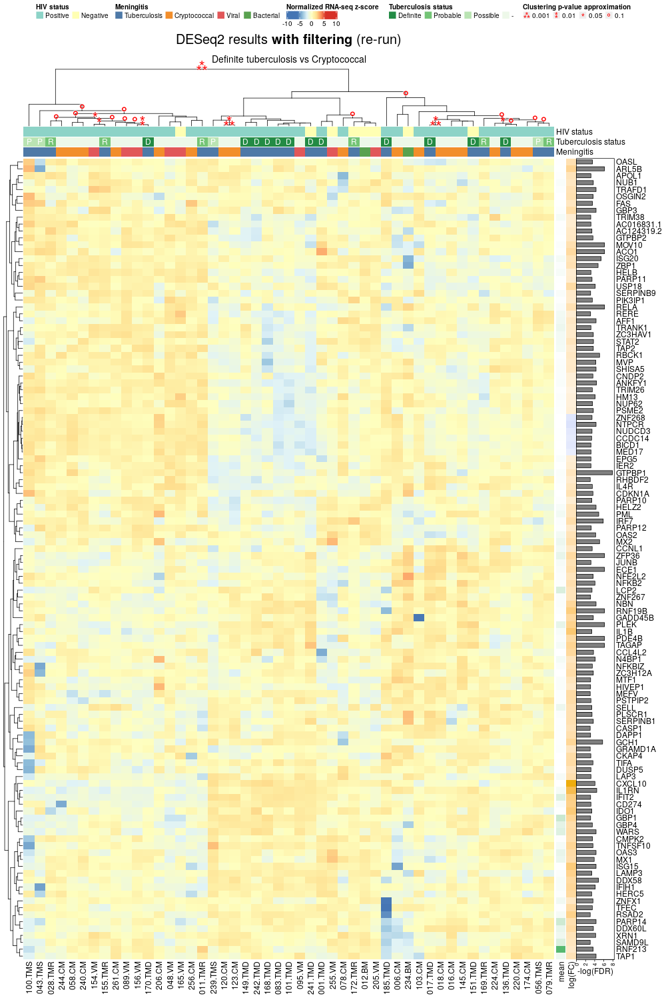

In [1827]:
%%R -w 1000 -h 1500
de_heatmap(
    significant.deseq(deseq2_with_filtering), dds_edger_prefiltered,
    major='DESeq2 results \\textbf{with filtering} (re-run)',
    minor='Definite tuberculosis vs Cryptococcal'
)

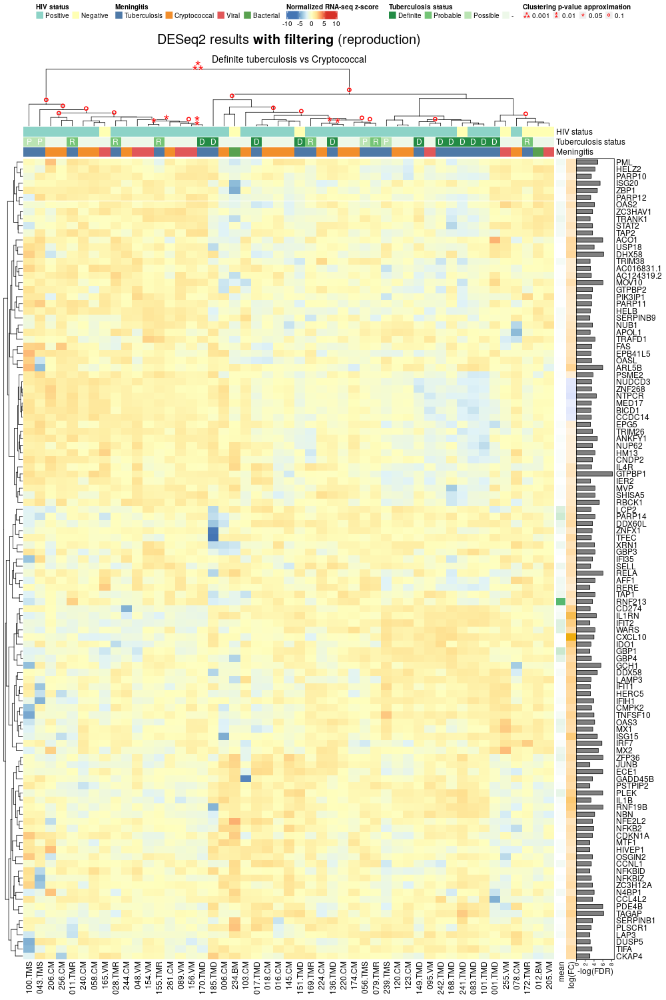

In [1829]:
%%R -w 1000 -h 1500
de_heatmap(
    significant.deseq(deseq2_with_filtering_reproduction), dds_reproduction,
    major='DESeq2 results \\textbf{with filtering} (reproduction)',
    minor='Definite tuberculosis vs Cryptococcal'
)

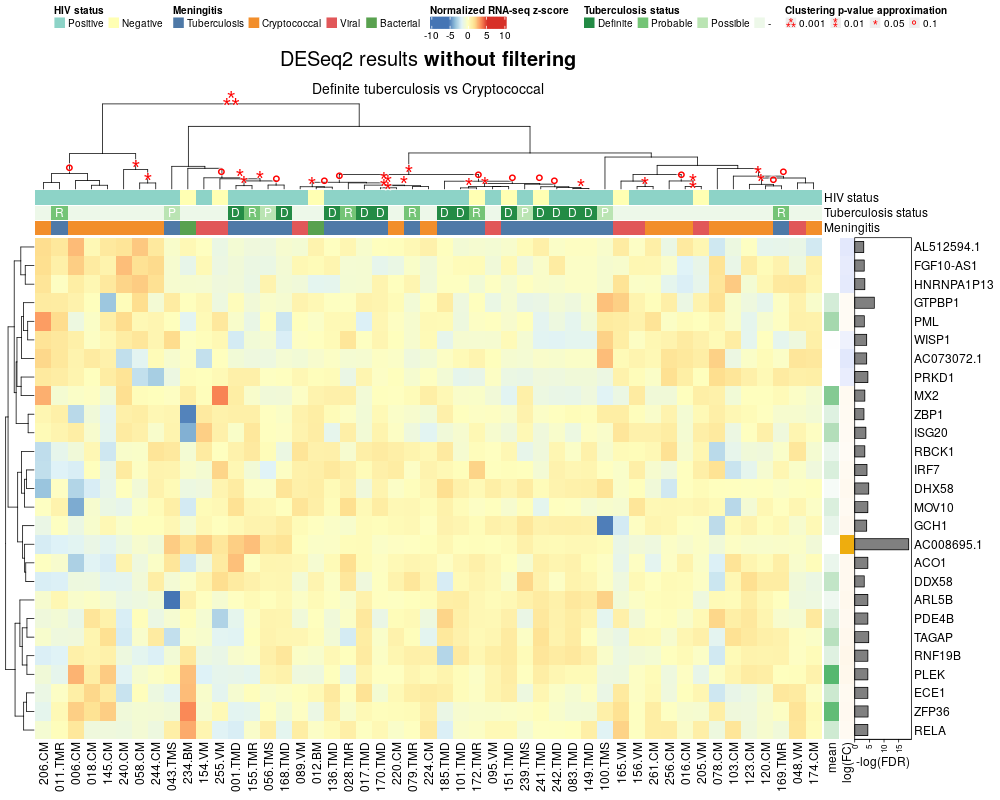

In [1831]:
%%R -w 1000 -h 800
de_heatmap(
    significant.deseq(deseq2_without_filtering), dds_edger_prefiltered,
    major='DESeq2 results \\textbf{without filtering}',
    minor='Definite tuberculosis vs Cryptococcal'
)

AC008695.1 has a very consistent signal (very high logFC).

It is uncharacterized, but similar to RAPGEF6, which may play a role in cell-cell junctions formation:
https://www.sciencedirect.com/science/article/pii/S0898656808001459, Also something about Rap1 isoforms signaling.

How does it compare to voom results?

In [1869]:
with_gene_data(voom_simple_rle).query("gene_name in ['RAPGEF6', 'AC008695.1']")

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000158987,-0.119254,7.123293,-0.800150,0.426852,0.913804,-5.916807,RAPGEF6,protein_coding,5,-
ENSG00000273217,0.555357,-1.560686,0.483387,0.630851,0.950252,-4.950990,AC008695.1,protein_coding,5,-


In [1855]:
with_gene_data(voom_simple_tmm).query("gene_name in ['RAPGEF6', 'AC008695.1']")

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000158987,0.231149,7.123293,0.846757,0.400265,0.776569,-5.755939,RAPGEF6,protein_coding,5,-
ENSG00000273217,0.827811,-1.560686,0.746082,0.459374,0.807697,-5.164359,AC008695.1,protein_coding,5,-


In [1859]:
with_gene_data(deseq2_without_filtering, sort=F).query("gene_name in ['RAPGEF6', 'AC008695.1']")

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_name,biotype,contig,strand
ENSG00000158987,466.048853,-0.080817,0.177202,-0.456071,6.483391e-01,9.999882e-01,RAPGEF6,protein_coding,5,-
ENSG00000273217,14.612156,23.771445,3.261043,7.289521,3.110580e-13,9.956968e-09,AC008695.1,protein_coding,5,-


In [612]:
with_gene_data(deseq2_with_filtering_normal, sort=F).query("gene_name in ['RAPGEF6', 'AC008695.1']")

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_name,biotype,contig,strand
ENSG00000158987,466.048853,-0.080826,0.161301,-0.456070,6.483395e-01,0.94354,RAPGEF6,protein_coding,5,-
ENSG00000273217,14.612156,0.052721,0.136964,6.489305,8.623321e-11,NaN,AC008695.1,protein_coding,5,-


In [614]:
with_gene_data(deseq2_with_filtering_apeglm, sort=F).query("gene_name in ['RAPGEF6', 'AC008695.1']")

,baseMean,log2FoldChange,lfcSE,pvalue,padj,gene_name,biotype,contig,strand
ENSG00000158987,466.048853,-0.025979,0.096964,6.483395e-01,0.94354,RAPGEF6,protein_coding,5,-
ENSG00000273217,14.612156,0.004110,0.111370,8.623321e-11,NaN,AC008695.1,protein_coding,5,-


In [616]:
with_gene_data(deseq2_with_filtering_ashr, sort=F).query("gene_name in ['RAPGEF6', 'AC008695.1']")

,baseMean,log2FoldChange,lfcSE,pvalue,padj,gene_name,biotype,contig,strand
ENSG00000158987,466.048853,-0.011679,0.069350,6.483395e-01,0.94354,RAPGEF6,protein_coding,5,-
ENSG00000273217,14.612156,20.654679,3.235659,8.623321e-11,NaN,AC008695.1,protein_coding,5,-


Here we go, after shrinkage (except for ashr) it does look so great (NaN in padj is unrelated, the variables were just reused from filtered dds).

**Therefore, downstream analysis after DESEq2 should always check if the logFC remains high after shrinkage**.

Interestingly, the shrunken log-fold changes are now comparable between voom and deseq for the normal shrinkage.

[1] "Too few observations to assess the clustering p-values"


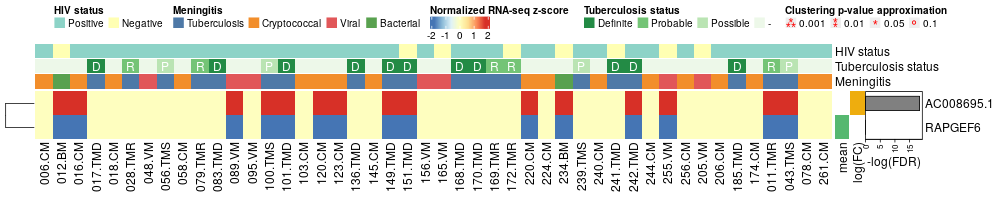

In [1965]:
%%R -w 1000 -h 200
de_heatmap(
    deseq2_without_filtering[c('ENSG00000158987', 'ENSG00000273217'),], dds_edger_prefiltered,
    skip_cols=c('175.TMD', '074.TMS', '093.TMD', '128.TMD', '158.TMD', '167.TMR', '233.CM', '001.TMD', '155.TMR', '154.VM')
)

Maybe there is something with the transcript mapping?

In [1930]:
%%R -o dds_counts
dds_counts = as.data.frame(counts(dds_edger_prefiltered, normalized=T))

In [1910]:
show_table(
    raw_counts_matrix.loc[['ENSG00000158987', 'ENSG00000273217']].T
    .query("ENSG00000158987 != 0 or ENSG00000273217 != 0")
)

,ENSG00000158987,ENSG00000273217
001.TMD,21.33,21.67
006.CM,169.00,0.00
012.BM,795.00,0.00
016.CM,213.00,0.00
017.TMD,620.00,0.00
018.CM,396.00,0.00
028.TMR,576.00,0.00
048.VM,2508.00,0.00
056.TMS,1096.02,25.22
058.CM,168.00,0.00


So we got a case of log fold change for a pair where one group has sum of counts = 0

In [1936]:
dds_counts.loc['ENSG00000273217', dds_counts.index.str.endswith('CM')].sum()

0.0

Apparently, DESeq does not handle such cases explicitly if one group in contrast has zeros only. See: https://support.bioconductor.org/p/111231/

**TODO: add a criterion to select only those which have SHRUNKEN abs(log2(FC)) > 1 for DESEq2**.

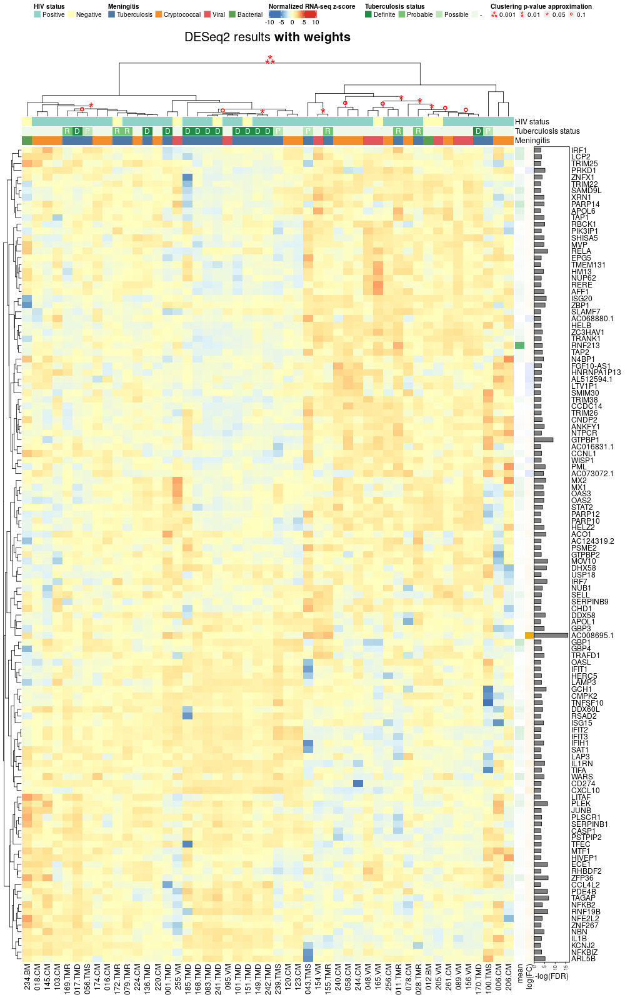

In [1940]:
%%R -w 1000 -h 1600
de_heatmap(
    significant.deseq(deseq2_with_weighting), dds_edger_prefiltered,
    major='DESeq2 results \\textbf{with weights}}',
    minor='Definite tuberculosis vs Cryptococcal'
)

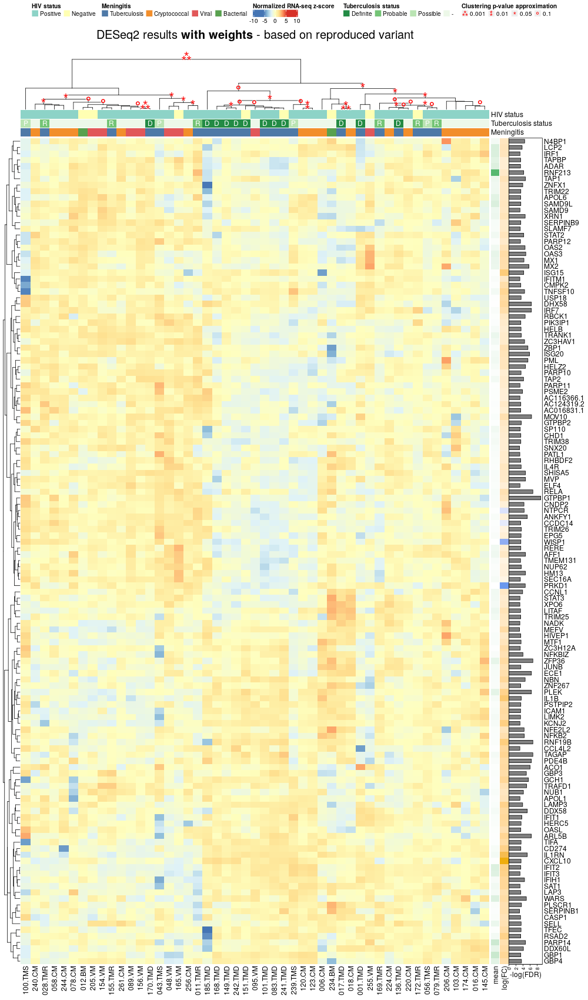

In [1961]:
%%R -w 1000 -h 1700
de_heatmap(
    significant.deseq(deseq2_with_weighting_reproduction), dds_reproduction,
    major='DESeq2 results \\textbf{with weights} - based on reproduced variant}',
    minor='Definite tuberculosis vs Cryptococcal'
)

In [1958]:
with_gene_data(voom_simple_tmm).query("gene_name in ['WISP1', 'AC012363.1', 'RNF213']")

,logFC,AveExpr,t,P.Value,adj.P.Val,B,gene_name,biotype,contig,strand
ENSG00000224789,3.561383,-1.218302,6.021654,9.125444e-08,0.001575,5.470512,AC012363.1,antisense,2,-
ENSG00000173821,1.142558,11.728214,3.682157,4.750803e-04,0.161419,-0.244006,RNF213,protein_coding,17,+
ENSG00000104415,-1.760435,1.713906,-3.645468,5.348101e-04,0.162976,-0.366549,WISP1,protein_coding,8,+


Individual genes do not agree between methods too much, and if they do I doubt because those are lowly expressed. The heatmap looks nice, but could I get such a nice heatmap from random data?

[1] "Too few observations to assess the clustering p-values"


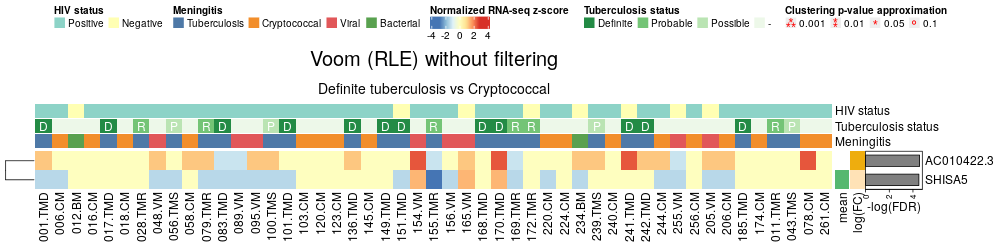

In [467]:
%%R -w 1000 -h 250 -i voom_simple_rle

de_heatmap(
    significant.limma(voom_simple_rle), rle_normalized_tb_subsets,
    major='Voom (RLE) without filtering',
    minor='Definite tuberculosis vs Cryptococcal'
)

Side note: in the previous iteration, a simpler version of the heatmap was used, and it can be accessed with simple_de_heatmap():

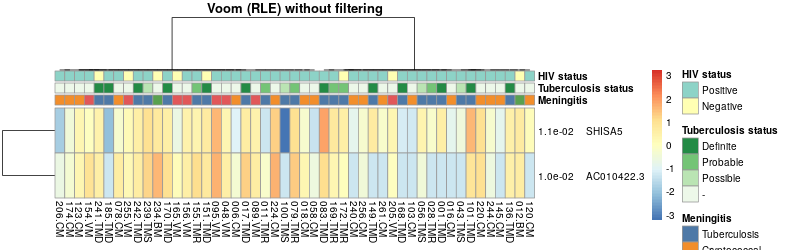

In [453]:
%%R -w 800 -h 250
simple_de_heatmap(
    significant.limma(voom_simple_rle), tmm_normalized_tb_subsets,
    main='Voom (RLE) without filtering'
)

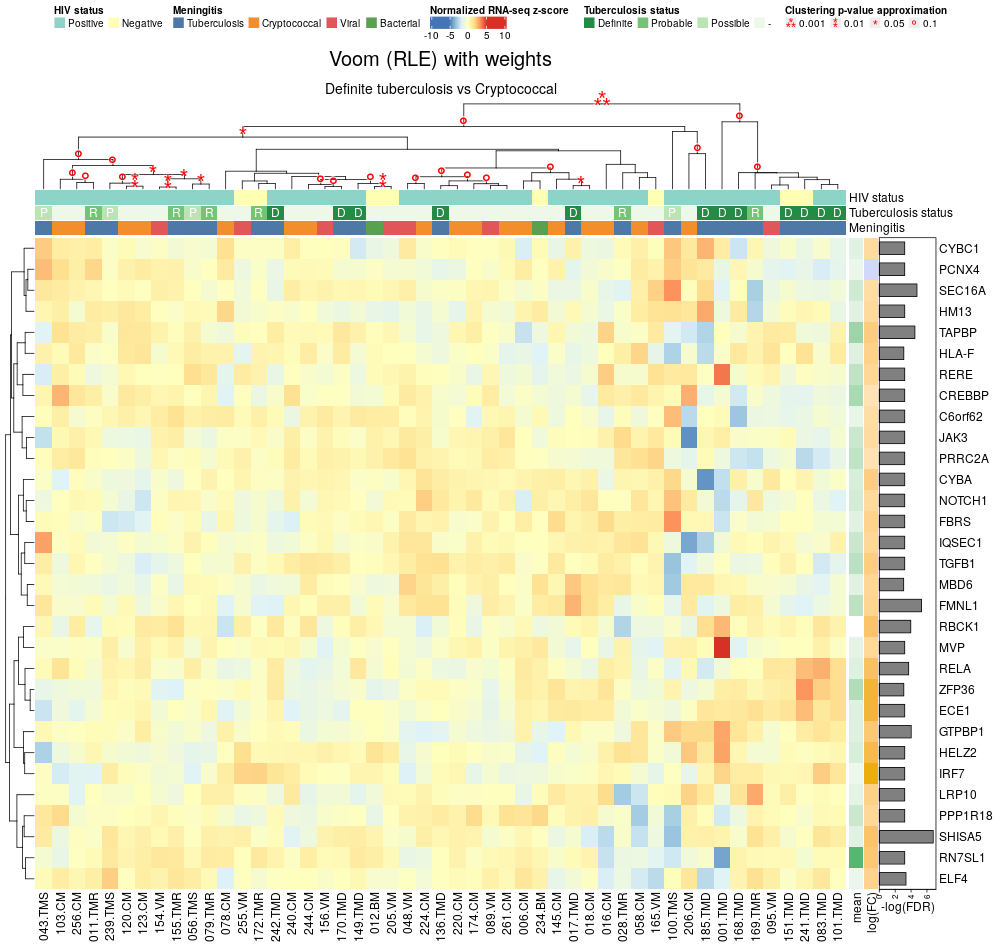

In [469]:
%%R -w 1000 -h 950 -i voom_weighted_rle

de_heatmap(
    significant.limma(voom_weighted_rle), rle_normalized_tb_subsets,
    major='Voom (RLE) with weights',
    minor='Definite tuberculosis vs Cryptococcal'
)

In [1434]:
%R head(as.data.frame(cpm(qtotal_normalized_tb_subsets, log=T)))

,001.TMD,006.CM,012.BM,016.CM,017.TMD,...,174.CM,011.TMR,043.TMS,078.CM,261.CM
ENSG00000000003,21.763353,21.042939,20.184175,23.459844,23.047481,...,20.689272,23.750757,23.310186,18.902513,22.918120
ENSG00000000419,18.902513,22.773932,24.185194,18.902513,24.538807,...,22.818008,21.701227,18.902513,25.595170,23.815839
ENSG00000000457,25.029903,24.916717,25.388249,24.698441,25.302079,...,25.004068,24.626243,20.601705,24.799739,25.445106
ENSG00000000460,23.606142,18.902513,24.640008,23.855986,22.368248,...,23.157720,23.689285,23.408584,18.902513,23.456732
ENSG00000000938,27.014342,27.230913,26.482569,27.610138,29.410123,...,27.001694,25.846705,26.626937,26.647766,26.529356
ENSG00000000971,18.902513,25.061397,24.158426,22.946862,22.677077,...,19.591899,24.102154,23.204582,23.874511,24.240669


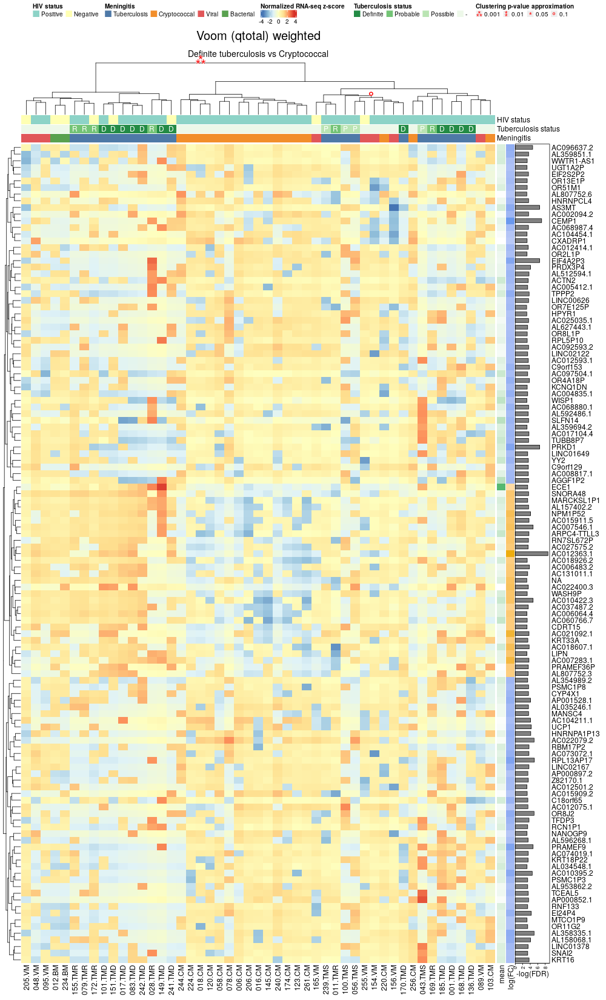

In [1422]:
%%R -w 1000 -h 1650 -i voom_weighted_qtotal

de_heatmap(
    significant.limma(voom_weighted_qtotal), qtotal_normalized_tb_subsets,
    major='Voom (qtotal) weighted',
    minor='Definite tuberculosis vs Cryptococcal'
)

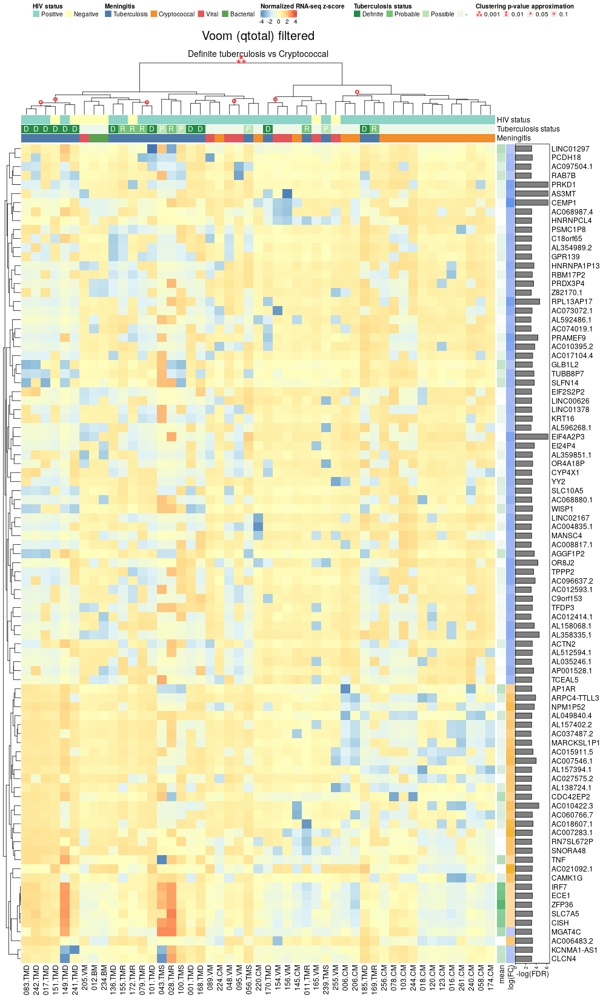

In [1410]:
%%R -w 1000 -h 1650 -i voom_filtered_qtotal

de_heatmap(
    significant.limma(voom_filtered_qtotal), qtotal_normalized_tb_subsets,
    major='Voom (qtotal) filtered',
    minor='Definite tuberculosis vs Cryptococcal'
)

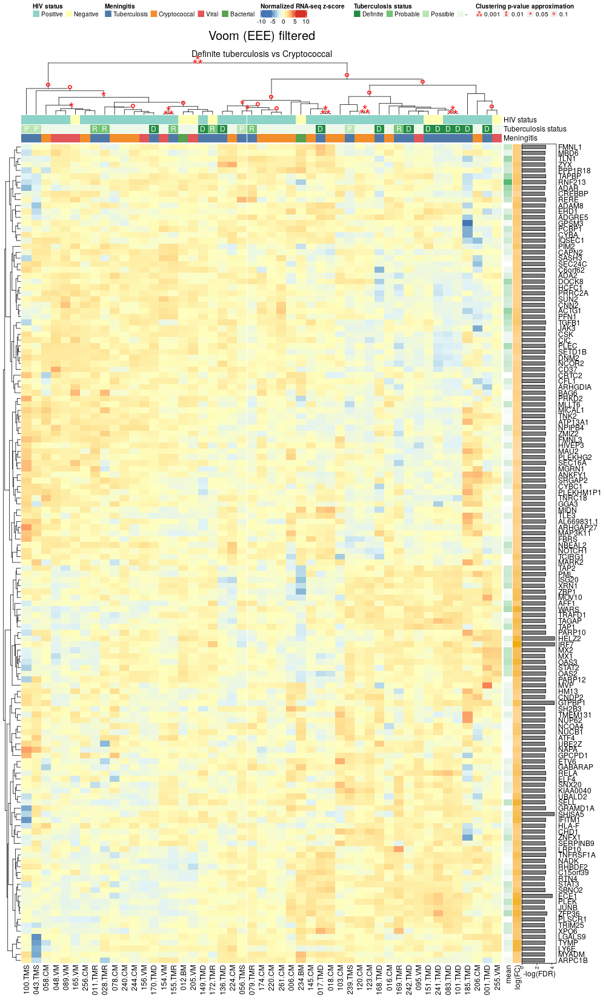

In [481]:
%%R -w 1000 -h 1650 -i voom_filtered_eee

de_heatmap(
    significant.limma(voom_filtered_eee), eee_normalized_tb_subsets,
    major='Voom (EEE) filtered',
    minor='Definite tuberculosis vs Cryptococcal'
)

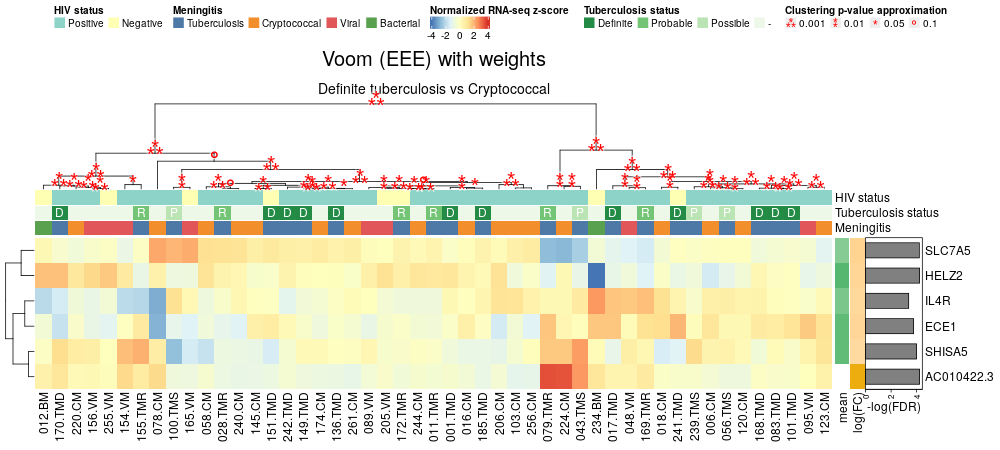

In [473]:
%%R -w 1000 -h 450 -i voom_weighted_eee

de_heatmap(
    significant.limma(voom_weighted_eee), eee_normalized_tb_subsets,
    major='Voom (EEE) with weights',
    minor='Definite tuberculosis vs Cryptococcal'
)

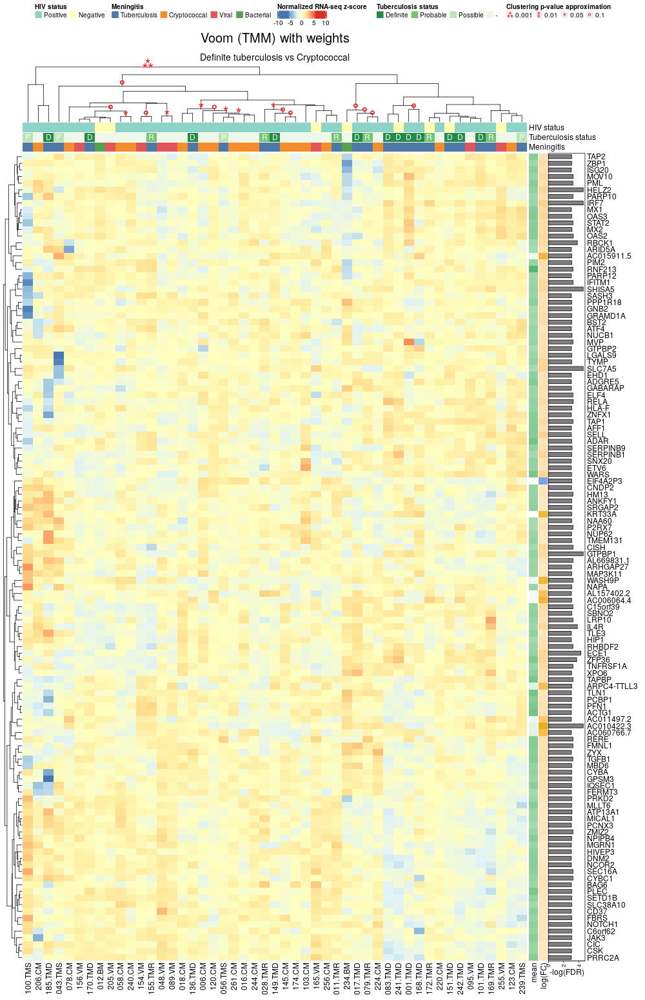

In [463]:
%%R -w 1000 -h 1550 -i voom_weighted_tmm

de_heatmap(
    significant.limma(voom_weighted_tmm), tmm_normalized_tb_subsets,
    major='Voom (TMM) with weights',
    minor='Definite tuberculosis vs Cryptococcal'
)

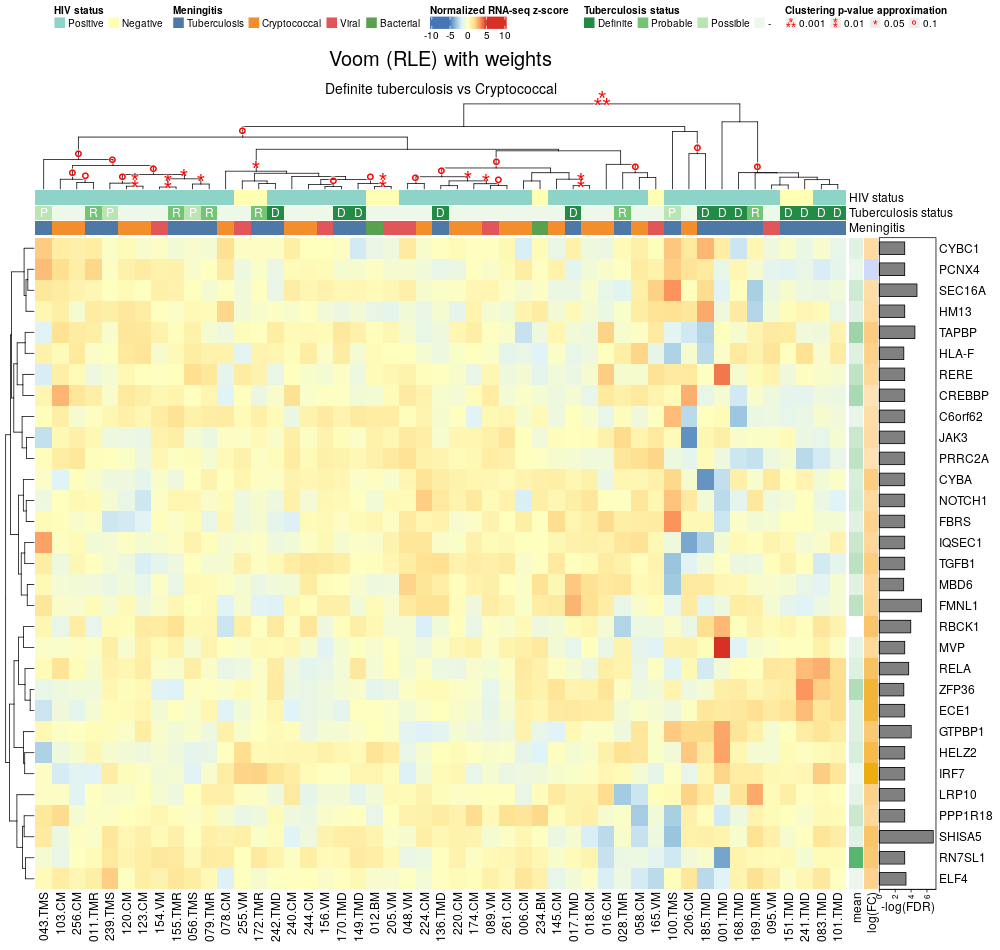

In [1973]:
%%R -w 1000 -h 950 -i voom_weighted_rle

de_heatmap(
    significant.limma(voom_weighted_rle), rle_normalized_tb_subsets,
    major='Voom (RLE) with weights',
    minor='Definite tuberculosis vs Cryptococcal'
)

In [1975]:
provided = reference_definite_tbm_cm_deg

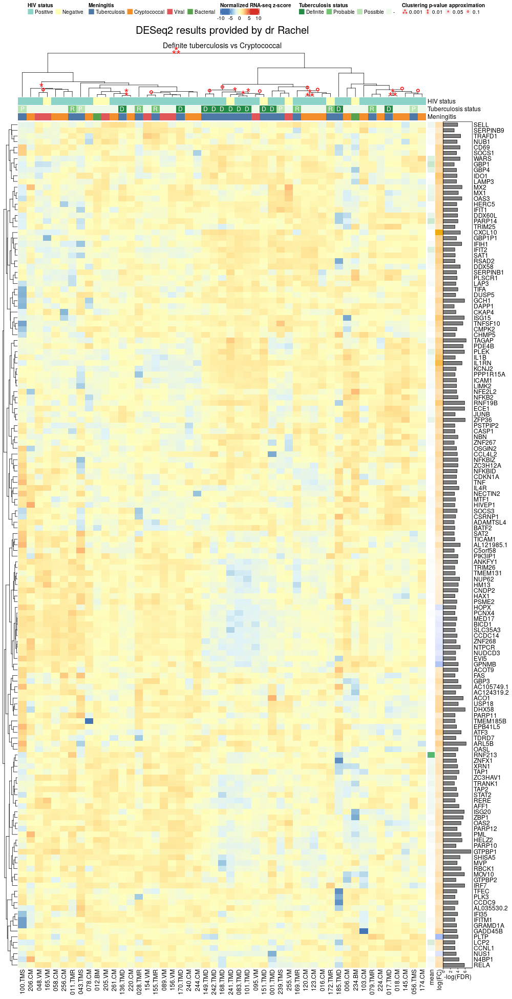

In [1977]:
%%R -w 1000 -h 1950 -i provided
de_heatmap(
    significant.deseq(provided), dds_reproduction,
    major='DESeq2 results provided by dr Rachel',
    minor='Definite tuberculosis vs Cryptococcal'
)

# Final results

I will generate three result sets:
 - voom-TMM
 - DESeq2
 - intersection of voom-TMM and DESeq2

If the number of significant DE genes without independent filtering for voom-TMM will remain as low for other contrasts, I will analyse these by hand as well.

Adding voom-RLE does not seem warranted as the example above shows that it provides little additional results different from voom-TMM; also, the results are expected to be similar to voom-TMM or DESeq2 because it shares large similarities with both of them.

If - as argued by some - the intersection can be restated as a certain percentage of top results of voom-TMM and DESeq2, it would not be a very useful thing to do. But it is not such simple (see paired plot above).

## With TB confidence subsets (definite/probable/possible)

In [221]:
voom_path = Path(results_path) / 'voom_tmm'
voom_path.mkdir(exist_ok=True, parents=True)

In [1876]:
%%R
import::here(collapse_ranking_clusters, .from='helpers/pathways.R')

some_greek_letters = data.frame(
    full=c('alpha', 'beta', 'gamma', 'epsilon'),
    abbreviation=c('\U03B1', '\U03B2', '\U03B3', '\U03B5')
)

collapse_by_clusters_and_topology = function(
    counts, pathways, collection, id_type,
    cluster_p_threshold=0.95,
    counts_transform=log2, damping_factor=0.25,
    nboot=1000, character_limit=100
) {
    pathways_counts = counts_to_pathways_space(counts, collection=collection, id_type=id_type)
    significant_counts = pathways_counts[rownames(pathways),]
    significant_counts = counts_transform(significant_counts + damping_factor)

    bootstrapped_clustering <- pvclust::pvclust(
        t(significant_counts), parallel=T,
        method.hclust="ward.D2", method.dist="correlation",
        nboot=nboot, quiet=T
    )
    highly_probable_clusters <- pvclust::pvpick(bootstrapped_clustering, alpha=cluster_p_threshold)

    cluster_names = names_for_pathway_clusters(
        highly_probable_clusters$clusters, pathways_data=collection, pathways_ranking=pathways,
        abbreviations=some_greek_letters, character_limit=character_limit
    )
    counts_collapsed = collapse_count_clusters(significant_counts, clusters=highly_probable_clusters$clusters, names=cluster_names)

    print(paste(
        'Chosen', length(highly_probable_clusters$clusters),
        'highly probable (p >= ', cluster_p_threshold, ') clusters'
    ))
    
    ranking_collapsed = collapse_ranking_clusters(
        get_significant_pathways(pathways),
        clusters=highly_probable_clusters$clusters,
        names=cluster_names,
        collapse=function(cluster) apply(cluster, 2, min)
    )
    
    list(counts=counts_collapsed, ranking=ranking_collapsed)
}

get_significant_pathways = function(pathways, fdr_threshold=0.05) {
    pathways[pathways$FDR < fdr_threshold,]
}

simple_pheatmap = function(counts_collapsed) {
    pheatmap(
        scale(counts_collapsed),
        show_colnames=T,
        show_rownames=T,
        annotation_col=counts_patient_annotations,
        #annotation_row=annotation_row,
        annotation_colors=patient_colors,
        clustering_method='ward.D2',
        clustering_distance_cols='correlation',
        cluster_rows=T,
        cluster_cols=T,
        scale='row',
        clustering_distance_rows='correlation'
    )
}

In [223]:
%%R
collapsed_voom_reactome_entrez = collapse_by_clusters_and_topology(
    tmm_normalized_tb_subsets, get_significant_pathways(sets_reactome_entrez, 0.01),
    collection=c2.cp.reactome, id_type='entrez',
    # note low bootstrap count and low fdr cutoff (for demonstration purposes)
    nboot=500, character_limit=100
)

[1] "Warning: parent node Signalling to ERKs will not be displayed"             
[2] "Warning: parent node Signalling to RAS will not be displayed"              
[3] "Warning: parent node Prolonged ERK activation events will not be displayed"
[1] "[ARMS-mediated activation | SHC1 events in EGFR signaling | SOS-mediated signalling | Shc Mediated Signalling]"
[2] "RAF/MAP kinase cascade"                                                                                        
[1] "Warning: parent node Signalling to ERKs will not be displayed"             
[2] "Warning: parent node Prolonged ERK activation events will not be displayed"
[1] "[Signalling to RAS | ARMS-mediated activation | SHC1 events in EGFR signaling | SOS-mediated signalling]"
[2] "RAF/MAP kinase cascade"                                                                                  
[1] "Cluster not fully consistent; consistent until 4 position in the FDR-based ranking (40%); consistency = 70%"
[1] "Top 3 pathways in th

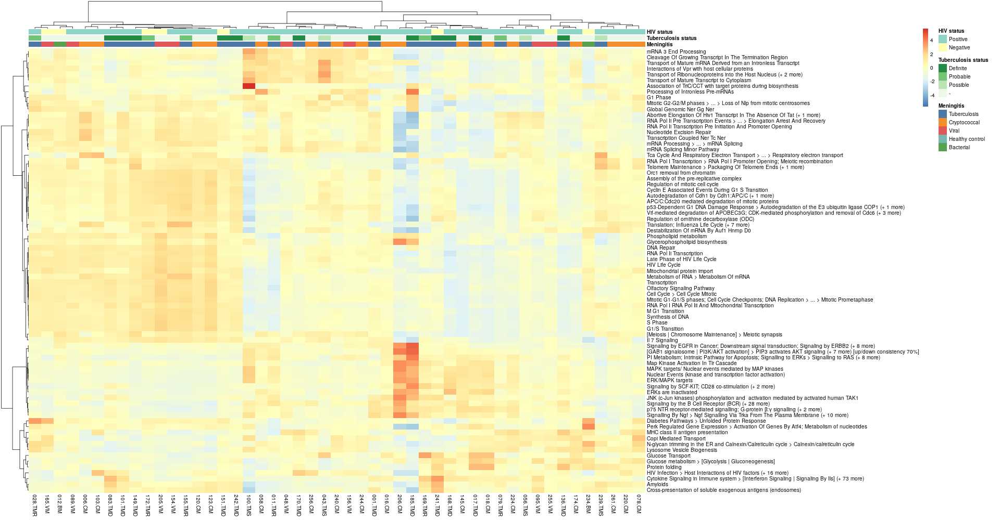

In [225]:
%%R -w 1920 -h 1000
simple_pheatmap(collapsed_voom_reactome_entrez$counts)

Creating a temporary cluster...done:
socket cluster with 7 nodes on host ‘localhost’
Multiscale bootstrap... Done.


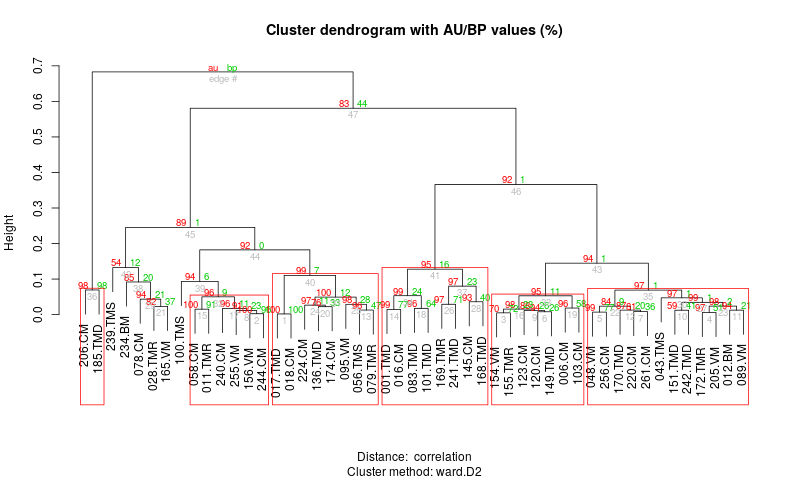

In [226]:
%%R -w 800
collapsed_patients_clustering <- pvclust::pvclust(
    scale(collapsed_voom_reactome_entrez$counts), parallel=T,
    method.hclust="ward.D2", method.dist="correlation"
)
plot(collapsed_patients_clustering)
pvclust::pvrect(collapsed_patients_clustering, alpha=0.95)

Creating a temporary cluster...done:
socket cluster with 7 nodes on host ‘localhost’
Multiscale bootstrap... Done.


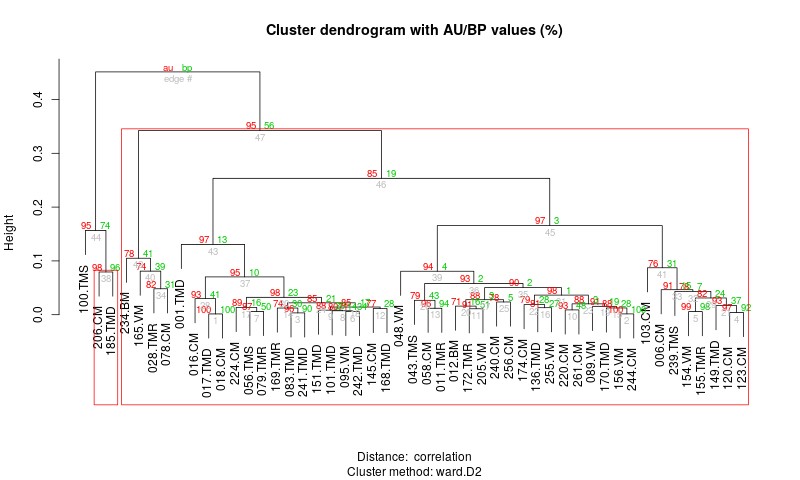

In [227]:
%%R -w 800
significant_counts = pathways_counts[
    rownames(get_significant_pathways(sets_reactome_entrez)),
]

patients_clustering <- pvclust::pvclust(
    scale(significant_counts), parallel=T,
    method.hclust="ward.D2", method.dist="correlation"
)
plot(patients_clustering)
pvclust::pvrect(patients_clustering, alpha=0.95)

In [1884]:
%%R
import::here(pvclust_heatmap, simple_clinical_annotation, .from='plots/complex_heatmap.R')

full_pathways_plot = function(counts_collapsed, pathways_collapsed, samples_clustering, main=NULL, major=NULL, minor=NULL) {
    title = compose_title(main, major, minor)
    pvclust_heatmap(
        counts_collapsed, samples_clustering, title,
        right_annotation=ComplexHeatmap::rowAnnotation(
            '-log(min(FDR))'=ComplexHeatmap::anno_barplot(
                -log(pathways_collapsed[,'FDR']),
                axis_param=list(side ='bottom'),
                width = unit(2, "cm")
            )
        ),
        column_names_rot=45,
    )
}

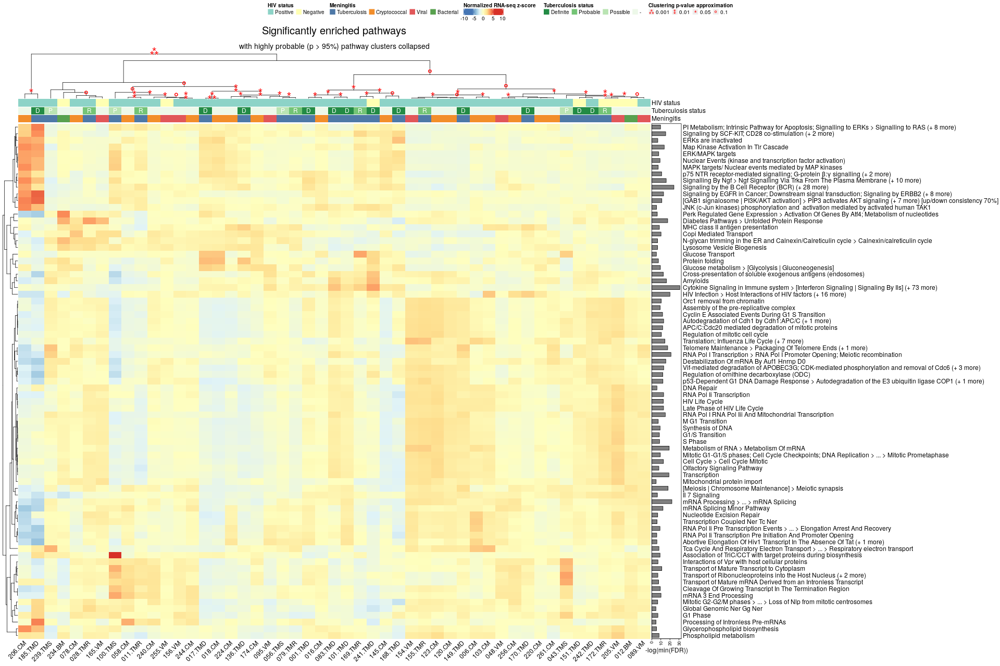

In [229]:
%%R -w 1920 -h 1280

full_pathways_plot(
    collapsed_voom_reactome_entrez$counts,
    pathways_collapsed=collapsed_voom_reactome_entrez$ranking,
    samples_clustering=collapsed_patients_clustering,
    major='Significantly enriched pathways',
    minor='with highly probable (p > 95%) pathway clusters collapsed'
)

In [1468]:
%%R
import::here(average_pathways_expression, .from='helpers/pathways.R')

In [1477]:
%%R
save_plot = function(plot, path, width=800, height=1000, units='px', device=png, ...) {
    dev.off()
    device(path, width=width, height=height, units=units)
    plot()    
}

run_limma_pathways_analysis = function(
    a, b,
    with_de_params, collection, id_type, analysis_name, contrast_id, counts, contrast_samples, out_path,
    include_filtered=T, collapse_pathways=FALSE
) {
    
    analysis_id = tolower(sub(' ', '_', analysis_name))
    
    path = paste0(out_path, 'pathways/')
    dir.create(file.path(out_path, 'pathways'), showWarnings = FALSE)

    dir.create(file.path(path, analysis_id), showWarnings = FALSE)
    path = paste0(path, analysis_id, '/')
    
    # this uses standard t-statistic, so no effect from the independent weighting
    voom_de_gene_sets = with_de_params(calc_camera, collection=collection, convert_to=id_type)
    
    voom_de_gene_sets$AveExpr = average_pathways_expression(
        counts, collection=collection, id_type,
        pathways_subset=rownames(voom_de_gene_sets),
    )
    write.csv(voom_de_gene_sets, paste0(path, analysis_id, '_', contrast_id, '.csv'))

    if(include_filtered) {   
        voom_de_gene_sets_filtered = add_p_value_for_filtered_subset(voom_de_gene_sets, fdr_threshold=0.05, expression_col='AveExpr', pvalue_col='PValue')
        write.csv(voom_de_gene_sets_filtered, paste0(path, analysis_id, '_pathways_filtered-', contrast_id, '.csv'))
    }
    
    top_pathways_heatmap = save_plot(
        plot=function() { gene_set_heatmap(
            head(voom_de_gene_sets, 50), counts, collection=collection, id_type=id_type,
            main=paste0(a, ' - ', b, ' top 50 pathways, showing all samples (', analysis_name, ', voom)'),
            trim=55
        ) },
        path=paste0(path, analysis_id, '_top_50_heatmap-', contrast_id, '.png'),
        width=900*1.2, height=1200*1.2
    )
    
    analysed_patients = names(contrast_samples[!contrast_samples])
    
    top_pathways_heatmap_analysed_contrast_only = save_plot(
        plot=function() { gene_set_heatmap(
            head(voom_de_gene_sets, 50), counts, collection=collection, id_type=id_type,
            main=paste0(a, ' - ', b, ' top 50 pathways (', analysis_name, ', voom)'),
            trim=55, skip_cols=c(outliers, analysed_patients)
        ) },
        path=paste0(path, analysis_id, '_top_50_heatmap-analysed_contrast_only-', contrast_id, '.png'),
        width=900*1.2, height=1200*1.2
    )
    
    pathways_counts = counts_to_pathways_space(counts, collection=collection, id_type=id_type)
    significant_counts = pathways_counts[rownames(get_significant_pathways(voom_de_gene_sets)),]
    significant_counts = log2(significant_counts + 0.25)
    
    if (nrow(significant_counts) == 0) {
        print(paste('Skipping: no significant pathways for', a, '-', b, analysis_name))
        return(NULL)
    }
    
    # more conservative
    patients_clustering <- pvclust::pvclust(
        scale(significant_counts), parallel=T,
        method.hclust="ward.D2", method.dist="correlation"
    )

    # better for full reactome which has a high degree of pathways redundance
    # but if may cluster too much sometimes
    #unbiased_patients_clustering <- pvclust::pvclust(
    #    scale(counts_collapsed), parallel=T,
    #    method.hclust="ward.D2", method.dist="correlation"
    #)

    save_plot(
        plot=function(){
            plot(
                patients_clustering,
                main=paste0(a, ' - ', b, ' based on significant pathways (', analysis_name, ', voom)')
            )
            pvclust::pvrect(patients_clustering, alpha=0.95)
        },
        path=paste0(path, analysis_id, '_based_clustering-', contrast_id, '.png'),
        width=900*1.2, height=500*1.2
    )
    
    if(collapse_pathways) {
        collapsed = collapse_by_clusters_and_topology(
            counts, get_significant_pathways(voom_de_gene_sets, 0.01),
            collection=collection, id_type=id_type,
            nboot=1000
        )
        save_plot(
            plot=function() {
                full_pathways_plot(
                    collapsed$counts,
                    pathways_collapsed=collapsed$ranking,
                    samples_clustering=patients_clustering,
                    major=paste0(a, ' - ', b, ' significant ($FDR < 0.01$) pathways (', analysis_name, ', voom)'),
                    minor='with highly probable ($p > 95%$) pathway clusters collapsed, showing all samples'
                )
            },
            path=paste0(path, analysis_id, '_heatmap-', contrast_id, '.png'),
            width=1920, height=250 + 15 * nrow(collapsed$counts)
        )

        skip_cols=c(outliers, analysed_patients)
        significant_counts = significant_counts[,!(colnames(significant_counts) %in% skip_cols)]
        counts = counts[,!(colnames(counts) %in% skip_cols)]
        patients_clustering <- pvclust::pvclust(
            scale(significant_counts), parallel=T,
            method.hclust="ward.D2", method.dist="correlation"
        )
        collapsed = collapse_by_clusters_and_topology(
            counts, get_significant_pathways(voom_de_gene_sets, 0.01),
            collection=collection, id_type=id_type,
            nboot=1000
        )
        
        save_plot(
            plot=function() {
                full_pathways_plot(
                    collapsed$counts,
                    pathways_collapsed=collapsed$ranking,
                    samples_clustering=patients_clustering,
                    major=paste0(a, ' - ', b, ' significant ($FDR < 0.01$) pathways (', analysis_name, ', voom)'),
                    minor='with highly probable ($p > 95%$) pathway clusters collapsed'
                )
            },
            path=paste0(path, analysis_id, '_heatmap-analysed_contrast_only-', contrast_id, '.png'),
            width=1920, height=250 + 15 * nrow(collapsed$counts)
        )
        
    }

}

In [1485]:
%%R

run_pairwise_de_analyses = function(conditions, normalization, out_path, ...) {
    # TODO: redirect output to a log file
    dir.create(file.path(out_path), showWarnings = FALSE)

    normalized_tb_subsets = preprocess_limma(
        raw_counts_matrix_no_outliers, by_condition_and_tb_subset_no_outliers,
        'Definite tuberculosis', method=normalization, ...
    )
    nm = normalization
    
    combinations = combn(conditions, 2, simplify=F)
    i = 0

    for(combination in combinations) {
        print(paste0('Progress: ', 100 * i / length(combinations), '%'))
        i = i + 1

        a = combination[1]
        b = combination[2]

        contrast_samples = by_condition_and_tb_subset_no_outliers == a | by_condition_and_tb_subset_no_outliers == b
        skip_cols = c(outliers, names(contrast_samples[!contrast_samples]))

        contrast_id = paste(a, b, sep='_vs_')

        # voom with quality sample weights, robust, TMM normalization
        # outlier samples defined as |z-score| > 2 removed,
        # independent weighting of hypotheses with IHW using mean expression as the independent hypothesis

        with_de_params = function(func, ...) {
            func(a, b, normalized_tb_subsets, by_condition_and_tb_subset_no_outliers, voom=T, quality_weights=T, ...)
        }

        voom_de = with_de_params(calc_de, confint=T)
        voom_de = add_p_value_for_weighted_hypothesis(voom_de)

        path = paste0(out_path, 'genes/')
        dir.create(file.path(out_path, 'genes'), showWarnings = FALSE)

        write.csv(voom_de, paste0(path, 'voom-', contrast_id, '.csv'))

        significant_count = nrow(significant.limma(voom_de))
        print(significant_count)

        significant_genes_heatmap = save_plot(
            plot=function() {
                de_heatmap(
                    significant.limma(voom_de), normalized_tb_subsets,
                    major=paste(a, '-', b, 'limma-voom differentially expressed genes'),
                    minor=paste0(nm, ', quality weights, robust, IHW $FDR<0.05$, showing all samples')
                )
            },
            path=paste0(path, 'heatmap-', contrast_id, '.png'),
            width=1000, height=250 + 15 * significant_count
        )

        significant_genes_heatmap_analysed_contrast_only = save_plot(
            plot=function() {
                de_heatmap(
                    significant.limma(voom_de), normalized_tb_subsets,
                    major=paste(a, '-', b, 'limma-voom differentially expressed genes'),
                    minor=paste0(nm, ', quality weights, robust, IHW $FDR<0.05$'),
                    skip_cols=c(outliers, names(contrast_samples[!contrast_samples]))
                )
            },
            path=paste0(path, 'heatmap-analysed_contrast_only-', contrast_id, '.png'),
            width=1000, height=250 + 15 * significant_count
        )


        # Pathways for msigdb
        run_limma_pathways_analysis(
            a, b,
            with_de_params, contrast_id=contrast_id, counts=normalized_tb_subsets, contrast_samples=contrast_samples,
            analysis_name='MSigDB Reactome', collection=c2.cp.reactome, id_type='entrez',
            collapse_pathways=TRUE, out_path=out_path
        )

        # Same but for full Reactome
        run_limma_pathways_analysis(
            a, b,
            with_de_params, contrast_id=contrast_id, counts=normalized_tb_subsets, contrast_samples=contrast_samples,
            analysis_name='Full Reactome', collection=reactome_new_symbol, id_type='symbol',
            out_path=out_path
        )
    }
}

In [1886]:
%%R -i results_path

voom_path = paste0(results_path, 'qtotal_tmm_no_scale/')
run_pairwise_de_analyses(
    c('Definite tuberculosis', 'Cryptococcal'),
    'qtotal',
    voom_path,
    rescale_lib=F,
    rescale_factor=F
)

[1] "Retaining: 59.29%"
[1] "Progress: 0%"
[1] 123
Creating a temporary cluster...done:
socket cluster with 7 nodes on host ‘localhost’
Multiscale bootstrap... Done.
[1] "Cluster not fully consistent; consistent until 18 position in the FDR-based ranking (52.94%); consistency = 94.12%"
[1] "Top 3 pathways in the inconsistent cluster:"
                                                     NGenes Direction
Signaling by the B Cell Receptor (BCR)                  118        Up
Downstream signaling events of B Cell Receptor (BCR)     90        Up
Apoptosis                                               139        Up
                                                           PValue          FDR
Signaling by the B Cell Receptor (BCR)               1.402173e-08 5.529996e-07
Downstream signaling events of B Cell Receptor (BCR) 3.116112e-08 1.045456e-06
Apoptosis                                            3.045993e-07 6.011357e-06
                                                         AveExpr
Si

In [ ]:
%%R -i results_path
stop('This analysis step takes too long to be included in automated builds')

conditions = unique(by_condition_and_tb_subset_no_outliers)

voom_path = paste0(results_path, 'voom_tmm/')
run_pairwise_de_analyses(conditions, 'TMM', voom_path)

Notes:
 - mRNA processing is highly correlated with HIV life cycle

## With aggregated TB samples

TODO

TODO: re-run protein!

TODO: recall citation for the fact that limma-trend gets less significant results and it is ok and what it means.

# Literature search

RNA-seq human cells 2015 Mbt against 6 other pathogens https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4653619/ also use limma+voom
(found with https://jhubiostatistics.shinyapps.io/recount/, search phrase tuberculosis)

In [ ]:
#!wget https://bitbucket.org/jdblischak/tb-data/raw/bc0f64292eb8c42a372b3a2d50e3d871c70c202e/table-s2.txt

In [ ]:
differential_expression_for_GSE67427 = read_table('table-s2.txt', index_col=0)
differential_expression_for_GSE67427.head()

- GC = Mycobacterium tuberculosis GC1237
- Rv = Mycobacterium tuberculosis (MTB) H37Rv
- Rv+ = heat-inactivated MTB H37Rv

In [ ]:
# absent
'ENSG00000269242' in differential_expression_for_GSE67427.index

In [ ]:
# significant_deseq2
# intersection_tmm
# show_table(differential_expression_for_GSE67427.loc[significant_deseq2].sort_values('GC.48.adj.P.Val'))

In [ ]:
def get_macrophage_differential_expression(prefix):
    return differential_expression_for_GSE67427.rename(columns=lambda x: x.replace(prefix + '.', ''))

In [ ]:
venn4({
    'TBM in CSF against CM: voom-TMM': significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_tmm']),
    'TBM in CSF against CM: DESeq2': significant_deseq2,
    'TB GC 48h in macrophages (against healthy): voom-TMM': significant_ensembl(get_macrophage_differential_expression('GC.48')),
    'TB RV 48h in macrophages (against healthy): voom-TMM': significant_ensembl(get_macrophage_differential_expression('Rv.48'))
}, fill='percent');

In [ ]:
venn4({
    'TBM in CSF against CM: voom-TMM': significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_tmm']),
    'TBM in CSF against CM: DESeq2': significant_deseq2,
    'TB GC 4h in macrophages (against healthy): voom-TMM': significant_ensembl(get_macrophage_differential_expression('GC.4')),
    'TB RV 4h in macrophages (against healthy): voom-TMM': significant_ensembl(get_macrophage_differential_expression('Rv.4'))
}, fill='percent');

In [ ]:
venn4({
    'TBM in CSF against CM: voom-TMM': significant_ensembl(definite_tb_cm_limma_cmp_filtered['voom_tmm']),
    'TBM in CSF against CM: DESeq2': significant_deseq2,
    'Yers 48h in macrophages (against healthy): voom-TMM': significant_ensembl(get_macrophage_differential_expression('Yers.48')),
    'Salm 48h in macrophages (against healthy): voom-TMM': significant_ensembl(get_macrophage_differential_expression('Salm.48'))
}, fill='percent');

Now, If I do TBM against everything and it improves the overlap percentage, we got (some kind of) an external validation!